# Creating Customer Segmentation for EVERYTHING PLUS: An Analysis of Household E-commerce Purchased History

**Analyst: Ica Candra R**<br>
July 2023<br>
<br>
**Reviewed by Anand Pandey**<br>
*Lead Data Scientist at AirAsia<br>
Has more than 7 years of experience in data science in various industries including Aviation, Retail, Automobile and Reinsurance*

<div class="alert alert-success" style="border: green 2px; padding: 20px">
<b>Reviewer's comment v1:</b>
    
<b>Overall Feedback</b> 
    
- Overall well done! I can see that a lot of effort has been made! Your project looks very good and you accomplished impressive results.
- You have included different ways to do the segmentation and clearly defined each segment. Your presentation also looks impressive and easy to understand by the stakeholders. So, Congratulations on completing this final project.
    
If you have any questions, remember that you can always reach out to me for any clarification.
    
</div>

## PROJECT DESCRIPTION

This project aims to improve customer segmentation for Everything Plus: Plus a Little Bit More, an e-commerce company specializing in household goods. The current customer segmentation approach does not effectively target customers, resulting in low conversion rates and user satisfaction. To address this issue, the project will analyze the transaction history data to identify patterns in consumer behaviour and develop a new customer segmentation strategy. The new segmentation will enable the company to create more personalized offers for different user groups, improving conversion rates, user satisfaction, revenue, and user retention.

### Objective
This project aims to develop a new customer segmentation approach by analyzing transaction history data. The new segmentation should enable the company to create more personalized offers for different user groups, leading to a minimum 5% increase in conversion rates, revenue, and user retention.

### Method

To achieve the project objective, the following steps will be taken:

1. **Data Preparation:** <br>
The transaction history data, including attributes such as `InvoiceNo`, `StockCode`, `Description`, `Quantity`, `InvoiceDate`, `UnitPrice`, and `CustomerID`, will be cleaned and preprocessed. This step involves handling missing values, removing duplicates, excluding discount/promo/cancel order/return/postage/other extra services transactions, and transforming the data into a suitable format for analysis.

2. **Exploratory Data Analysis:** <br>
The cleaned data will be explored to gain insights into customer behaviour. This analysis may involve examining patterns in purchase frequency, recency, monetary value, and quantity and identifying any other relevant patterns or trends. This step will also check seasonal impact and the customers' price preferences. 

3. **Statistical Hypotheses Test:** <br>
Check and validate the hypotheses from EDA

4. **Customer Segmentation:** <br>
Three approaches will be considered for customer segmentation: a) RFM (Recency, Frequency, Monetary), b) K-means clustering, and c) RFM combined with K-means. K-means clustering will group customers based on their transactional attributes, while RFM analysis will evaluate customers based on their recency, frequency, and monetary value. These techniques will help identify distinct customer segments with similar characteristics and behaviours.

5. **Evaluation:** <br>
The effectiveness of the new customer segmentation approach will be evaluated based on the success metrics defined earlier. The conversion rate, revenue, and retention will be monitored after implementing the new segmentation. The new segmentation approach will be considered successful if the desired 5% improvement is achieved for each metric, respectively.

6. **Recommendations:** <br>
Based on the analysis results, recommendations will be provided to the Product Manager and the team. These recommendations may include strategies for creating personalized offers, targeting specific customer segments, and refining the segmentation approach further.

Appropriate data visualization techniques and statistical analysis methods will be employed throughout the project to communicate the findings effectively. The project will involve collaboration with the Product Manager and the team to ensure that the new customer segmentation approach aligns with the company's goals and requirements.

## LIBRARIES AND DATASET

### Libraries

In [616]:
# import libraries will be used

import pandas as pd
import numpy as np

from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
from statsmodels.tsa.stattools import adfuller

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

import scipy.stats as stats

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
# !pip install yellowbrick

from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

### Load Dataset

In [617]:
# set maximum columns to display
pd.set_option('display.max_columns', None)

In [618]:
# load and retrieve dataset
raw_df = pd.read_csv('ecommerce_dataset_us.csv', sep='\t',
                     parse_dates=['InvoiceDate'], dtype={'CustomerID':'str'})
raw_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2018-11-29 08:26:00,2.55,17850
1,536365,71053,WHITE METAL LANTERN,6,2018-11-29 08:26:00,3.39,17850
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2018-11-29 08:26:00,2.75,17850
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2018-11-29 08:26:00,3.39,17850
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2018-11-29 08:26:00,3.39,17850


In [619]:
# check info on raw dataset
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(4)
memory usage: 28.9+ MB


In [620]:
# describe raw dataset
raw_df.describe(include='all').fillna('')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID
count,541909,541909,540455,541909.0,541909,541909.0,406829
unique,25900,4070,4223,,23260,,4372
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,,2019-10-29 14:41:00,,17841
freq,1114,2313,2369,,1114,,7983
first,,,,,2018-11-29 08:26:00,,
last,,,,,2019-12-07 12:50:00,,
mean,,,,9.55225,,4.611114,
std,,,,218.081158,,96.759853,
min,,,,-80995.0,,-11062.06,
25%,,,,1.0,,1.25,


**FINDINGS:**
- We spot missing values in `CustomerID` and `Description`
- The negative values from `Quantity` and `UnitPrice` might be the promotion/discount we should exclude
- The data cover transaction history from `2018-11-29` to `2019-12-07` (around one year), where the records on the first and the end month of dataset are not completed (`2018-11` and `2019-12`)
- One `StockCode` should refer to one `Description`, thus both columns should have the same number of unique values. However, we found the number of unique values from both columns differs.

## DATA PREPARATION


In this section, we will perform data preprocessing, which involves:

- Formatting columns
- Managing duplicates
- Handling missing values
- Excluding transactions related to discounts, promotions, canceled orders, and other services
- Enriching the dataset

To ensure the originality of the data, we will make a copy of the raw dataset.

In [621]:
# copy raw dataset
df = raw_df.copy()

### Formating Columns
In this section, we will adjust the columns' name to lowercase

In [622]:
# replace columns name to lowercase letter
df.columns = df.columns.str.lower()

# shorten and adjust columns name
df = df.rename(columns={'invoiceno':'invoice_no', 'stockcode':'stock_code',
                        'invoicedate':'date', 'unitprice':'unit_price',
                        'customerid':'uid'
                       }
              )

### Handling Explicit Duplicates

In [623]:
# remove duplicated rows
df = df.drop_duplicates()

print('Duplicated rows:', raw_df.duplicated().sum())
print('Total rows after removing duplicates:', len(df))

Duplicated rows: 5268
Total rows after removing duplicates: 536641


**Note**<br>
- We found duplicated rows and removed it

### Excluding transactions related to discounts/Promo/Canceled order/extra services fee, etc

We will exclude transactions related to `promotions`, `offers`, `returns`, `cancel order`, etc., from normal transactions. These values are identified as `negative` or `zero` values in the `quantity` or `unit_price` fields. Additionally, we will examine whether any `stock_code` corresponds to labels indicating those transactions.

In [624]:
# exclude negative and zero values in `quantity` and `unit_price`
df = df.loc[(df['quantity']>0) & (df['unit_price']>0)]

In [625]:
# check label related to extra services/promo/discount/etc in `stock_code`
sorted(df['stock_code'].unique(), reverse=True)

['m',
 'gift_0001_50',
 'gift_0001_40',
 'gift_0001_30',
 'gift_0001_20',
 'gift_0001_10',
 'S',
 'POST',
 'PADS',
 'M',
 'DOT',
 'DCGSSGIRL',
 'DCGSSBOY',
 'DCGS0076',
 'DCGS0070',
 'DCGS0069',
 'DCGS0004',
 'DCGS0003',
 'C2',
 'BANK CHARGES',
 'B',
 'AMAZONFEE',
 '90214Z',
 '90214Y',
 '90214W',
 '90214V',
 '90214U',
 '90214T',
 '90214S',
 '90214R',
 '90214P',
 '90214O',
 '90214N',
 '90214M',
 '90214L',
 '90214K',
 '90214J',
 '90214I',
 '90214H',
 '90214G',
 '90214F',
 '90214E',
 '90214D',
 '90214C',
 '90214B',
 '90214A',
 '90212C',
 '90212B',
 '90211B',
 '90211A',
 '90210D',
 '90210C',
 '90210B',
 '90210A',
 '90209C',
 '90209B',
 '90209A',
 '90208',
 '90206C',
 '90206A',
 '90205C',
 '90205A',
 '90204',
 '90202D',
 '90202C',
 '90202B',
 '90202A',
 '90201D',
 '90201C',
 '90201B',
 '90201A',
 '90200E',
 '90200D',
 '90200C',
 '90200B',
 '90200A',
 '90199D',
 '90199C',
 '90199B',
 '90199A',
 '90198B',
 '90198A',
 '90197B',
 '90196B',
 '90196A',
 '90195B',
 '90195A',
 '90194',
 '90192',
 '

In [626]:
# list `stock code` that will be excluded
excluded_list = ['m', 'gift_0001_50', 'gift_0001_40', 'gift_0001_30', 'gift_0001_20',
                 'gift_0001_10', 'S', 'POST', 'PADS', 'M', 'DOT', 'C2', 'BANK CHARGES',
                 'B', 'AMAZONFEE',]

In [627]:
# exclude those transactions
df = df.query('stock_code not in @excluded_list')

# check the result : ensure the `stock code` doesn't contain the `excluded_list`
df.query('stock_code in @excluded_list')

,invoice_no,stock_code,description,quantity,date,unit_price,uid


### Handling Implicit Duplicates

This section will ensure one `stock_code` refers to one `description`

**Implicit Duplicates in `description`**

In [628]:
# create table where one `stock_code` refers to one `description`
# remove duplicated descriptions by choose description that has the highest quantity

stock_desc = (df
             .groupby(['stock_code', 'description'], as_index=False)['quantity'].count()
             .drop_duplicates(subset='stock_code')
             .drop(columns='quantity')
            )

# check the result
stock_desc

,stock_code,description
0,10002,INFLATABLE POLITICAL GLOBE
1,10080,GROOVY CACTUS INFLATABLE
2,10120,DOGGY RUBBER
3,10123C,HEARTS WRAPPING TAPE
4,10124A,SPOTS ON RED BOOKCOVER TAPE
...,...,...
4141,DCGS0069,OOH LA LA DOGS COLLAR
4142,DCGS0070,CAMOUFLAGE DOG COLLAR
4143,DCGS0076,SUNJAR LED NIGHT NIGHT LIGHT
4144,DCGSSBOY,BOYS PARTY BAG


In [629]:
# validate the results
df.stock_code.nunique() == stock_desc.stock_code.nunique()

True

In [630]:
# check odd values in `description`
sorted(stock_desc.description.unique())

[' 4 PURPLE FLOCK DINNER CANDLES',
 " 50'S CHRISTMAS GIFT BAG LARGE",
 ' DOLLY GIRL BEAKER',
 ' I LOVE LONDON MINI BACKPACK',
 ' NINE DRAWER OFFICE TIDY',
 ' OVAL WALL MIRROR DIAMANTE ',
 ' RED SPOT GIFT BAG LARGE',
 ' SET 2 TEA TOWELS I LOVE LONDON ',
 ' SPACEBOY BABY GIFT SET',
 ' TOADSTOOL BEDSIDE LIGHT ',
 ' TRELLIS COAT RACK',
 '*Boombox Ipod Classic',
 '*USB Office Mirror Ball',
 '10 COLOUR SPACEBOY PEN',
 '12 COLOURED PARTY BALLOONS',
 '12 DAISY PEGS IN WOOD BOX',
 '12 EGG HOUSE PAINTED WOOD',
 '12 HANGING EGGS HAND PAINTED',
 '12 IVORY ROSE PEG PLACE SETTINGS',
 '12 MESSAGE CARDS WITH ENVELOPES',
 '12 PENCIL SMALL TUBE WOODLAND',
 '12 PENCILS SMALL TUBE RED RETROSPOT',
 '12 PENCILS SMALL TUBE SKULL',
 '12 PENCILS TALL TUBE POSY',
 '12 PENCILS TALL TUBE RED RETROSPOT',
 '12 PENCILS TALL TUBE SKULLS',
 '12 PENCILS TALL TUBE WOODLAND',
 '12 PINK HEN+CHICKS IN BASKET',
 '12 PINK ROSE PEG PLACE SETTINGS',
 '12 RED ROSE PEG PLACE SETTINGS',
 '15 PINK FLUFFY CHICKS IN BOX',
 '15CM CHR

**Manage Implicit Duplicates**

In [631]:
# standardize `stock_code` and `description` values in df
df = (df
        .merge(stock_desc, on=['stock_code'])
        .drop(columns='description_x')
        .rename(columns={'description_y':'description'})
     )

### Handling Missing Values
This section will check and handle the missingness in the `uid` columns.

In [632]:
# check missing values
df.isna().sum()

invoice_no          0
stock_code          0
quantity            0
date                0
unit_price          0
uid            131387
description         0
dtype: int64

**FINDINGS:**<br>
- There're still missing values in columns `uid` after removing duplicates and handling the implicit duplicates

**Missing Values in `uid`**

In [633]:
# check the ratio of missingness in `uid`
print('The ratio of missing values from the whole data:', len(df.loc[df['uid'].isna()])/len(df))

# check the ratio of missingness from total transactions
n_all_transactions = df['invoice_no'].nunique()
n_nan_transactions = df.loc[df['uid'].isna(), 'invoice_no'].nunique()
print('The ratio of missingness from total transactions:',  n_nan_transactions/n_all_transactions)

The ratio of missing values from the whole data: 0.25144056784495644
The ratio of missingness from total transactions: 0.06933697466241845


**FINDINGS:**<br>
- Although we missed up to 25% of rows in the dataset, the missingness contributed at most 7% of the total number of transactions.
- It appears that 7% of transactions without `uid` often involve purchases with a high number of items in a single transaction.

#### Indentify Pattern in NaN

**Identify pattern on missing `uid` and `invoice no`**

In [634]:
# list `invoice_no` with null values in `uid`
null_uid = df.loc[df['uid'].isna(), 'invoice_no']

# check whether there's non-null data contains `invoice_no` from null `uid`
non_null_uid = df.loc[~df['uid'].isna()]
non_null_uid.query('invoice_no in @null_uid')

,invoice_no,stock_code,quantity,date,unit_price,uid,description


**FINDINGS:**<br>
- If `uid` is missing for one entry, it means that all `uid` values in the corresponding invoice are also missing.

**Identify pattern on missing `uid` and transaction `date`**

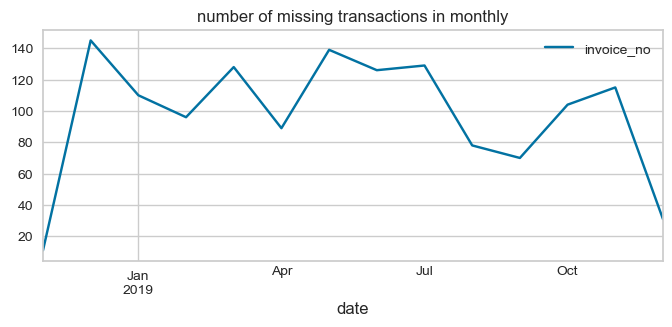

In [635]:
# identify missingness in `uid` related to transaction date `date`
nan_uid_date = (df
                 .loc[df['uid'].isna(), ['invoice_no', 'date']]
                 .set_index('date')
                 .resample('M')
                 .nunique()
                )

nan_uid_date.plot(kind='line', figsize=(8,3), title='number of missing transactions in monthly')
plt.show()

 **FINDING**<br>
 - The number of transactions with missing `uid` seems to be fluctuating and normal. I couldn't capture any significant pattern.

**Identify pattern on missing `uid` and transaction `stock_code`**

In [636]:
# identify missingness in `uid` related to `stock_code`
# check the `stock_code` that are often purchased by missing `uid`

nan_uid_stock_code = (df
                     .loc[df['uid'].isna(), ['stock_code', 'invoice_no']]
                     .groupby('stock_code')['invoice_no'].nunique()
                     .sort_values(ascending=False)
                    )

nan_uid_stock_code

stock_code
85099B    489
21931     410
22411     385
20712     371
22197     357
         ... 
84856S      1
84826       1
84806B      1
84805A      1
21586       1
Name: invoice_no, Length: 3395, dtype: int64

In [637]:
# check transaction distribution of `stock_code` purchased by missing `uid`
nan_uid_stock_code.describe()

count    3395.000000
mean       38.575258
std        48.632088
min         1.000000
25%         7.000000
50%        22.000000
75%        51.000000
max       489.000000
Name: invoice_no, dtype: float64

In [638]:
# check the amount transactions in percentile 90, 95, 99
np.percentile(nan_uid_stock_code, [90, 95, 99])

array([ 94.  , 128.  , 240.06])

In [639]:
# filter only `stock_code` with high number transactions
nan_uid_stock_code_filtered = nan_uid_stock_code.loc[nan_uid_stock_code>np.percentile(nan_uid_stock_code, 90)]

print('Number of stock code (items) that is often purchased by missing uid:', len(nan_uid_stock_code_filtered))

Number of stock code (items) that is often purchased by missing uid: 338


In [640]:
# check the contribution of that `stock_code` to the missing `uid`
n_sc_high_nan_trans = df.query('(stock_code in @nan_uid_stock_code_filtered.index) & (uid.isna())')['invoice_no'].nunique()
n_sc_high_nan_trans / n_nan_transactions

0.7928519328956966

 **FINDING**<br>
 - Up to 10% of items purchased by missing `uid` was found in 79% of transactions with missing `uid`. There might be some items that are most likely to be transacted by missing `uid`. This missingness may be due to its item
 
 **ACTION**<br>
 - We could investigate it by asking to the stakeholder

**Identify pattern on missing `uid` and `revenue` per transaction**

In [641]:
# calculate revenue
df['revenue'] = df['quantity']*df['unit_price']

In [642]:
# check revenue distribution in missing `uid`
rev_nan_uid = df.query('uid.isna()').groupby('invoice_no').agg({'revenue':'sum'})
print('check percentiles 55, 60, 65 and 90', np.percentile(rev_nan_uid, [55, 60, 65, 90]))
rev_nan_uid.describe()

check percentiles 55, 60, 65 and 90 [ 467.565  641.09  1004.86  2812.84 ]


,revenue
count,1371.000000
mean,1101.379781
std,2587.567752
min,0.420000
25%,18.475000
50%,360.330000
75%,1438.890000
max,52940.940000


In [643]:
# check revenue distribution in non-missing `uid`
rev_nonan_uid = df.query('uid.notnull()').groupby('invoice_no').agg({'revenue':'sum'})
print('check percentiles 80, 94, and 95', np.percentile(rev_nonan_uid, [80, 93, 95]))
rev_nonan_uid.describe()

check percentiles 80, 94, and 95 [ 537.      987.9246 1212.163 ]


,revenue
count,18402.000000
mean,474.797720
std,1678.785916
min,0.380000
25%,157.140000
50%,301.650000
75%,463.070000
max,168469.600000


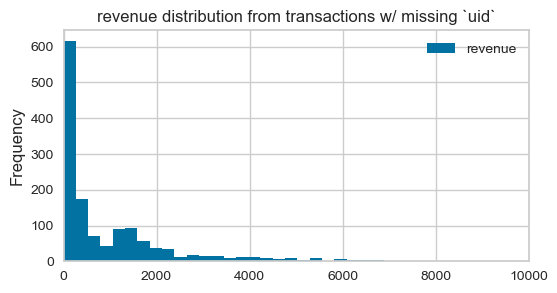

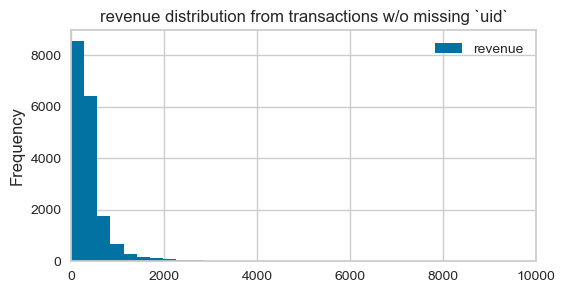

In [644]:
# check the revenue distributions from transactions with missing `uid`
rev_nan_uid.plot(kind='hist', bins=200, figsize=(6,3), title='revenue distribution from transactions w/ missing `uid`')
plt.xlim(0, 10000)  # Set the y-axis limits

# check the revenue distributions from transactions with non-missing `uid`
rev_nonan_uid.plot(kind='hist', bins=600, figsize=(6,3), title='revenue distribution from transactions w/o missing `uid`')
plt.xlim(0, 10000)  # Set the y-axis limits

plt.show()

 **FINDING**<br>
 - It seems that the transactions with missing `uid` contains many transactions with generate revenue of more than € 1000 in one transaction (>35%) compared to the transactions with recorded `uid` (<7%). 
 - The missing `uid` transactions may have many big occasional purchases (one-time transactions), where one transaction may only refer to one `uid`.

**Identify pattern on missing `uid` and typical number of transaction for each `uid`**

In [645]:
# get number of transactions for each `uid`
n_trans_per_uid = (df
                     .query('uid.notnull()')
                     .groupby('uid')['invoice_no'].nunique()
                    )

# check the distribution
n_trans_per_uid.describe()

count    4334.000000
mean        4.245962
std         7.634989
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       206.000000
Name: invoice_no, dtype: float64

In [646]:
# get the typical number of transaction for each uid
print('Typical number of transactions per customer:', n_trans_per_uid.mode()[0])

Typical number of transactions per customer: 1


In [647]:
# check the percentage of number transactions
n_trans_per_uid.value_counts(normalize=True).head()

1    0.347254
2    0.191740
3    0.115828
4    0.091140
5    0.054453
Name: invoice_no, dtype: float64

 **FINDING**<br>
 - Almost 35% of customers were one-time buyers.
 - Less than 5% of customers made transactions more than 5 in one year

#### Asumption Check

 **range revenue from one-time buyer**

In [648]:
# check the revenue range from customers who have 1,2, and 3 transactions

for i in range(1,6):
    i_trans_uid = n_trans_per_uid.loc[n_trans_per_uid==i]
    rev_i_trans_uid = (df
                       .query('uid in @i_trans_uid.index')
                       .groupby('invoice_no')['revenue'].sum()
                      )

    print(f'revenue range of {i} transactions')
    print(np.percentile(rev_i_trans_uid, [25, 50, 75, 90, 95, 99, 100]))
    print()

revenue range of 1 transactions
[  151.5      255.91     397.12     655.682    980.052   2061.3524
 77183.6   ]

revenue range of 2 transactions
[1.4445750e+02 2.5899500e+02 3.9065000e+02 6.4277900e+02 9.0238250e+02
 1.6640962e+03 1.6846960e+05]

revenue range of 3 transactions
[  146.115    273.62     412.5275   676.945   1046.38    2187.141
 38970.    ]

revenue range of 4 transactions
[ 150.5325  277.93    450.9575  753.116   952.67   1758.3548 3949.32  ]

revenue range of 5 transactions
[ 158.445   300.965   415.535   660.05    912.4185 1581.4195 4146.34  ]



 **INSIGHT**<br>
- Customers who make one to two transactions have a higher variation in spending. It could be attributed to the phenomenon of `one-time buying` behaviour, where customers happen to purchase a particular item.
- On the other hand, customers who engaged in regular purchasing habits, three or more transactions, tend to exhibit less variation in their spending amounts.

**ACTIONS**<br>
- We will remove any records where `uid` is missing. Since there is the possibility that Imputing these missing values may introduce bias, since we are analyzing each customer (customer-level analysis) is our main concern
- As alternative, We still can assume that 7% of transactions with missing `uid` are most likely as `one-time buying`. Thus, we will make second version of dataset where every unique invoice can be attributed as `uid`. 

#### Generate two versions of datasets

**Version 1 : Dropped missing values in `uid`**

In [649]:
# establish `clean_df` by dropping null `uid`
clean_df = df.dropna().reset_index(drop=True)

# check `clean_df` info
print(f'Total rows in clean df:', len(clean_df))
print(f'Ratio clean to df:', round(len(clean_df)/len(df),2))
print()
clean_df.info()

Total rows in clean df: 391150
Ratio clean to df: 0.75

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 391150 entries, 0 to 391149
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoice_no   391150 non-null  object        
 1   stock_code   391150 non-null  object        
 2   quantity     391150 non-null  int64         
 3   date         391150 non-null  datetime64[ns]
 4   unit_price   391150 non-null  float64       
 5   uid          391150 non-null  object        
 6   description  391150 non-null  object        
 7   revenue      391150 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 23.9+ MB


In [650]:
# describe clean_df
clean_df.describe(include='all').fillna('')

,invoice_no,stock_code,quantity,date,unit_price,uid,description,revenue
count,391150,391150,391150.0,391150,391150.0,391150,391150,391150.0
unique,18402,3659,,17166,,4334,3641,
top,576339,85123A,,2019-11-12 15:27:00,,17841,CREAM HANGING HEART T-LIGHT HOLDER,
freq,541,2023,,541,,7667,2023,
first,,,,2018-11-29 08:26:00,,,,
last,,,,2019-12-07 12:50:00,,,,
mean,,,13.1453,,2.874372,,,22.337281
std,,,180.807831,,4.284738,,,310.932442
min,,,1.0,,0.04,,,0.06
25%,,,2.0,,1.25,,,4.95


**Version 2 : Preserve missing values in `uid`, assume as `one-time buyers`**

In [651]:
# establish `clean_df` by dropping null `uid`
clean_df_full = df.copy()
clean_df_full['uid'] = clean_df_full['uid'].fillna(clean_df_full['invoice_no'])

# check `clean_df` info
print(f'Total rows in clean_df_full df:', len(clean_df_full))
print(f'Ratio clean to df:', round(len(clean_df_full)/len(df),2))
print()
clean_df_full.info()

Total rows in clean_df_full df: 522537
Ratio clean to df: 1.0

<class 'pandas.core.frame.DataFrame'>
Int64Index: 522537 entries, 0 to 522536
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoice_no   522537 non-null  object        
 1   stock_code   522537 non-null  object        
 2   quantity     522537 non-null  int64         
 3   date         522537 non-null  datetime64[ns]
 4   unit_price   522537 non-null  float64       
 5   uid          522537 non-null  object        
 6   description  522537 non-null  object        
 7   revenue      522537 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 35.9+ MB


In [652]:
# describe clean_df
clean_df_full.describe(include='all').fillna('')

,invoice_no,stock_code,quantity,date,unit_price,uid,description,revenue
count,522537,522537,522537.0,522537,522537.0,522537,522537,522537.0
unique,19773,3907,,18332,,5705,3782,
top,573585,85123A,,2019-10-29 14:41:00,,17841,CREAM HANGING HEART T-LIGHT HOLDER,
freq,1112,2253,,1112,,7667,2253,
first,,,,2018-11-29 08:26:00,,,,
last,,,,2019-12-07 12:50:00,,,,
mean,,,10.643043,,3.273997,,,19.610514
std,,,156.594571,,4.393177,,,269.938863
min,,,1.0,,0.04,,,0.06
25%,,,1.0,,1.25,,,3.9


 **FINDINGS**<br>
- We have successfully eliminated negative values, zero values, extra services/promo transactions, duplicates, and missing values.
- The `clean_df` dataset retains approximately 75% of the data from the used dataset (`df`).
- `clean_df` exhibits slightly different distributions in the `quantity`, `unit_price`, and `revenue` compared to `clean_df_full`.
- `clean_df` has lower mean values in `unit_price` but higher mean values in `quantity` and `revenue` when compared to `clean_df_full`.

### Enriching Datasets

In [653]:
# create function to enrich dataset

def enrich_dataset(dataframe):
    
    # add `day` column
    dataframe['day'] = dataframe['date'].dt.date


    # get the first purchasing date of each customer
    first_buy = (dataframe
                 .groupby('uid')['date'].min()
                 .reset_index()
                 .rename(columns={'date':'first_buy'})
                )

    # get the latest purchasing date of each customer
    last_buy = (dataframe
                 .groupby('uid')['date'].max()
                 .reset_index()
                 .rename(columns={'date':'last_buy'})
                )

    # add 'first_buy' and `last_buy` column
    dataframe = (dataframe
                .merge(first_buy, on='uid')
                .merge(last_buy, on='uid')
               )

    # change columns `revenue` to `monetary`
    dataframe.rename(columns={'revenue':'monetary'}, inplace=True)

    # add latest purchase
    latest_date = pd.to_datetime('2019-12-08')
    ## calculate `recency` for each transaction
    dataframe['recency'] = (latest_date - dataframe['date']).dt.days
    
    return dataframe

#### `clean_df`

This section will enrich and retrieve preprocessed dataset (`clean_df`).<br>

In [654]:
# enrich and retrieve clean_df
clean_df = enrich_dataset(clean_df)
clean_df.tail()

,invoice_no,stock_code,quantity,date,unit_price,uid,description,monetary,day,first_buy,last_buy,recency
391145,571439,23515,12,2019-10-15 13:25:00,2.08,17206,EMBROIDERED RIBBON REEL DAISY,24.96,2019-10-15,2019-10-15 13:25:00,2019-10-15 13:25:00,53
391146,571439,23514,12,2019-10-15 13:25:00,2.08,17206,EMBROIDERED RIBBON REEL SALLY,24.96,2019-10-15,2019-10-15 13:25:00,2019-10-15 13:25:00,53
391147,571439,23518,12,2019-10-15 13:25:00,2.89,17206,EMBROIDERED RIBBON REEL RACHEL,34.68,2019-10-15,2019-10-15 13:25:00,2019-10-15 13:25:00,53
391148,571439,23513,12,2019-10-15 13:25:00,2.08,17206,EMBROIDERED RIBBON REEL SUSIE,24.96,2019-10-15,2019-10-15 13:25:00,2019-10-15 13:25:00,53
391149,571439,23516,12,2019-10-15 13:25:00,3.75,17206,EMBROIDERED RIBBON REEL SOPHIE,45.00,2019-10-15,2019-10-15 13:25:00,2019-10-15 13:25:00,53


#### `clean_df_full`

This section will enrich and retrieve preprocessed the second version of dataset (`clean_df_full`).<br>

In [655]:
# enrich and retrieve clean_df_full
clean_df_full = enrich_dataset(clean_df_full)
clean_df_full.tail()

,invoice_no,stock_code,quantity,date,unit_price,uid,description,monetary,day,first_buy,last_buy,recency
522532,571910,23480,1,2019-10-17 15:09:00,3.75,571910,MINI LIGHTS WOODLAND MUSHROOMS,3.75,2019-10-17,2019-10-17 15:09:00,2019-10-17 15:09:00,51
522533,578823,23553,6,2019-11-23 14:00:00,12.50,578823,LANDMARK FRAME CAMDEN TOWN,75.00,2019-11-23,2019-11-23 14:00:00,2019-11-23 14:00:00,14
522534,579289,23497,1,2019-11-27 11:11:00,1.45,579289,CLASSIC CHROME BICYCLE BELL,1.45,2019-11-27,2019-11-27 11:11:00,2019-11-27 11:11:00,10
522535,579289,23552,2,2019-11-27 11:11:00,2.08,579289,BICYCLE PUNCTURE REPAIR KIT,4.16,2019-11-27,2019-11-27 11:11:00,2019-11-27 11:11:00,10
522536,579289,23498,1,2019-11-27 11:11:00,1.45,579289,CLASSIC BICYCLE CLIPS,1.45,2019-11-27,2019-11-27 11:11:00,2019-11-27 11:11:00,10


## ANALYSIS APPROACH TO IDENTIFY CUSTOMERS' BEHAVIOUR (EDA)

### Function Lists

#### Seasonal Analysis

**Create Time Series Data**

In [656]:
# create function to aggregate and establish dataset into time basis
def to_time_series (time_basis, dataframe):
    temp = (dataframe
           .set_index('date')
           .resample(time_basis)
           .agg({'uid':'nunique', 'invoice_no':'nunique',
                 'monetary':'sum', 'stock_code':'nunique'})
           # .reset_index()
           .rename(columns={'invoice_no':'n_transactions', 'stock_code':'n_items'})
          )

    return temp

**Time Series Analysis : Stationarity Check**

In [657]:
# create function to check stationarity
# H0/null hypothesis = non-stationarity
# if p_value < 0.05, reject null hypothesis --> stationary

def stationarity_check (time_series_data, variable):
    adfuller_result = adfuller(time_series_data[variable], autolag='AIC')
    p_value = adfuller_result[1]
    alpha = 0.05

    if p_value < alpha:
        print('p-value :', p_value)
        print('reject HO : Time series data is STATIONARY \nThe data exhibits no or minimal seasonality.')
    else:
        print('p-value :', p_value)
        print('failed to reject H0 : Time series data is NON-STATIONARY \nThe data may exhibit seasonality or other trends.')

**Time Series Analysis : Seasonality Check**

In [658]:
# create function to perform additive decomposition to time series data
def add_decomposition (time_series_data, variable) :
    try:
        # time series decomposition
        add_result = seasonal_decompose(time_series_data[variable], model='additive', period=1)
        plt.rcParams.update({'figure.figsize':(10,6)})
        add_result.plot()
    except:
        print('Can not perform additive decomposition')
        
        
        
# create function to perform multiplicative decomposition to time series data
def mul_decomposition (time_series_data, variable) :
    try:
        add_result = seasonal_decompose(time_series_data[variable], model='multiplicative', period=1)
        plt.rcParams.update({'figure.figsize':(10,6)})
        add_result.plot()
    except:
        print('Can not perform multiplicative decomposition')
    

 #### Percentile check

**Check Percentile**

In [659]:
# check percentile
def check_p(series):
    ''' 
    This function calculates the percentile 90th, 95th, and 99th in the series dataset.
    Thus, we can detect threshold value which is considered outliers.
    '''
    temp = np.percentile(series, [90,95,99])
    return temp, print('The 90th percentile is:', temp[0],
          '\nThe 95th percentile is:', temp[1],
          '\nThe 99th percentile is:', temp[2]
         )

### Seasonal Analysis

This section will analyze the transaction frequency, total spending (monetary), number of unique customers, and total items based on specific time series in one year. We will check any patterns and highlight trends that may influence customer behaviours.

#### `clean_df` version

 **Data Preparation**

In [660]:
 # apply the function to establish time series data
agg_month = to_time_series('M', clean_df)
agg_day = to_time_series('D', clean_df)

# define variable check for looping
variable_check = ['uid', 'n_transactions', 'monetary', 'n_items']

**Identifying Seasonality on a Monthly Basis**

In [661]:
# stationarity check
for i in variable_check:
    print('STATIONARITY CHECK IN', i.upper())
    stationarity_check(agg_month, i)
    print('--------------------------------------------')
    print()

STATIONARITY CHECK IN UID
p-value : 0.8709449351492097
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_TRANSACTIONS
p-value : 0.9429573429204785
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN MONETARY
p-value : 0.06388070029988122
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_ITEMS
p-value : 0.9983616657648927
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------



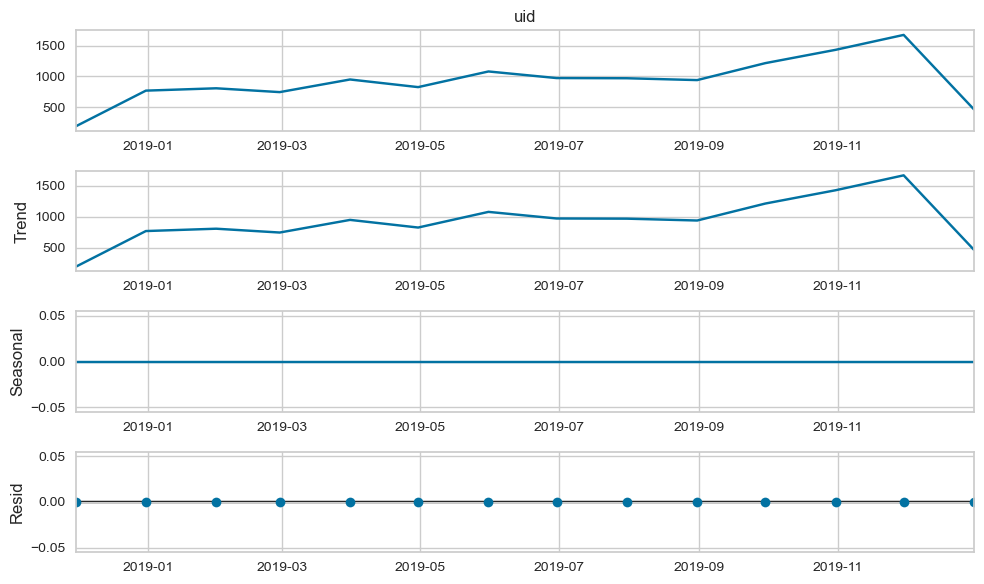

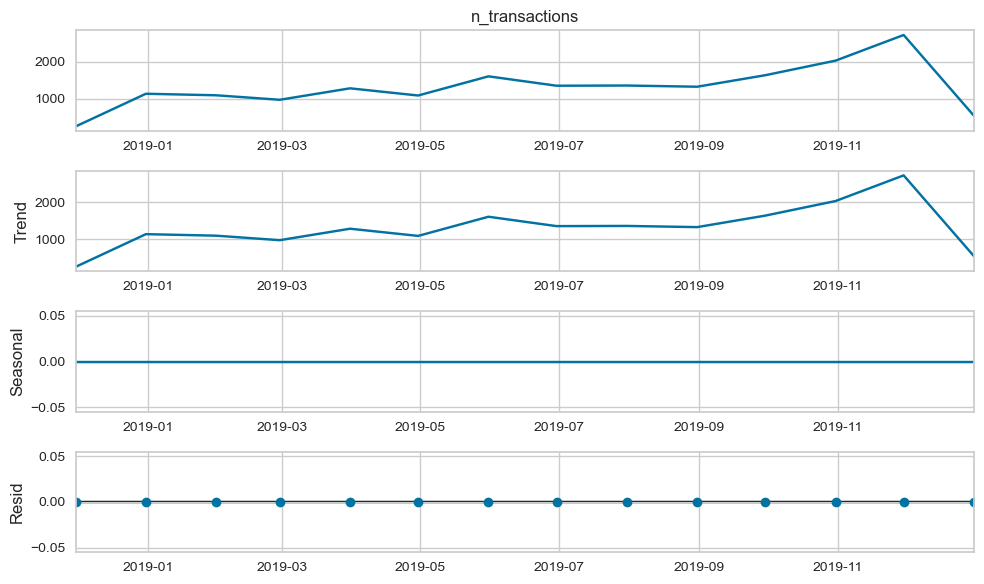

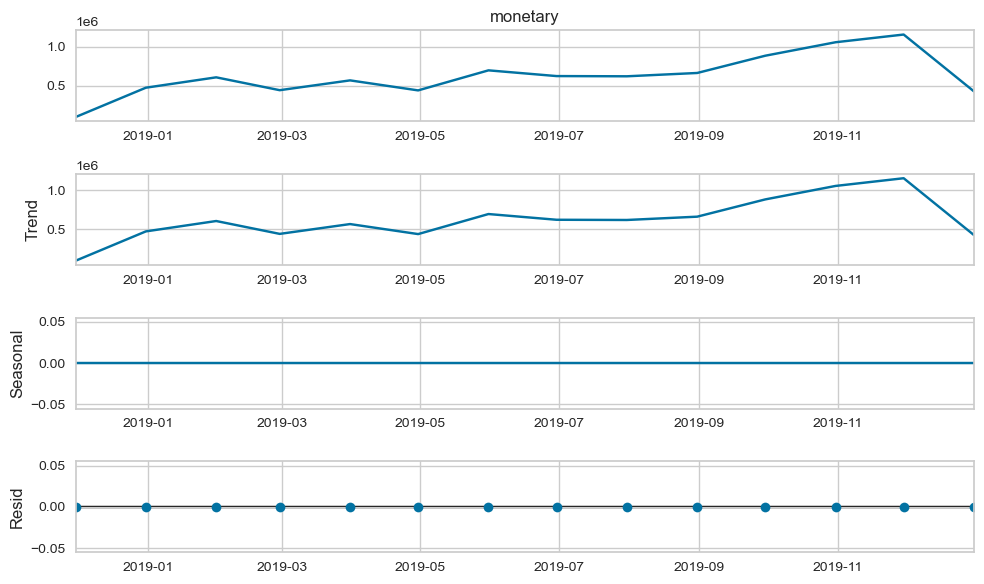

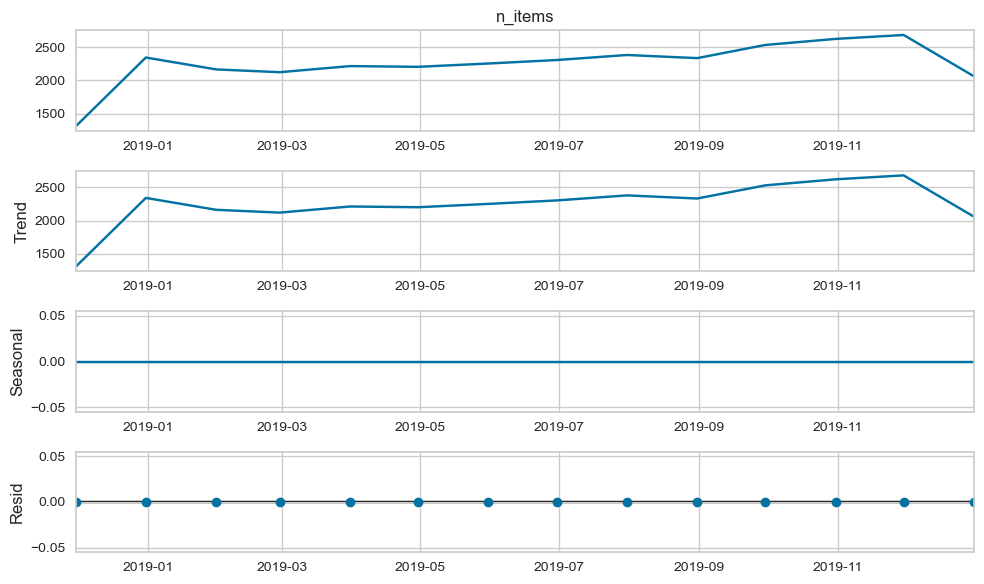

In [662]:
# additive decomposition of time series: monthly basis
for i in variable_check:
    add_decomposition(agg_month, i)

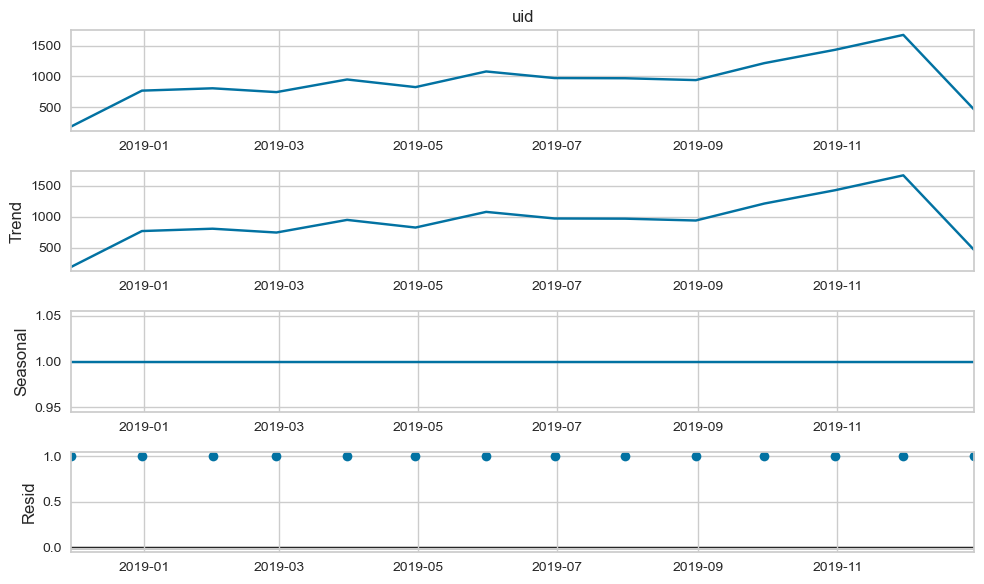

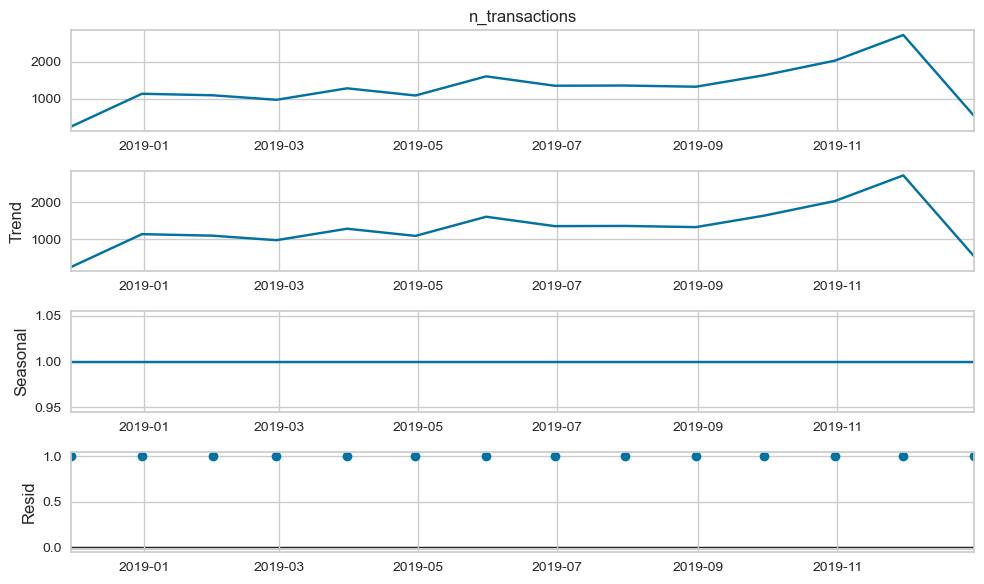

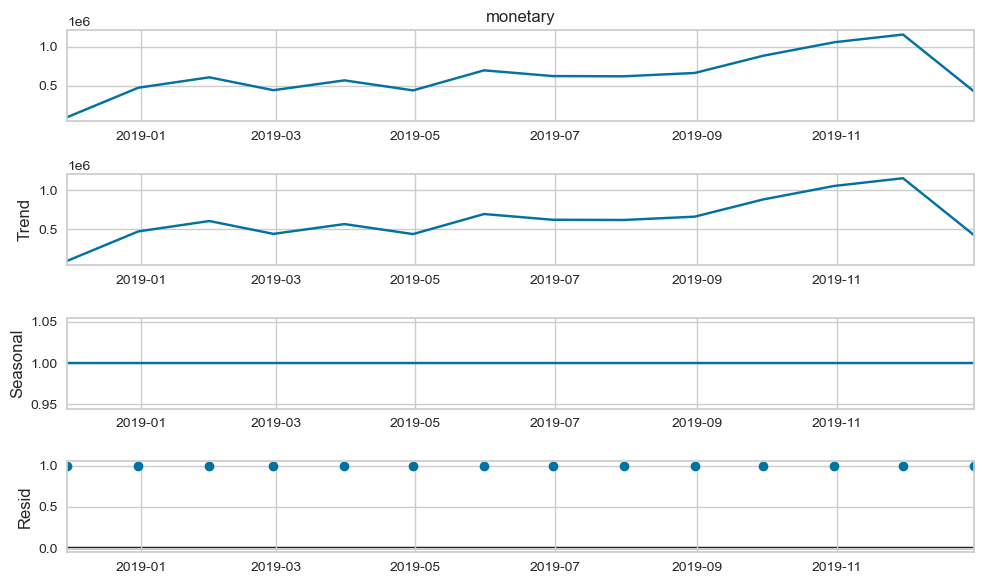

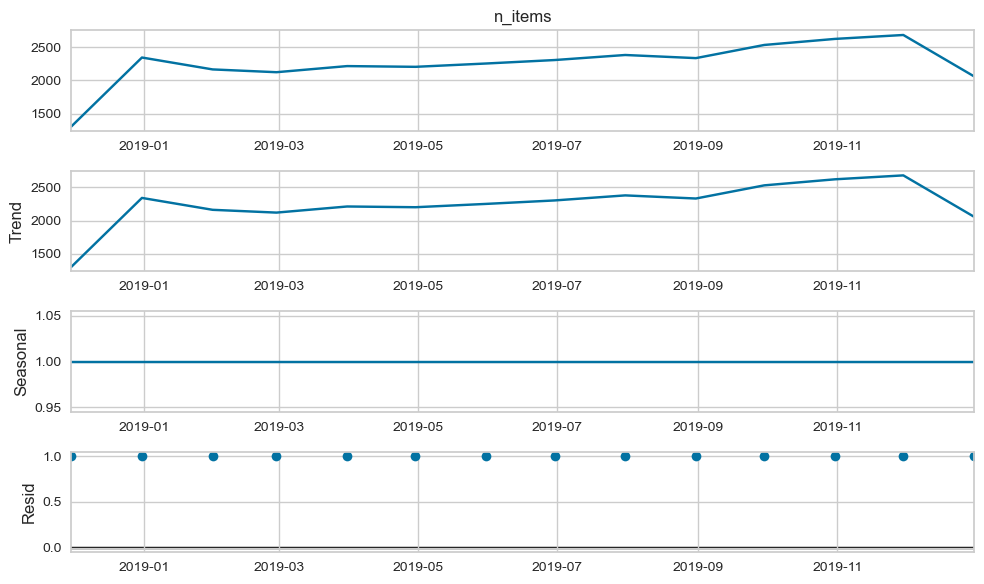

In [663]:
# multiplicative decomposition of time series: monthly basis
for i in variable_check:
    mul_decomposition(agg_month, i)

**Identifying Seasonality on a Daily Basis**

In [664]:
# stationarity check
for i in variable_check:
    print('STATIONARITY CHECK IN', i.upper())
    stationarity_check(agg_day, i)
    print('--------------------------------------------')
    print()

STATIONARITY CHECK IN UID
p-value : 0.2143117152306273
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_TRANSACTIONS
p-value : 0.08265094678116247
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN MONETARY
p-value : 0.7643389173437866
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_ITEMS
p-value : 0.32498813683242445
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------



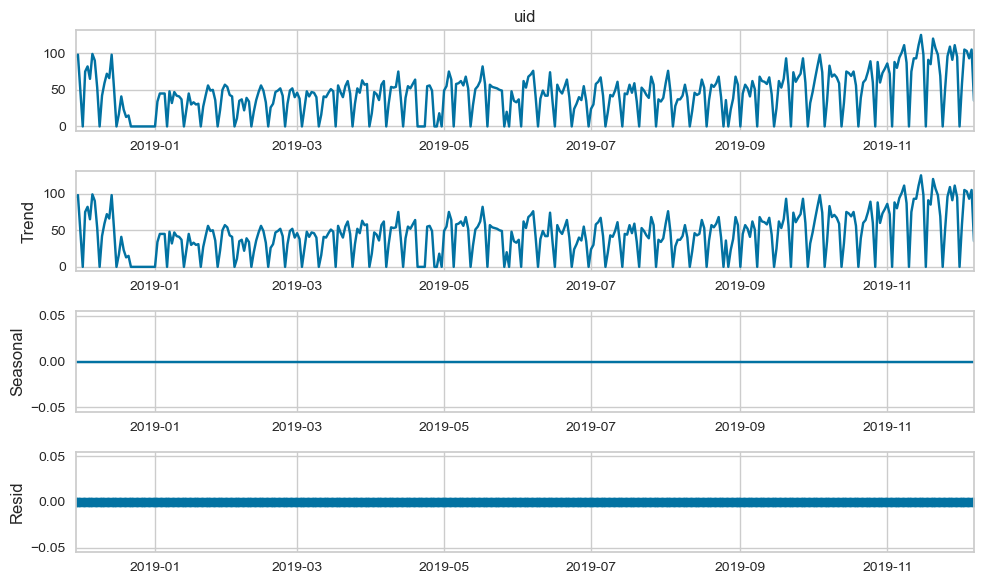

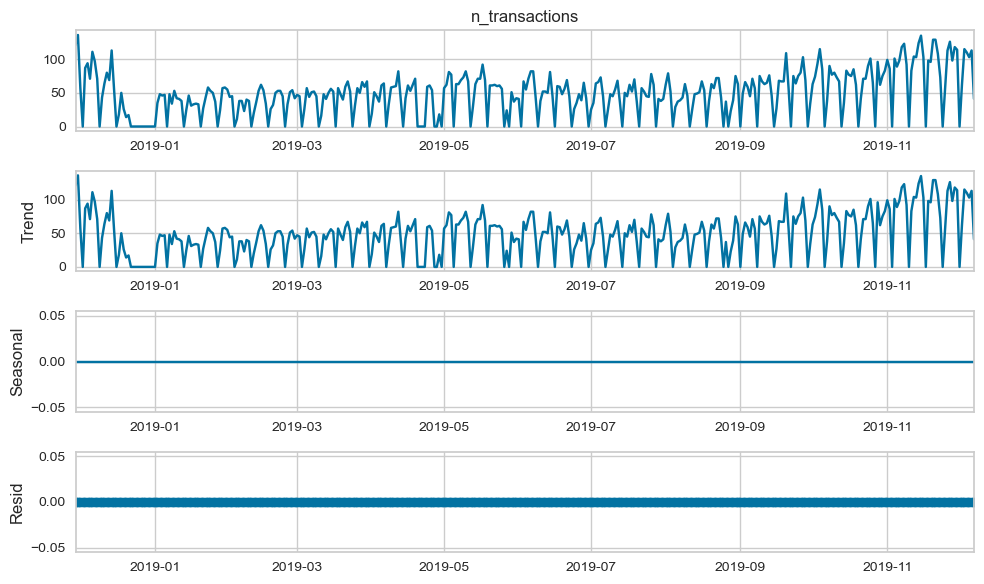

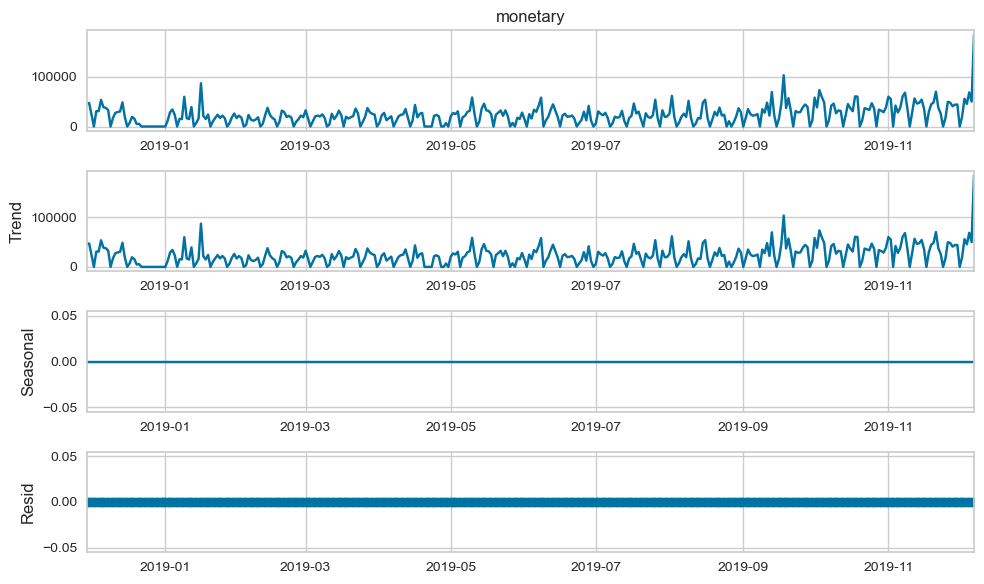

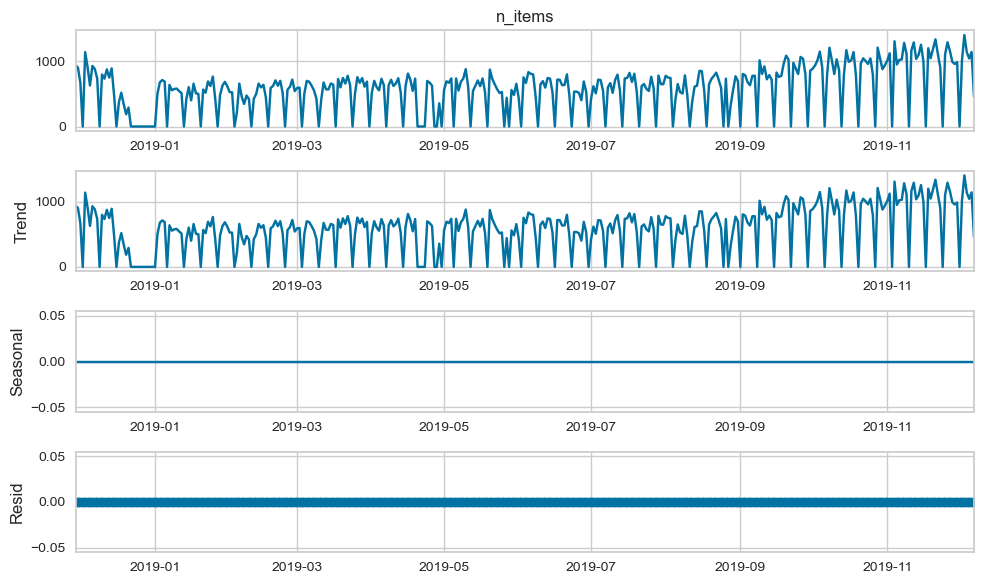

In [665]:
# additive decomposition of time series: daily basis
for i in variable_check:
    add_decomposition(agg_day, i)

In [666]:
# multiplicative decomposition of time series: daily basis
for i in variable_check:
    mul_decomposition(agg_day, i)

Can not perform multiplicative decomposition
Can not perform multiplicative decomposition
Can not perform multiplicative decomposition
Can not perform multiplicative decomposition


In [667]:
# check date where the all variables have zero values
agg_day.query('uid==0').resample('M')['uid'].count()

date
2018-12-31    13
2019-01-31     5
2019-02-28     4
2019-03-31     5
2019-04-30     9
2019-05-31     5
2019-06-30     5
2019-07-31     4
2019-08-31     5
2019-09-30     5
2019-10-31     4
2019-11-30     4
2019-12-31     1
Freq: M, Name: uid, dtype: int64

**FINDINGS:**<br>
- According to additive time series decomposition, we obtained seasonal and residual curves equal to zero (horizontal lines) for all variables, which suggests `no noticeable seasonal pattern is present in the daily and monthly agg data`. 
- Regarding stationarity, all the variables are determined to be non-stationary based on monthly and daily analysis, which indicates that the variables' mean, variance, or autocorrelation structure changes over time. 
- The lack of seasonality does not necessarily mean no other patterns or trends in the data. In our case, temporal patterns might influence the variables, such as repetitive waves or irregular fluctuations on daily and monthly graphs. It is supported through stationarity check, where we failed to reject H0 in `agg_day` and `agg_month`, which indicates the values of our variables are non-stationary in a daily and monthly
- The purchased history has no records on several days in each month. The records might be excluded since they captured user behaviours under the occasional offers.

**INSIGHT:**<br>
- Customer behaviours are not significantly affected by seasonality. The purchase history dataset seemed to have excluded purchase records under occasional offers. 
- There is only a small increase observed in total transactions, unique customers, revenue, and the number of purchased item variants during Q4 (November-December), both monthly and daily. We can assume that this dataset can be used to capture normal users' behaviours

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
It's great that you thought of considering this data as time series and identify the seasonal pattern. Monthly seasonal pattern can be usually identified when we have 3 or more than 3 years of data.

<div class="alert alert-warning">
<b>Reviewer's comment v1:</b>
    
You could have checked the seasonality at day of week level. There might be some significant repitative pattern on weekdays/weekends

#### `clean_df_full` version

 **Data Preparation**

In [668]:
 # apply the function to establish time series data
agg_month_full = to_time_series('M', clean_df_full)
agg_day_full = to_time_series('D', clean_df_full)

# define variable check for looping
variable_check = ['uid', 'n_transactions', 'monetary', 'n_items']

**Identifying Seasonality on a Monthly Basis**

In [669]:
# stationarity check
for i in variable_check:
    print('STATIONARITY CHECK IN', i.upper())
    stationarity_check(agg_month_full, i)
    print('--------------------------------------------')
    print()

STATIONARITY CHECK IN UID
p-value : 0.7442215104450782
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_TRANSACTIONS
p-value : 0.9183615665378269
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN MONETARY
p-value : 1.0
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_ITEMS
p-value : 0.9013152755396838
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------



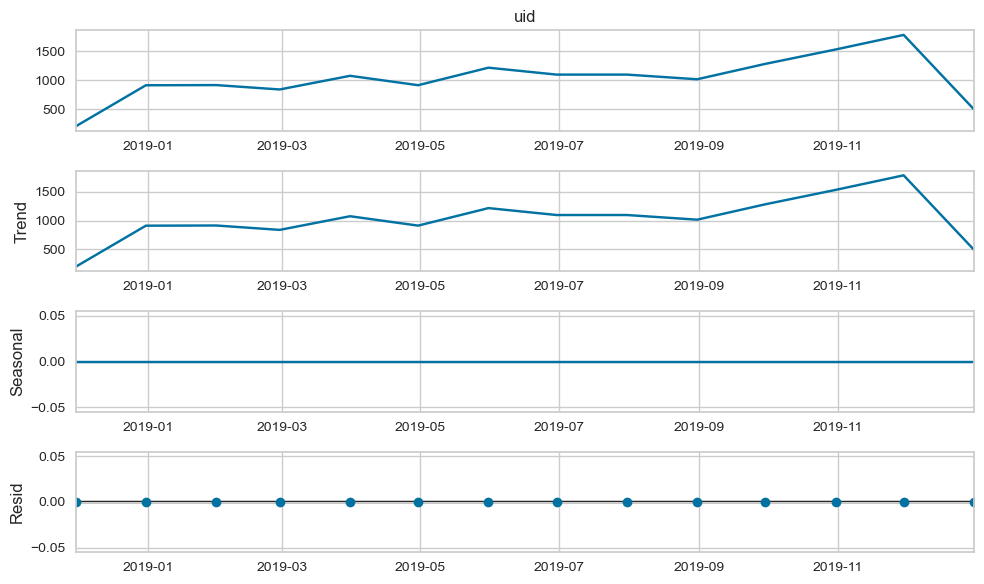

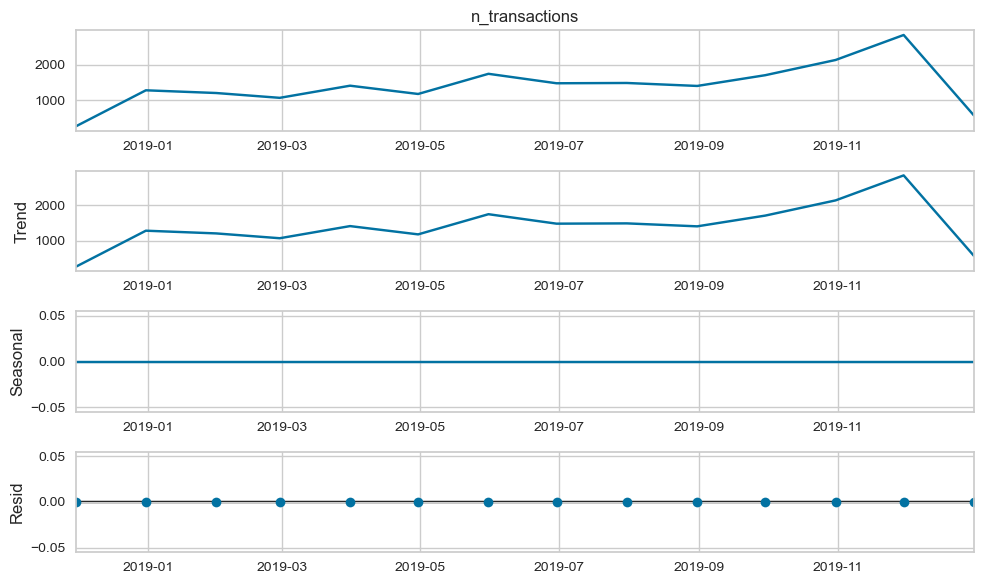

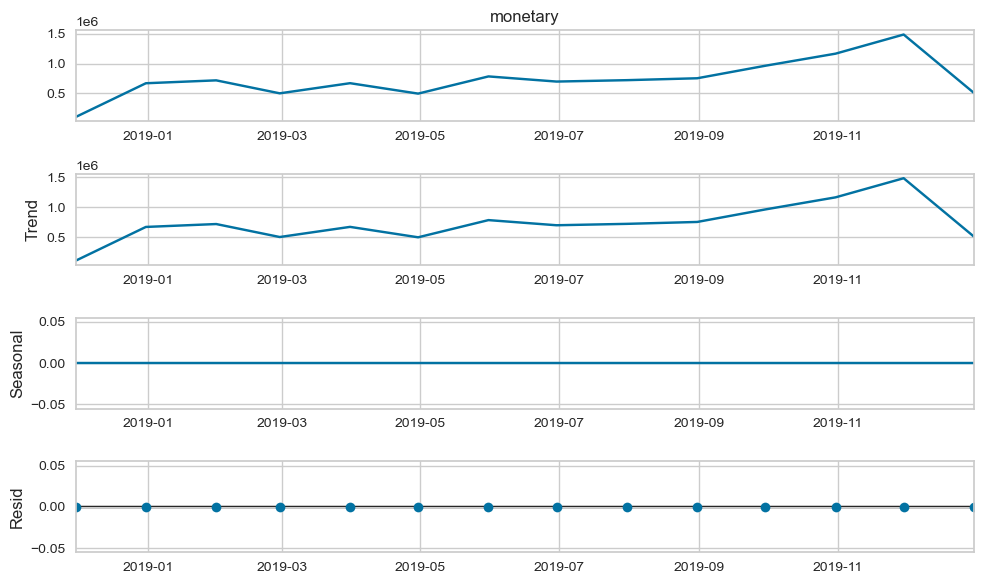

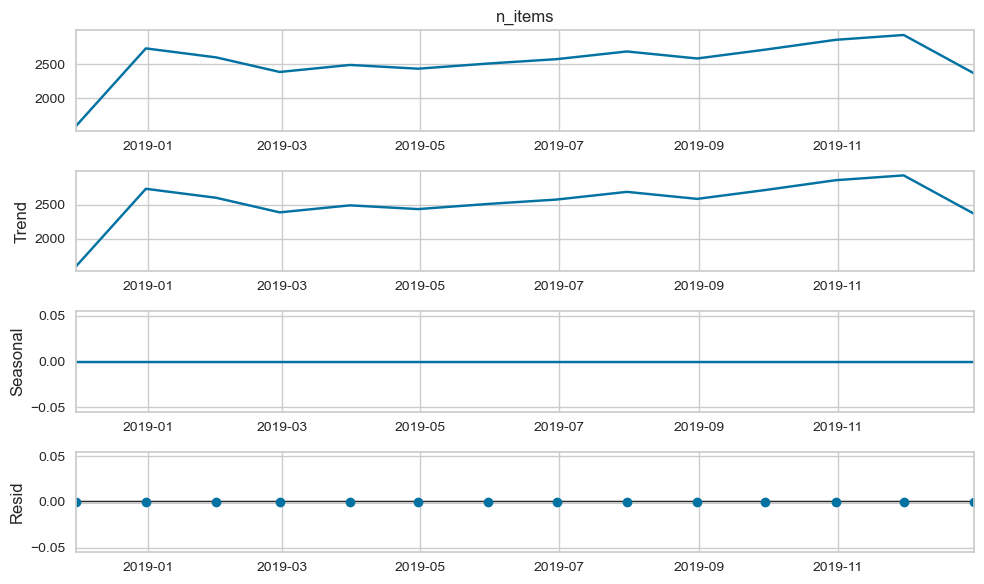

In [670]:
# additive decomposition of time series: monthly basis
for i in variable_check:
    add_decomposition(agg_month_full, i)

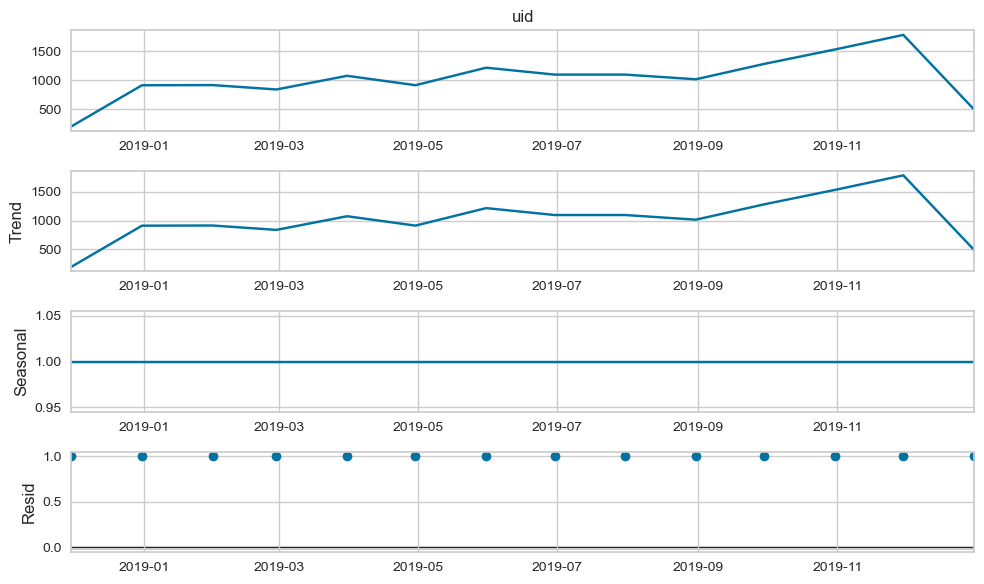

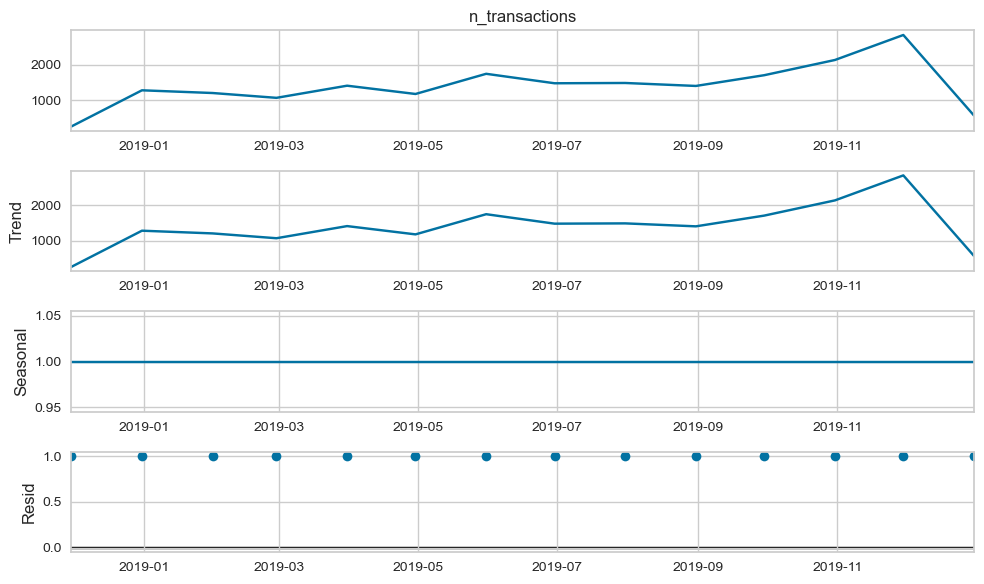

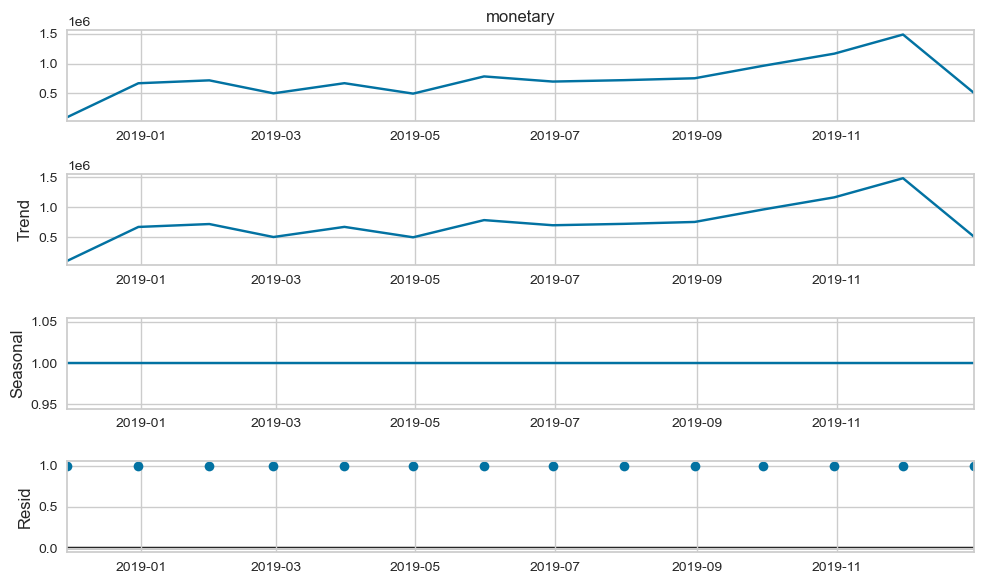

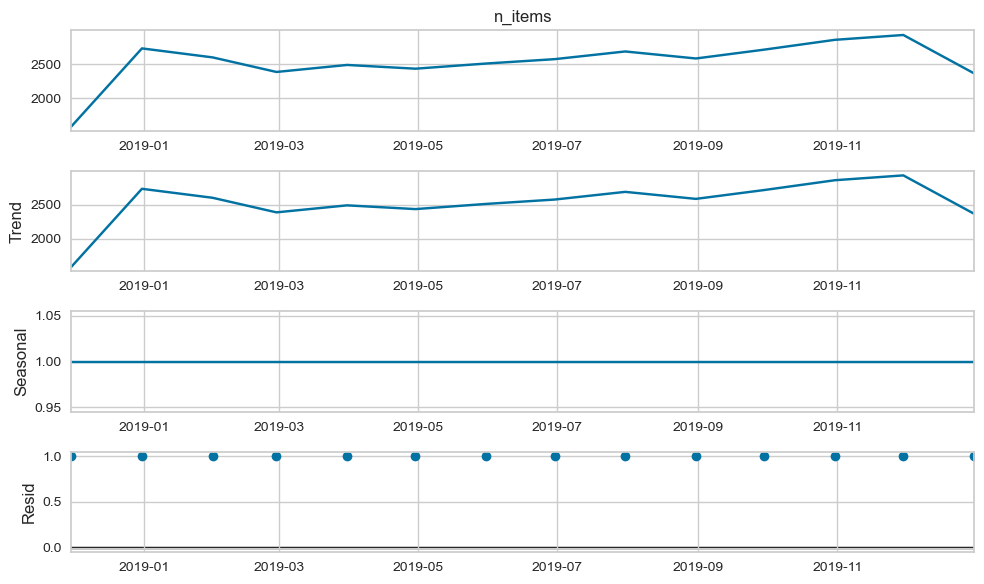

In [671]:
# multiplicative decomposition of time series: monthly basis
for i in variable_check:
    mul_decomposition(agg_month_full, i)

**Identifying Seasonality on a Daily Basis**

In [672]:
# stationarity check
for i in variable_check:
    print('STATIONARITY CHECK IN', i.upper())
    stationarity_check(agg_day_full, i)
    print('--------------------------------------------')
    print()

STATIONARITY CHECK IN UID
p-value : 0.09799036501971031
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_TRANSACTIONS
p-value : 0.07401204453573794
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN MONETARY
p-value : 0.8285850927955929
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------

STATIONARITY CHECK IN N_ITEMS
p-value : 0.2292097366177055
failed to reject H0 : Time series data is NON-STATIONARY 
The data may exhibit seasonality or other trends.
--------------------------------------------



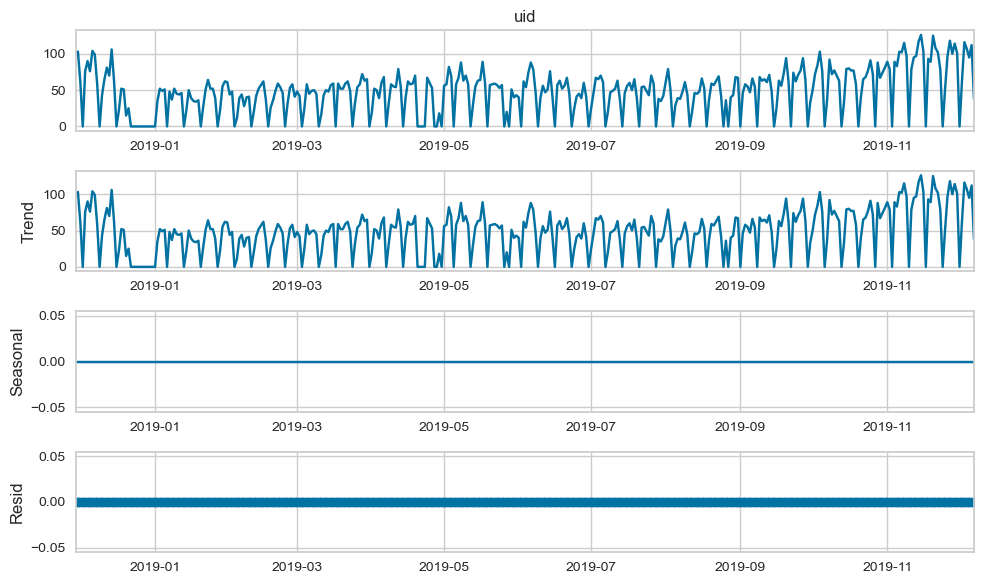

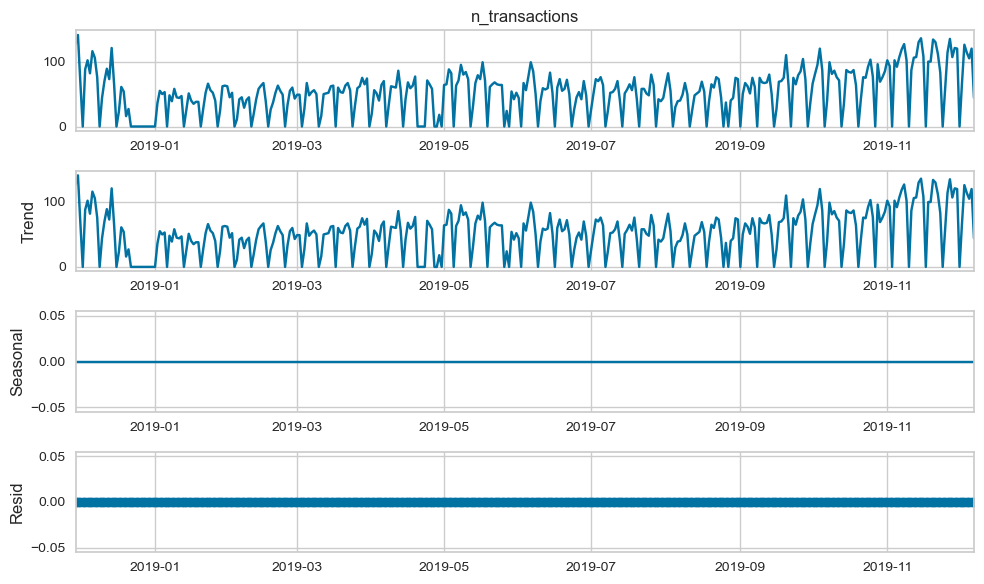

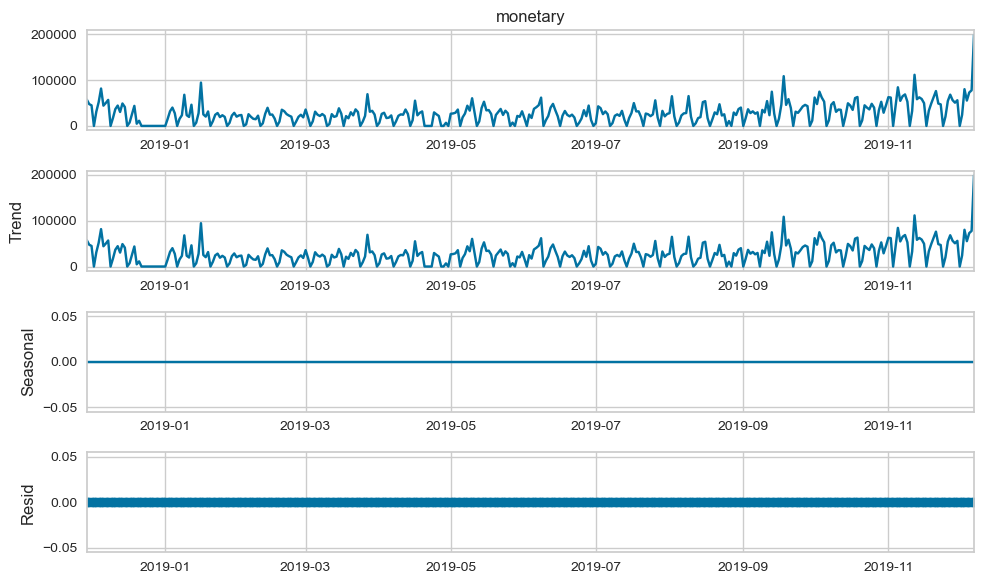

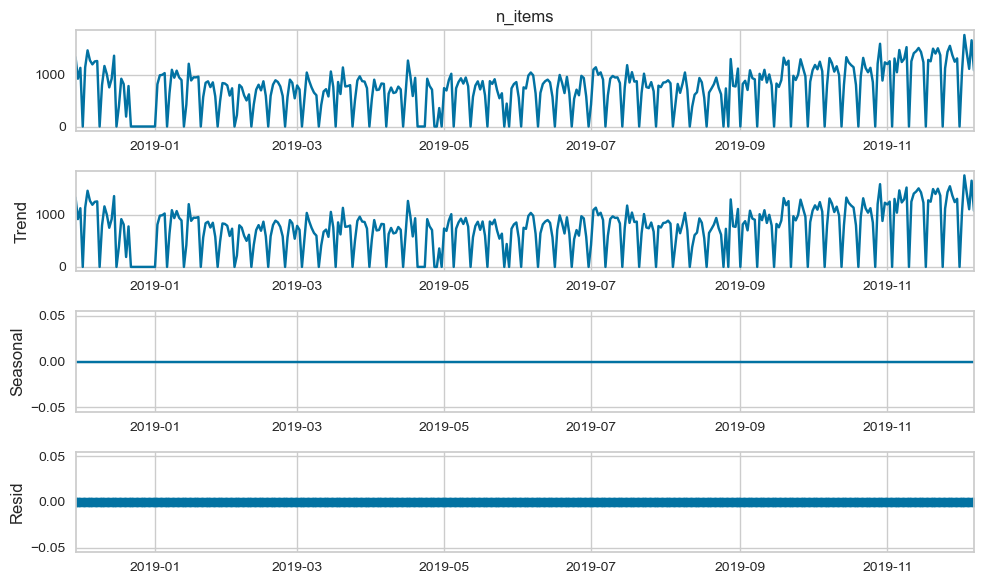

In [673]:
# additive decomposition of time series: daily basis
for i in variable_check:
    add_decomposition(agg_day_full, i)

In [674]:
# multiplicative decomposition of time series: daily basis
for i in variable_check:
    mul_decomposition(agg_day_full, i)

Can not perform multiplicative decomposition
Can not perform multiplicative decomposition
Can not perform multiplicative decomposition
Can not perform multiplicative decomposition


In [675]:
# check date where the all variables have zero values
agg_day_full.query('uid==0').resample('M')['uid'].count()

date
2018-12-31    13
2019-01-31     5
2019-02-28     4
2019-03-31     5
2019-04-30     9
2019-05-31     5
2019-06-30     5
2019-07-31     4
2019-08-31     5
2019-09-30     5
2019-10-31     4
2019-11-30     4
2019-12-31     1
Freq: M, Name: uid, dtype: int64

**FINDINGS:**<br>
- Seasonal analysis on `clean_df_full` generate the same results as the `clean_df`

**INSIGHT**<br>
- Both version datasets suggested have no seasonal effect

### Customers' Behaviour

I will analyze the accumulated customer behavior over the course of a year. The variable we want to check is the following:<br>
- recency
- transaction frequency
- revenue (monetary)
- average revenue per transaction / average order value (AOV)
- purchased items variants
- quantity
- average quantity
- price preference

#### Function List

In [676]:
# create function to sumarize behavior from each customer

def sum_behavior (dataframe):
    # calculate transaction frequency, total item, and total monetary from each `uid`
    purchase_sum = (dataframe
                     .groupby('uid', as_index=False)
                     .agg({'recency':'min',
                           'invoice_no':'nunique',
                           'monetary':'sum',
                           'stock_code':'nunique',                       
                           'quantity':'sum'})
                     .rename(columns={'invoice_no':'n_trans', 'stock_code':'n_items',
                                      'monetary':'total_monetary'})
                    )
    # calculate Average order value (AOV)
    purchase_sum['aov'] = purchase_sum['total_monetary'] / purchase_sum['n_trans']

    # calculate Average quantity
    purchase_sum['avg_quantity'] = purchase_sum['quantity'] / purchase_sum['n_items']
    
    return purchase_sum

#### `clean_df` version 

##### spending behaviors

In [677]:
# sum behavior from each customer
purchase_sum = sum_behavior(clean_df)
print('number of uid/rows:', len(purchase_sum))
purchase_sum.tail()

number of uid/rows: 4334


,uid,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity
4329,18280,277,1,180.60,10,45,180.600000,4.500000
4330,18281,180,1,80.82,7,54,80.820000,7.714286
4331,18282,7,2,178.05,12,103,89.025000,8.583333
4332,18283,3,16,2039.58,262,1355,127.473750,5.171756
4333,18287,42,3,1837.28,59,1586,612.426667,26.881356


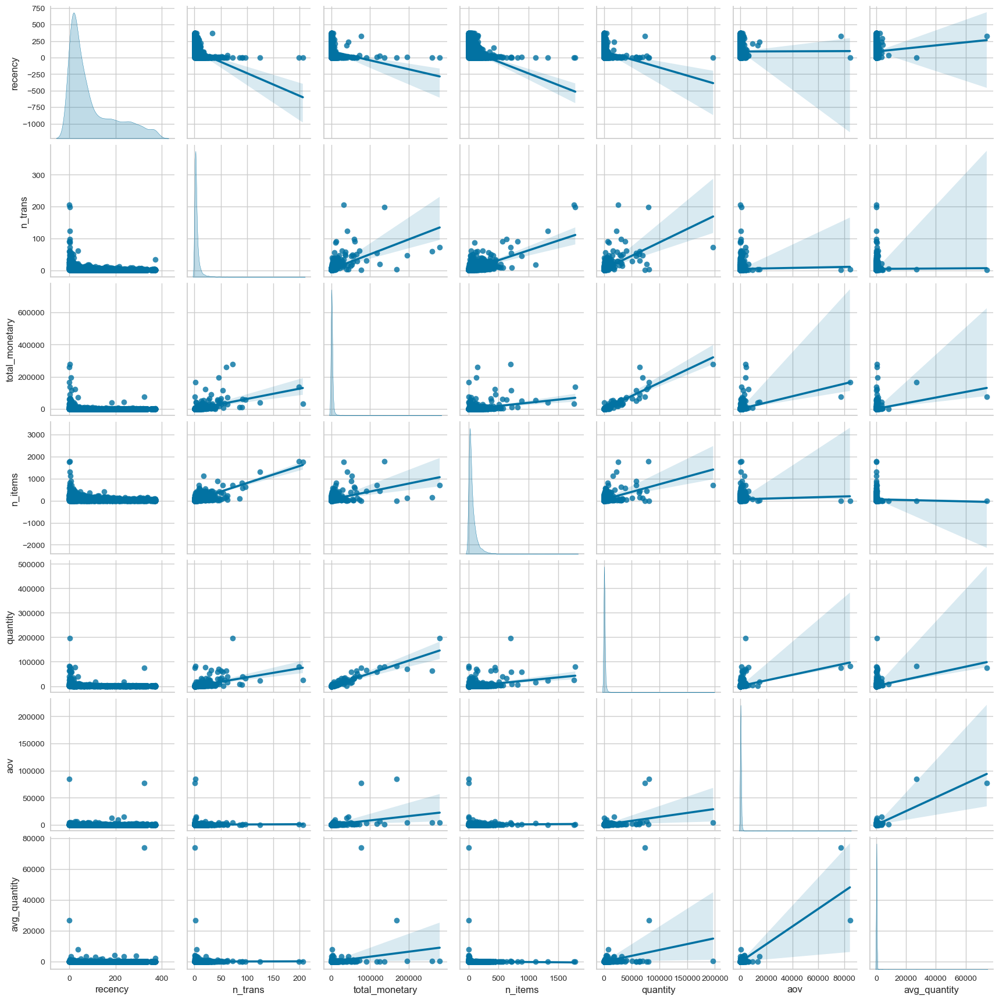

In [678]:
# check distribution and pairwise relationship between variables
sns.pairplot(purchase_sum, kind='reg', diag_kind='kde')
plt.show()

**NOTE:**<br>
- All the variables seems to have positive correlation with each other, unless for the `recency`, which has negative correlation with all variables. 

In [679]:
# define outlier threshold
q99_quantity = np.quantile(purchase_sum['quantity'], 0.99)
q99_total_monetary = np.quantile(purchase_sum['total_monetary'], 0.99)
q99_total_items = np.quantile(purchase_sum['n_items'], 0.99)

In [680]:
# check potential anomalies customers
potential_outliers = purchase_sum.query('(avg_quantity > @q99_quantity) | (total_monetary > @q99_total_monetary) | (n_items > @q99_total_items)')
print('Customers who suspected having extreme behaviors', len(potential_outliers))

# display outliers
potential_outliers

Customers who suspected having extreme behaviors 73


,uid,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity
0,12346,325,1,77183.60,1,74215,77183.600000,74215.000000
55,12415,24,20,124564.53,443,77373,6228.226500,174.656885
314,12731,23,12,18751.91,108,8429,1562.659167,78.046296
326,12748,0,206,31650.78,1766,25051,153.644563,14.185164
330,12753,22,6,21429.39,132,11421,3571.565000,86.522727
...,...,...,...,...,...,...,...,...
4017,17857,4,22,25301.54,18,14822,1150.070000,823.444444
4067,17920,4,17,4107.60,406,2471,241.623529,6.086207
4089,17949,1,44,58030.48,28,30450,1318.874545,1087.500000
4197,18102,0,60,259657.30,150,64124,4327.621667,427.493333


**FINDING:**<br>
- After checking the outliers, I considered those extreme behaviours still represent the random unique customer's behaviours

**ACTION:**<br>
- We will preserve `uid` with extreme behaviour for clustering. The outliers don't show extreme distance from others' normal behaviours through the scatterplot.

##### price preference

In this section, we will check customer price preference by calculating the number of items purchased within specific price ranges.

Initially, we will group the unit price into six categories, which are `low price`, `budget-friendly price`, `mid price`, `high price`, `premium price`, and `luxury price`.

In [681]:
# list unit price from all items purchased by each customers
product_sum = (clean_df
             .groupby(['uid', 'stock_code', 'unit_price'], as_index=False)
             .agg({'invoice_no':'count'})
             .rename(columns={'invoice_no':'n_transaction'})
              )

product_sum.tail()

,uid,stock_code,unit_price,n_transaction
274040,18287,85039A,1.45,2
274041,18287,85039B,1.45,2
274042,18287,85039B,1.65,1
274043,18287,85040A,1.65,2
274044,18287,85173,1.69,1


In [682]:
# check unit price distribution
product_sum['unit_price'].describe()

count    274045.000000
mean          2.899631
std           4.526119
min           0.040000
25%           1.250000
50%           1.790000
75%           3.750000
max         649.500000
Name: unit_price, dtype: float64

In [683]:
# check percentile
check_p(product_sum['unit_price'])[1]

The 90th percentile is: 6.35 
The 95th percentile is: 8.5 
The 99th percentile is: 12.75


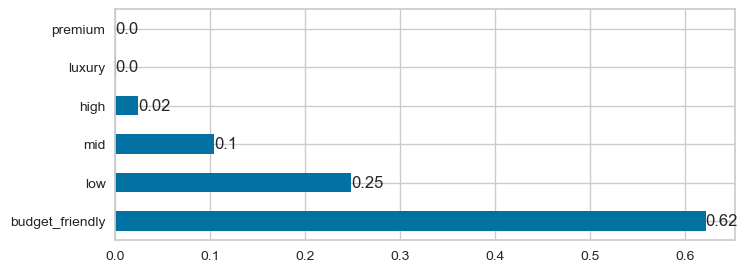

In [684]:
# define range unit price for each category (based on domain knowledge + percentile info)
bins = [0, 1.25, 5.00, 10.00, 50.00, 100, 650]
labels = ['low', 'budget_friendly', 'mid', 'high', 'premium', 'luxury']

# create category for unit price
product_sum['price_category'] = pd.cut(product_sum['unit_price'], bins=bins, labels=labels, right=False)

# plot the category
plt.figure(figsize=(8,3))
ax = product_sum['price_category'].value_counts(normalize=True).plot(kind='barh')
# Add value annotations to each bar
for i, v in enumerate(product_sum['price_category'].value_counts(normalize=True)):
    ax.text(v, i, str(round(v, 2)), va='center')
plt.show()

**INSIGHTS:**<br>
- Over 60% of the sold items fall under the category of `budget-friendly price` (€1.25-€5.00), followed by `low price` (€1.25-€5.00) and `mid price` (€1.25-€5.00).
- Less than 3% of the sold items belong to the categories of `high price` (€1.25-€5.00), `luxury price` (€1.25-€5.00), and `premium price` (€1.25-€5.00).
- It is evident that the majority of customers prefer items with affordable prices.

**ACTION**<br>
- We can create dummy features that calculate the number of purchased items in a particular category. These features can be used for customer segmentation in machine learning models
- In hypotheses testing, We can check whether customers who bought `high price`, `luxury price`, and `premium price` tend to have lower transaction frequency. Since they might become one-time buyers.

#### `clean_df_full` version 

##### spending behaviors

In [685]:
# sum behavior from each customer
purchase_sum_full = sum_behavior(clean_df_full)
print('number of uid/rows:', len(purchase_sum_full))
purchase_sum_full.tail()

number of uid/rows: 5705


,uid,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity
5700,581435,1,1,3.35,2,2,3.35,1.000000
5701,581439,1,1,5699.00,634,1747,5699.00,2.755521
5702,581492,0,1,6756.06,730,2010,6756.06,2.753425
5703,581497,0,1,3217.20,56,654,3217.20,11.678571
5704,581498,0,1,3950.72,217,731,3950.72,3.368664


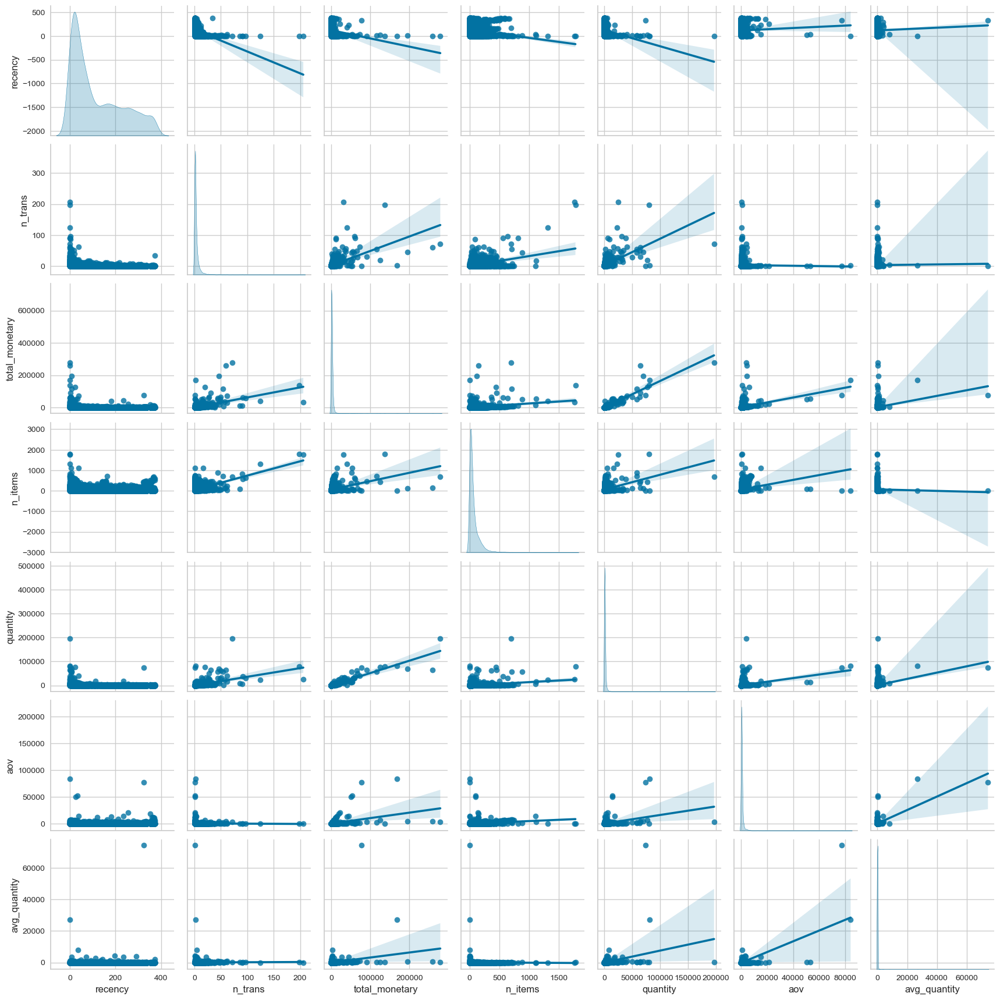

In [686]:
# check distribution and pairwise relationship between variables
sns.pairplot(purchase_sum_full, kind='reg', diag_kind='kde')
plt.show()

**NOTE:**<br>
- All the variables seems to have positive correlation with each other, unless for the `recency`, which has negative correlation with all variables. 

In [687]:
# define outlier threshold
q99_quantity_full = np.quantile(purchase_sum_full['quantity'], 0.99)
q99_total_monetary_full = np.quantile(purchase_sum_full['total_monetary'], 0.99)

In [688]:
# check potential anomalies customers
potential_outliers_full = purchase_sum_full.query('(avg_quantity > @q99_quantity_full) | (total_monetary > @q99_total_monetary_full)')
print('Customers who suspected having extreme behaviors', len(potential_outliers_full))

# display outliers
potential_outliers_full

Customers who suspected having extreme behaviors 58


,uid,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity
0,12346,325,1,77183.60,1,74215,77183.600000,74215.000000
55,12415,24,20,124564.53,443,77373,6228.226500,174.656885
100,12471,2,27,17388.65,148,8092,644.024074,54.675676
314,12731,23,12,18751.91,108,8429,1562.659167,78.046296
326,12748,0,206,31650.78,1766,25051,153.644563,14.185164
330,12753,22,6,21429.39,132,11421,3571.565000,86.522727
431,12901,8,28,17654.54,30,23075,630.519286,769.166667
445,12921,9,37,16587.09,233,9526,448.299730,40.884120
453,12931,21,15,42055.96,28,28004,2803.730667,1000.142857
558,13081,11,11,28337.38,503,19068,2576.125455,37.908549


##### price preference

In [689]:
# list unit price for each customers
product_sum_full = (clean_df_full
                 .groupby(['uid', 'stock_code', 'unit_price'], as_index=False)
                 .agg({'invoice_no':'count'})
                 .rename(columns={'invoice_no':'n_transaction'})
                  )

product_sum_full.tail()

,uid,stock_code,unit_price,n_transaction
405383,581498,85049e,3.29,1
405384,581498,85099B,4.13,1
405385,581498,85099C,4.13,1
405386,581498,85150,4.96,1
405387,581498,85174,10.79,1


In [690]:
# check unit price distribution
product_sum_full['unit_price'].describe()

count    405388.000000
mean          3.406703
std           4.575385
min           0.040000
25%           1.250000
50%           2.100000
75%           4.130000
max         649.500000
Name: unit_price, dtype: float64

In [691]:
# check percentile
check_p(product_sum_full['unit_price'])[1]

The 90th percentile is: 7.95 
The 95th percentile is: 9.95 
The 99th percentile is: 16.95


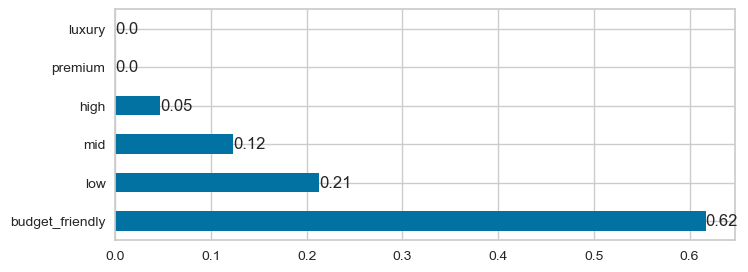

In [692]:
# create category for unit price
product_sum_full['price_category'] = pd.cut(product_sum_full['unit_price'], bins=bins, labels=labels, right=False)

# plot the category
plt.figure(figsize=(8,3))
ax = product_sum_full['price_category'].value_counts(normalize=True).plot(kind='barh')
# Add value annotations to each bar
for i, v in enumerate(product_sum_full['price_category'].value_counts(normalize=True)):
    ax.text(v, i, str(round(v, 2)), va='center')
plt.show()

**INSIGHTS:**<br>
- Analyzing customer behaviour on `clean_df_full` gives an almost similar result to the analysis conducted on `clean_df`
- The only difference is the proportion of high, medium, and low price preferences. The `clean_df_full` customers show more customers purchased high and medium-price items and fewer customers purchased low-price items. It seems that the 7% of transactions with missing `uid` tend to buy more in high and medium price items

**ACTION**<br>
- We will perform the same action as `clean_df`

#### Compare the different correlations between `clean_df` and `clean_df_full`

In [693]:
# check correlation between pairwise variables
abs(purchase_sum.corr()) - abs(purchase_sum_full.corr())

,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity
recency,0.000000,-0.019137,-0.000673,0.146644,-0.010663,-0.021981,0.014677
n_trans,-0.019137,0.000000,0.009063,0.225519,-0.002032,0.002797,-0.004239
total_monetary,-0.000673,0.009063,0.000000,0.062066,0.002873,0.002330,0.002056
n_items,0.146644,0.225519,0.062066,0.000000,0.095660,-0.200650,0.002751
quantity,-0.010663,-0.002032,0.002873,0.095660,0.000000,0.061012,0.000205
aov,-0.021981,0.002797,0.002330,-0.200650,0.061012,0.000000,0.197904
avg_quantity,0.014677,-0.004239,0.002056,0.002751,0.000205,0.197904,0.000000


In [694]:
# check correlation between particular variables that suggest quite huge different values
purchase_sum[['n_items', 'recency', 'n_trans']].corr()

,n_items,recency,n_trans
n_items,1.000000,-0.300279,0.691319
recency,-0.300279,1.000000,-0.261434
n_trans,0.691319,-0.261434,1.000000


In [695]:
# check correlation between particular variables that suggest quite huge different values
purchase_sum_full[['n_items', 'recency', 'n_trans']].corr()

,n_items,recency,n_trans
n_items,1.000000,-0.153636,0.465799
recency,-0.153636,1.000000,-0.280571
n_trans,0.465799,-0.280571,1.000000


**FINDINGS:**<br>
- The difference in correlation values between `purchase_sum` (from `clean_df`) and `purchase_sum_all` (from `clean_df_full`) is relatively small, except for the columns `n_items` and `recency`, `n_items` and `n_trans`, and `davg_quantity` and `aov`. However, we don't know whether these differences are significant enough
- It seems that the 7% of transactions with missing `uid` contributed to lowering the correlation of those variables since it captured more variant customer behaviour

## HYPOTHESES

Exploration analysis tells us trend and relationship between variables we have. Based on that pattern, we will formulate hypotheses which can be tested statistically.

**Customers' Behaviours: Null Hypotheses**<br>
These hypotheses will examine whether there is a significant correlation between specific customers' behaviors in the first month and future months. Unveiling customers' behaviours in the first month can be beneficial to estimate their future behaviours.  Based on our previous EDA, we observed a linear relationship between each pairwise combination of the following variables: transaction frequency, recency, total monetary, quantity, AOV, and average quantity. Based on that findings, we formulated hypotheses are as follows:

- H1. There is no significant correlation between the transaction frequency in the first month and future months.
- H2. There is no significant correlation between the transaction frequency in the first month and total monetary in future months.
- H3. There is no significant correlation between the quantity in the first month and total monetary in future months.
- H4. There is no significant correlation between the average quantity in the first month and total monetary in future months.
- H5. There is no significant correlation between the average order value (AOV) in the first month and total monetary in future months.
- H6. There is no significant correlation between the total monetary in the first month and total monetary in future months.
- H7. There is no significant correlation between the total item variants in the first month and total monetary in future months.
- H8. There is no significant correlation between recency and total monetary.
- H9. There is no significant correlation between recency and total item variants.
- H10. There is no significant correlation between recency and purchased quantity.
- H11. There is no significant correlation between recency and transaction frequency.

For hypotheses related to customers' behaviors, we will test the relationship between two behaviors from the same customers in the first and future months. Given that the variables exhibit a positively skewed distribution, we will use the `Spearman correlation test` to evaluate the significance of the relationships.

<br>
<br>

**Price Preferences: Null Hypotheses**<br>
Based on our previous findings, less than 3% of the products sold were categorized as "high," "premium," or "luxury" price. Based on that finding, we formulated hypothesis is as follows:

- H12. There is no significant difference in transaction frequency between customers who bought "high," "premium," and "luxury" price items and customers who did not.

To test H12, we will perform a different test between two groups: customers who bought high/premium/luxury-priced products and customers who did not. We will compare their transaction frequency to determine whether those who bought high/premium/luxury-priced items tend to make purchases less frequently. Here, we will use `Mann-Whitney U test`.

### Function Lists

#### Data Transformation

**Generate aggregated customer behaviours based on first and future months**

In [696]:
# create function to sum customers' behaviours based on first and future months

def transform_to_first_future_report (dataframe):

    # calculate lifetime in month for each customers
    dataframe['lifetime'] = np.ceil((dataframe['date'] - dataframe['first_buy']) / np.timedelta64(1, 'M'))

    # filter and aggregate values from variables for the first month
    report_first_month = (dataframe
                             .query('lifetime <= 1')
                             .groupby('uid', as_index=False)
                             .agg({'invoice_no':'nunique',
                                   'stock_code':'nunique',
                                   'quantity':'sum',
                                   'monetary':'sum'
                                  })
                             .rename(columns={'invoice_no':'n_trans_first',
                                              'stock_code':'n_items_first',
                                              'quantity':'quantity_first',
                                              'monetary':'total_monetary_first'
                                             })
                            )
    # calculate AOV and average quantity per item
    report_first_month['aov_first'] = report_first_month['total_monetary_first'] / report_first_month['n_trans_first']
    report_first_month['avg_quantity_first'] = report_first_month['quantity_first'] / report_first_month['n_items_first']


    # filter and aggregate values from variables for the first month
    report_future_month = (dataframe
                             .query('lifetime > 1')
                             .groupby('uid', as_index=False)
                             .agg({'invoice_no':'nunique',
                                   'monetary':'sum'
                                  })
                             .rename(columns={'invoice_no':'n_trans_future',
                                              'monetary':'total_monetary_future'
                                             })
                            )

    # merge report in the first and future month
    report = report_first_month.merge(report_future_month, on='uid', how='left')

    # replace missing values in the future variables with zero (0)
    report.fillna(0, inplace=True)
    
    return report, report_first_month, report_future_month

**Note**<br>
The number of unique customers decreased in the future month. It implies that some customers didn't make repeated purchases after the first month (the transaction frequency and total money in the future months are equal to zero)

**separate and count customers who purchased expensive and mediocre items**

In [697]:
def separate_price_group (dataframe):
    
    # define high price groups
    high_price_group = ['high', 'premium', 'luxury']
    
    # seperate high price groups data
    expensive_cust = (dataframe
                      .query('price_category in @high_price_group')
                      .groupby('uid', as_index=False)['n_transaction'].sum()
                     )
    
    # seperate mediocre price groups data
    mediocre_cust = (dataframe
                     .query('price_category not in @high_price_group')
                     .groupby('uid', as_index=False)['n_transaction'].sum()
                    )
    
    return expensive_cust, mediocre_cust

**NOTE:**<br>
- One customer may be in both groups (`expensive_cust` and `mediocre_cust`). This separation just wants to count the number of customers who purchased `expensive-priced items` and `medium-priced items`

 #### Statistical Test

**Correlation Test** 

In [698]:
# CREATE FUNCTION FOR SPEARMAN CORRELATION TEST
## Used when data is not a normal distribution

def spearman_corr(var1, var2, alpha=0.05):
    '''
    Perform Spearman correlation analysis between two variables.

    Parameters:
    - var1 (array-like): The first variable data.
    - var2 (array-like): The second variable data.
    - alpha (float, optional): The significance level for hypothesis testing. Default is 0.05.

    Returns:
    - The function prints the results of the analysis.

    Notes:
    - The variables var1 and var2 should have equal lengths.
    - Spearman correlation analysis is suitable for data that does not follow a normal distribution.

    Example:
    >>> var1 = [1, 2, 3, 4, 5]
    >>> var2 = [5, 4, 3, 2, 1]
    >>> spearman_corr(var1, var2)
    '''

    # Calculate the correlation coefficient and p-value
    spearman_corr, p_value = stats.spearmanr(var1, var2)

    # Print the results
    print('p-value:', p_value)
    print('Spearman correlation coefficient:', spearman_corr)
    print()

    # Verdict
    if p_value < alpha:
        print('Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.')
    else:
        print('Accept H0: There is no evidence to suggest a significant monotonic relationship between the variables.')


**Different Test** 

In [699]:
## different test for non parametric
## non-normal distribution

def mannwhitneyu_test (data1, data2, alpha=0.05):  
    
    '''
    Perform the Mann-Whitney U test to compare two independent groups.
    The series can be of different lengths and should have at least five observations in each group.

    Parameters:
    - data1, data2: The two independent groups for comparison (arrays, lists, or pandas Series).
    - alpha: The significance level (default is 0.05).

    Returns:
    - p_value: The p-value of the test.
    - interpretation: The interpretation statement based on the test result.
    - relative mean difference of data1 to data2
    '''

    mannwhitneyu = stats.mannwhitneyu(data1, data2)[1]
    
    alpha = alpha

    if mannwhitneyu < alpha :
        print('p-value:', mannwhitneyu)
        print('Reject H0: There is a significant difference between the two groups')
        print()
        print(f'relative difference: {data1.mean()/data2.mean()-1:.3f}')
    else:
        print('p-value:', mannwhitneyu)
        print('Accept H0: There is no significant difference between the two groups')
        print()
        print(f'relative difference: {data1.mean()/data2.mean()-1:.3f}')

### Customers' Behaviours : First Month vs Future

#### Test H1-H7 

The formulated hypotheses:
- H1. There is no significant correlation between the transaction frequency in the first month and future months.
- H2. There is no significant correlation between the transaction frequency in the first month and total monetary in future months.
- H3. There is no significant correlation between the quantity in the first month and total monetary in future months.
- H4. There is no significant correlation between the average quantity per item in the first month and total monetary in future months.
- H5. There is no significant correlation between the average order value (AOV) in the first month and total monetary in future months.
- H6. There is no significant correlation between the total monetary in the first month and total monetary in future months.
- H7. There is no significant correlation between the total item variants in the first month and total monetary in future months.

##### `clean_df` version 

In [700]:
# transform dataset for hypotheses testing
report = transform_to_first_future_report(clean_df)[0]

# display the result
report.head()

,uid,n_trans_first,n_items_first,quantity_first,total_monetary_first,aov_first,avg_quantity_first,n_trans_future,total_monetary_future
0,12346,1,1,74215,77183.60,77183.60,74215.000000,0.0,0.00
1,12347,1,31,319,711.79,711.79,10.290323,6.0,3598.21
2,12348,1,12,1248,652.80,652.80,104.000000,3.0,784.44
3,12349,1,72,630,1457.55,1457.55,8.750000,0.0,0.00
4,12350,1,16,196,294.40,294.40,12.250000,0.0,0.00


**Perform Spearman Test to Test H1-H7** 

In [701]:
# list variable test
variables_tests = ['n_trans_first', 'quantity_first', 'avg_quantity_first', 'aov_first', 'total_monetary_first', 'n_items_first']

In [702]:
# peform the spearman correlation test to H1-H7
print('H1 test result')
print('n_trans_first AND n_trans_future\n')
spearman_corr(report['n_trans_first'], report['n_trans_future'])
print()
print('----------------------------------------------------------------------------------')

for num, i in enumerate(variables_tests, start=2):
    print(f'H{num} test result \n{i} AND total_monetary_future\n')
    spearman_corr(report[i], report['total_monetary_future'])
    print()
    print('----------------------------------------------------------------------------------')

H1 test result
n_trans_first AND n_trans_future

p-value: 3.1823157378078583e-80
Spearman correlation coefficient: 0.2823120172876437

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H2 test result 
n_trans_first AND total_monetary_future

p-value: 2.1054873594867307e-69
Spearman correlation coefficient: 0.2628370791592243

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H3 test result 
quantity_first AND total_monetary_future

p-value: 2.1114679558943463e-66
Spearman correlation coefficient: 0.25713402271003055

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H4 t

##### `clean_df_full` version 

In [703]:
# transform dataset for hypotheses testing
report_full = transform_to_first_future_report(clean_df_full)[0]

# display the result
report_full.head()

,uid,n_trans_first,n_items_first,quantity_first,total_monetary_first,aov_first,avg_quantity_first,n_trans_future,total_monetary_future
0,12346,1,1,74215,77183.60,77183.60,74215.000000,0.0,0.00
1,12347,1,31,319,711.79,711.79,10.290323,6.0,3598.21
2,12348,1,12,1248,652.80,652.80,104.000000,3.0,784.44
3,12349,1,72,630,1457.55,1457.55,8.750000,0.0,0.00
4,12350,1,16,196,294.40,294.40,12.250000,0.0,0.00


**Perform Spearman Test to Test H1-H7** 

In [704]:
# peform the spearman correlation test to H1-H7
print('H1 test result')
print('n_trans_first AND n_trans_future\n')
spearman_corr(report_full['n_trans_first'], report_full['n_trans_future'])
print()
print('----------------------------------------------------------------------------------')

for num, i in enumerate(variables_tests, start=2):
    print(f'H{num} test result \n{i} AND total_monetary_future\n')
    spearman_corr(report_full[i], report_full['total_monetary_future'])
    print()
    print('----------------------------------------------------------------------------------')

H1 test result
n_trans_first AND n_trans_future

p-value: 7.501134471038538e-157
Spearman correlation coefficient: 0.34259441679165464

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H2 test result 
n_trans_first AND total_monetary_future

p-value: 1.648857197243344e-144
Spearman correlation coefficient: 0.3294581578225763

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H3 test result 
quantity_first AND total_monetary_future

p-value: 1.1030710945012536e-75
Spearman correlation coefficient: 0.24020811974849476

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H4 

 **RESULTS:**<br>
 - Both datasets (`clean_df` and `clean_df_full`) suggests to reject all hypotheses null H1-H7. It implies that the customers' behaviours' in the first month correlate significantly with the customers' behaviours in the future months.
 - Customers' behaviours in the first month can be used to predict the customers' behaviours in the future months. However, It doesn't guarantee its accurateness and effectiveness

#### Test H8-H11

The formulated hypotheses:
- H8. There is no significant correlation between recency and total monetary.
- H9. There is no significant correlation between recency and total item variants.
- H10. There is no significant correlation between recency and purchased quantity.
- H11. There is no significant correlation between recency and transaction frequency.

 ##### `clean_df` version

In [705]:
# list variable test
variables_tests_ = ['total_monetary', 'n_items', 'quantity', 'n_trans']

**Perform Spearman Correlation Test to Test H8-H11**

In [706]:
for num, i in enumerate(variables_tests_, start=8):
    print(f'H{num} test result \nrecency AND {i}')
    spearman_corr(purchase_sum['recency'], purchase_sum[i])
    print()
    print('----------------------------------------------------------------------------------')

H8 test result 
recency AND total_monetary
p-value: 5.509700253012817e-251
Spearman correlation coefficient: -0.4819615370639026

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H9 test result 
recency AND n_items
p-value: 3.8158355963851824e-222
Spearman correlation coefficient: -0.4565137226072913

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H10 test result 
recency AND quantity
p-value: 1.3008661370852123e-255
Spearman correlation coefficient: -0.48585074161008107

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H11 test result 
recency AND n_trans
p-value: 

 ##### `clean_df_full` version

**Perform Spearman Correlation Test to Test H8-H11**

In [707]:
for num, i in enumerate(variables_tests_, start=8):
    print(f'H{num} test result \nrecency AND {i}')
    spearman_corr(purchase_sum_full['recency'], purchase_sum_full[i])
    print()
    print('----------------------------------------------------------------------------------')

H8 test result 
recency AND total_monetary
p-value: 4.46354817324514e-248
Spearman correlation coefficient: -0.42425346952783916

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H9 test result 
recency AND n_items
p-value: 6.452143138949395e-141
Spearman correlation coefficient: -0.3255097690199074

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H10 test result 
recency AND quantity
p-value: 0.0
Spearman correlation coefficient: -0.49494928841268926

Reject H0: There is strong evidence to suggest a significant monotonic relationship between the variables.

----------------------------------------------------------------------------------
H11 test result 
recency AND n_trans
p-value: 0.0
Spearman correlat

 **RESULTS:**<br>
 - Both datasets (`clean_df` and `clean_df_full`) suggests to reject all hypotheses null H8-H11. It implies that the `recency` correlates significantly with  `total_monetary`, `n_items`, `quantity`, and `n_trans`
- We can study more about the pattern of `total_monetary`, `n_items`, `quantity`, and `n_trans`, so we can increase customer engagement to prevent the churn

#### Test H12


H12. There is no significant difference in transaction frequency between customers who bought "high," "premium," and "luxury" price items and customers who did not.


##### `clean_df` version

In [708]:
# count the number of purchased expensive items from each customer
expensive_cust = separate_price_group(product_sum)[0]
expensive_cust.head(3)

,uid,n_transaction
0,12347,4
1,12349,5
2,12352,2


In [709]:
# count the number of purchased medium-priced items from each customer
mediocre_cust = separate_price_group(product_sum)[1]
mediocre_cust.head(3)

,uid,n_transaction
0,12346,1
1,12347,178
2,12348,27


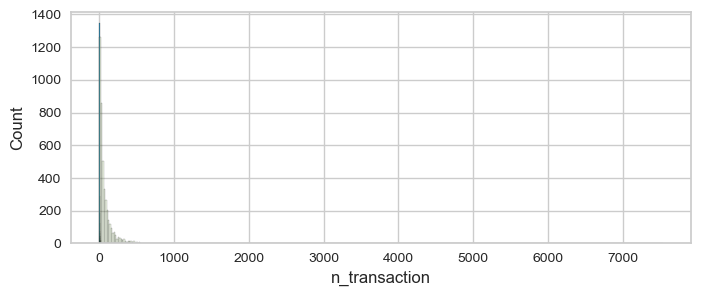

In [710]:
# check the distribution
plt.figure(figsize=(8,3))
sns.histplot(expensive_cust['n_transaction'], bins=400)
sns.histplot(mediocre_cust['n_transaction'], bins=400, alpha=0.2)
plt.show()

In [711]:
# perform Mann_Whitney U test for H-12
mannwhitneyu_test(expensive_cust['n_transaction'], mediocre_cust['n_transaction'])

p-value: 0.0
Reject H0: There is a significant difference between the two groups

relative difference: -0.954


##### `clean_df_full` version

In [712]:
# count the number of purchased expensive items from each customer
expensive_cust_full = separate_price_group(product_sum_full)[0]
expensive_cust_full.head(3)

,uid,n_transaction
0,12347,4
1,12349,5
2,12352,2


In [713]:
# count the number of purchased medium-priced items from each customer
mediocre_cust_full = separate_price_group(product_sum_full)[1]
mediocre_cust_full.head(3)

,uid,n_transaction
0,12346,1
1,12347,178
2,12348,27


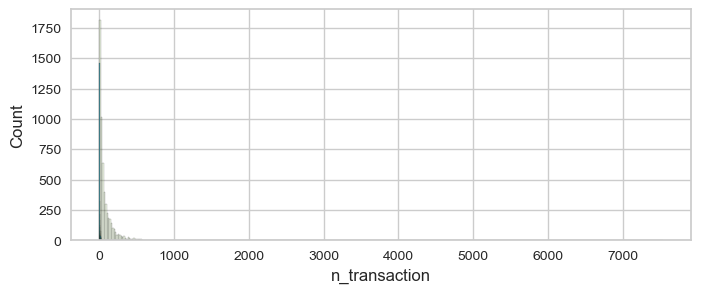

In [714]:
# check the assumption
plt.figure(figsize=(8,3))
sns.histplot(expensive_cust_full['n_transaction'], bins=400)
sns.histplot(mediocre_cust_full['n_transaction'], bins=400, alpha=0.2)
plt.show()

In [715]:
# peform Mann-Whitney U test for test H-12
mannwhitneyu_test(expensive_cust_full['n_transaction'], mediocre_cust_full['n_transaction'])

p-value: 0.0
Reject H0: There is a significant difference between the two groups

relative difference: -0.923


 **RESULTS:**<br>
 - Both datasets (`clean_df` and `clean_df_full`) suggests to reject the null H12. It implies that there is a different number of items purchased from expensive and mediocre-priced items
- The relative difference between both groups is almost similar. It suggested that mediocre-price items were purchased more often (> 90%) than expensive-priced product
- The relative difference in `clean_df_full` is lower than the `clean_df_full`. It implies that customers in `clean_df_full` tend to purchase expensive-priced items more than the customers in `clean_df`

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Well done! Great that you performed the statistical test to do the hypotheses testing.
It would be much better to have the summary results of all the hypotheses at one place

## FEATURES ENGINEERING

### Function Lists

#### Data Modification

**Modifying features for KMeans machine learning**

In [716]:
# Create function to count number of expensive, moderate, and low puchased items

def count_purchased_items_price_based (product_df, purchase_df):
    
    # define features
    features_data = purchase_df

    ## create dummies for price_category columns
    price_cat_dummies = pd.get_dummies(product_df['price_category'])

    ## Concatenate the dummy variables with the original DataFrame
    product_report = (pd
                   .concat([product_df, price_cat_dummies.add_suffix('_price')], axis=1)
                   .drop(columns='price_category')
                  )

    ## establish price preference
    price_preference = (product_report
                        .groupby('uid', as_index=False)
                        .agg({'low_price':'sum', 'budget_friendly_price':'sum', 'mid_price':'sum',
                              'high_price':'sum', 'premium_price':'sum', 'luxury_price':'sum'                          
                             })
                       )

    # Features modification
    ## merge budget_friendly_price and mid_price into one category
    price_preference['moderate_price'] = price_preference[['budget_friendly_price', 'mid_price']].sum(axis=1)


    ## merge high, premium, and luxury price into one category
    price_preference['expensive_price'] = price_preference[['high_price', 'premium_price', 'luxury_price']].sum(axis=1)

    ## drop columns
    price_preference = price_preference.drop(columns=['high_price', 'premium_price', 'luxury_price', 'budget_friendly_price', 'mid_price'])
    
    ## merge features and price preference
    features_data = features_data.merge(price_preference, on='uid', how='left')

    # remove not elevant columns
    features = features_data.drop(columns='uid')
    
    return features, features_data

 **Generate RFM table from dataset**

In [717]:
# create function to establish rfm data

def group_rfm_data (rfm_dataset,
                    q_recency=[0, 0.25, 0.50, 0.75, 0.90, 1],
                    q_frequency=[0, 0.50, 0.75, 0.95, 0.99, 1],
                    q_monetary=[0, 0.25, 0.50, 0.75, 0.95, 1]):

    # ASSIGN SCORE TO RFM FEATURES
    # divide recency based on range percentiles for each RFM feature
    rfm_dataset['q_recency'] = pd.qcut(rfm_dataset['recency'], q=q_recency, labels=False)
    rfm_dataset['q_frequency'] = pd.qcut(rfm_dataset['frequency'], q=q_frequency, labels=False)
    rfm_dataset['q_monetary'] = pd.qcut(rfm_dataset['monetary'], q=q_monetary, labels=False)

    # Calculate RFM scores
    rfm_dataset['r_score'] = 5 - rfm_dataset['q_recency']
    rfm_dataset['f_score'] = 1 + rfm_dataset['q_frequency']
    rfm_dataset['m_score'] = 1 + rfm_dataset['q_monetary']

    # retrieve the results
    return rfm_dataset

#### RFM Scoring

Here, I made the RFM segmentation based on studies from several references. By modifying the segment and consideration to fit with the client's needs, I formulate these segments below: 

| Segment | Description |
|---------|-------------|
| Champions |  Your Best Customers. Highly engaged customers who have bought the most recent, the most often, and generated the most revenue. |
| Loyalists |  Customers who buy frequently and have a good overall engagement. |
| Lost Loyalists | Once Loyal, Now At Risk. Past loyalists who haven't bought in a while but were previously engaged. |
| Big Spenders | Your Highest Paying Customers. Customers who have generated the most revenue for your store. | 
| Lost Big Spenders | Once spent in large amounts who haven't bought in a while | 
| Potential Customers | Potential High-Value Customers. Customers who show potential for increased spending and engagement. | 
| Potential Loyalist | Potential Loyal Customers. Customers with good overall engagement and potential for increased spending | 
| Lost Customers | Once show potential for increased spending and engagement but have gone in the middle journey. | 
| Rookies | Your Newest Customers. First-time buyers on your site. |
| Occasional buyers | Customers who have made only one or two purchases and have low engagement |

[Source](https://www.barilliance.com/rfm-analysis/#tab-con-3)


In [718]:
# create function to label the segment based on segment description above
def label_rfm_segments(row):
    r = row['r_score']
    f = row['f_score']
    m = row['m_score']
    
    if r == 5 and f == 5 and m == 5:
        return 'champions'
    elif (r != 5) and (f == 1) and (m != 1):
        return 'ocassional buyers'
    elif (r != 5 and r != 1) and (f == 1) and (m == 1):
        return 'ocassional buyers'
    elif (r == 1) and (f == 1):
        return 'lost ocassional buyers'
    elif (r == 4 or r == 5 ) and (f == 4 or f == 5) and (m != 1 and m != 2):
        return 'loyalists'
    elif (r != 4 and r != 5) and (f == 4 or f == 5) and (m != 1 and m != 2):
        return 'lost valueable customers'
    elif (r != 1 and r != 2) and (f == 2 or f == 3) and (m == 4 or m == 5):
        return 'big spenders'
    elif (r == 1 or r == 2) and (f == 2 or f == 3) and (m == 4 or m == 5):
        return 'lost valueable customers'
    elif (r == 5) and (f == 1):
        return 'rookies'
    elif (r == 4 or r == 5) and (f != 1 and f != 2) and (m != 4 and m != 5):
        return 'potential loyalists'
    elif (r != 1 and r != 2) and (f != 1) and (m != 4 and m != 5):
        return 'potential customers'
    elif (r == 1 or r == 2) and (f != 1) and (m != 4 and m != 5):
        return 'lost potential customers'
    else:
        return 'other'

 #### Features Assessment

 **PCA for assest and filter the features**

In [719]:
# Create function to generate PCA object with the desired number of components

def pca_filter_features (features):
    n_components = 2  # Specify the number of principal components you want to retain
    pca = PCA(n_components=n_components)

    # Fit and transform the data to the lower-dimensional space
    X_pca = pca.fit_transform(features)

    # Access the explained variance ratio
    explained_variance_ratio = pca.explained_variance_ratio_
    
    # Access the principal components (eigenvectors)
    components = pca.components_
    
    # Access the singular values
    singular_values = pca.singular_values_
        
    # transform the data
    pca_results = pd.DataFrame(columns=features.columns, data=components).T.reset_index()
    pca_results['abs_1st'] = abs(pca_results[0])
    pca_results.columns = ['feature', '_1st', '_2nd', 'abs_1st']

    # check the lowest of total principal components
    pca_results_ordered = pca_results.sort_values(by='abs_1st', ascending=False)
    
    return pca_results_ordered, print('Explained Variance Ratio:', explained_variance_ratio), print('Principal Components:', components), print('Singular Values:', singular_values)

 #### Cluster Numbers Determination

 **Elbow Method for getting the recommendation of cluster numbers**

In [720]:
# create function of elbow method to find numbers of clusters to make

def elbow_check_n_clusters(features):
    
    # Quick examination of elbow method to find numbers of clusters to make
    print('Elbow Method to determine the number of clusters to be formed:')
    Elbow_M = KElbowVisualizer(KMeans(), k=10)
    Elbow_M.fit(features)
    Elbow_M.show()

 **Silhouette Score based on the Cluster Numbers**

In [721]:
# create function to check number of clustes and silhouette score

def check_silhouette_score (features):
    # Set the range of the number of clusters to test
    k_range = range(2, 11)

    # Initialize lists to store distortion scores and silhouette scores
    silhouette_scores = []

    # Iterate over each value of k
    for k in k_range:
        # Create a KMeans instance with the current number of clusters
        kmeans = KMeans(n_clusters=k, random_state=42)
        # Fit the data to the model
        kmeans.fit(features)
        # Calculate the silhouette score
        silhouette_scores.append(silhouette_score(features, kmeans.labels_))
        
    # Plotting the Silhouette score graph
    plt.figure(figsize=(10, 3))
    plt.plot(k_range, silhouette_scores, marker='o')

    # Adding annotations to the plot
    for i, score in enumerate(silhouette_scores):
        plt.annotate(round(score, 4), (k_range[i], score), textcoords="offset points", xytext=(0,10), ha='center')

    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score')
    plt.show()


### `clean_df`
This section will perform feature engineering to `clean_df` dataset

#### Modify the Features

In [722]:
# apply function to transform dataset to get the desired features
features = count_purchased_items_price_based(product_sum, purchase_sum)[0]
features_data = count_purchased_items_price_based(product_sum, purchase_sum)[1]

In [723]:
## check the result
print(features.shape)
features.tail()

(4334, 10)


,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity,low_price,moderate_price,expensive_price
4329,277,1,180.60,10,45,180.600000,4.500000,0,10,0
4330,180,1,80.82,7,54,80.820000,7.714286,3,2,2
4331,7,2,178.05,12,103,89.025000,8.583333,3,6,3
4332,3,16,2039.58,262,1355,127.473750,5.171756,81,195,1
4333,42,3,1837.28,59,1586,612.426667,26.881356,22,39,0


#### Study the Features

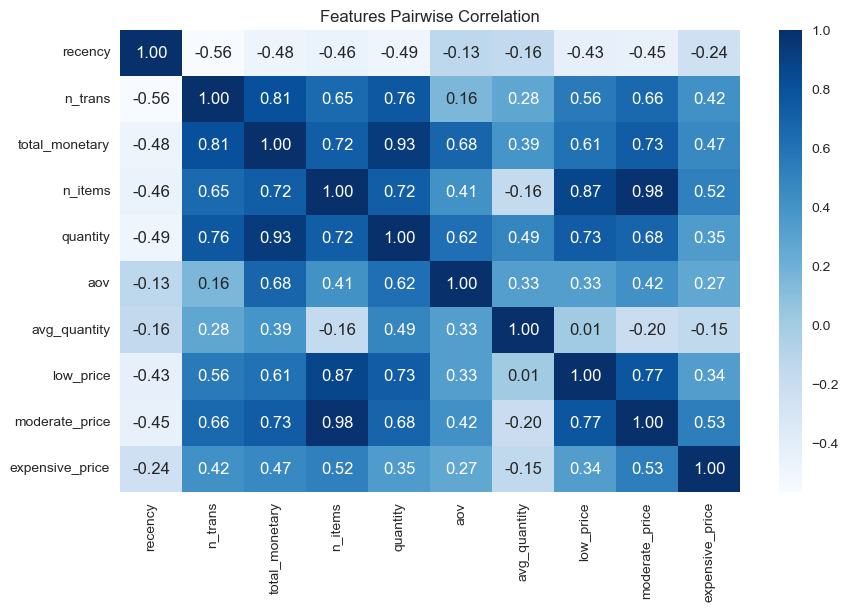

In [724]:
# check the correlation between features
(sns
 .heatmap(data=features.corr(method='spearman'), annot=True, cmap='Blues', fmt='.2f')
 .set(title='Features Pairwise Correlation')
);

**FINDINGS:**<br>
- We observe correlation values above 0.85 between some variables (i.e., `total_monetary and quantity`, `moderate_price and n_items`, `low_price and n_items` ), which indicates a high degree of a linear relationship between those variables. This high correlation suggests that the variables are highly redundant and may provide similar information. 

**ACTIONS**<br>
- We can consider dropping `total_monetary`, `moderate_price`, and `low_price` as one of the highly correlated variables to avoid multicollinearity issues and to simplify the model
- Additionally, we will perform `Principal Component Analysis (PCA)` to select a subset of features that capture the most relevant information for the KMeans Model. We will limit the features into 10

#### Standardized the features 

In [725]:
# standardize the features
scaler = StandardScaler()
features_st = scaler.fit_transform(features)

# check the result
features_st_df = pd.DataFrame(data=features_st, columns=features.columns)

# retive features_st_df
features_st_df.head()

,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity,low_price,moderate_price,expensive_price
0,2.323928,-0.425192,8.443290,-0.708416,14.489696,42.632658,60.987454,-0.543876,-0.708540,-0.437839
1,-0.900791,0.360754,0.257679,0.487398,0.252303,0.111197,-0.026898,0.342468,0.525529,-0.159436
2,-0.171984,-0.032219,-0.065007,-0.473943,0.227303,-0.031195,0.044801,0.157813,-0.631410,-0.437839
3,-0.741052,-0.425192,-0.062726,0.123964,-0.110393,0.578705,-0.039328,-0.248428,0.186160,0.954176
4,2.174174,-0.425192,-0.193378,-0.532561,-0.196503,-0.067243,-0.036449,-0.470014,-0.508004,-0.437839


#### PCA : Filter relevant features

In [726]:
# check features in `features_st_df`
pca_filter_features(features_st_df)

Explained Variance Ratio: [0.46722717 0.22081248]
Principal Components: [[-0.15808495  0.38120916  0.3190653   0.42012985  0.3290176   0.10265843
   0.06425068  0.39178633  0.41859814  0.31581095]
 [ 0.10820714 -0.07480617  0.30434815 -0.18937098  0.32138223  0.59179196
   0.57342093 -0.15154139 -0.18189611 -0.12585418]]
Singular Values: [142.30117917  97.82644287]


(           feature      _1st      _2nd   abs_1st
 3          n_items  0.420130 -0.189371  0.420130
 8   moderate_price  0.418598 -0.181896  0.418598
 7        low_price  0.391786 -0.151541  0.391786
 1          n_trans  0.381209 -0.074806  0.381209
 4         quantity  0.329018  0.321382  0.329018
 2   total_monetary  0.319065  0.304348  0.319065
 9  expensive_price  0.315811 -0.125854  0.315811
 0          recency -0.158085  0.108207  0.158085
 5              aov  0.102658  0.591792  0.102658
 6     avg_quantity  0.064251  0.573421  0.064251,
 None,
 None,
 None)

**FINDINGS:**<br>
- The features that have low absolute values in the first principal components suggest they are less relevant in describing the data's variability
- We can consider dropping `avg_quantity` features for machine learning models

 #### RFM Scoring Formulation

In [727]:
# choose RFM features
rfm_data = features[['recency', 'n_trans', 'total_monetary']]
rfm_data.columns = ['recency', 'frequency', 'monetary']

rfm_data = group_rfm_data(rfm_data)
rfm_data.head()

,recency,frequency,monetary,q_recency,q_frequency,q_monetary,r_score,f_score,m_score
0,325,1,77183.60,4,0,4,1,1,5
1,2,7,4310.00,0,2,3,5,3,4
2,75,4,1437.24,2,1,2,3,2,3
3,18,1,1457.55,1,0,2,4,1,3
4,310,1,294.40,4,0,0,1,1,1


In [728]:
# RFM Score range
print('The upper limit for each recency score range (1-5) ', np.percentile(rfm_data['recency'], [100, 90, 75, 50, 25]))
print('The upper limit for each frequency score range (1-5) ', np.percentile(rfm_data['frequency'], [50, 75, 95, 99, 100]))
print('The upper limit for each monetary score range (1-5)', np.percentile(rfm_data['monetary'], [25, 50, 75, 95, 100]))

The upper limit for each recency score range (1-5)  [373. 263. 142.  50.  17.]
The upper limit for each frequency score range (1-5)  [  2.   5.  13.  30. 206.]
The upper limit for each monetary score range (1-5) [   304.24      662.565    1631.6225   5735.2155 279138.02  ]


#### RFM + KMeans Features

In [729]:
# define rfm features
rfm_features = features_st_df[['recency', 'n_trans', 'total_monetary']]
rfm_features.columns = ['recency', 'frequency', 'monetary']

Elbow Method to determine the number of clusters to be formed:


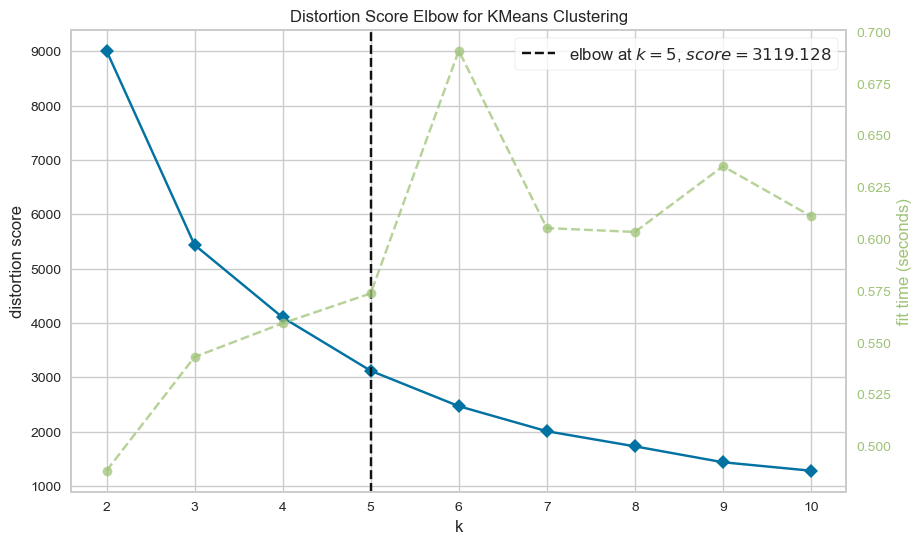

In [730]:
# Quick examination of elbow method to find numbers of clusters to make
elbow_check_n_clusters(rfm_features)

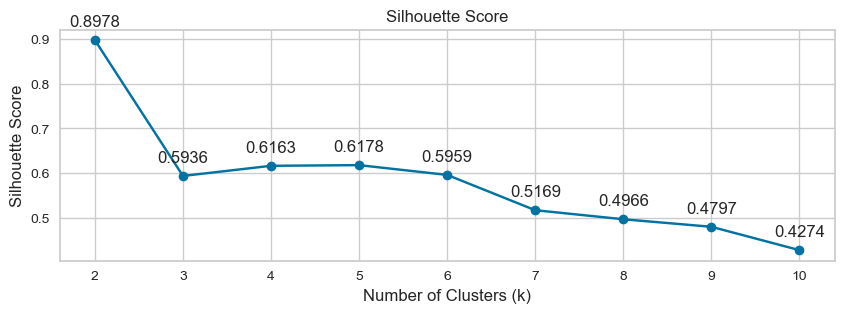

In [731]:
# check silhouette scores in different clusters number
check_silhouette_score(rfm_features)

 **FINDINGS:**<br>
 - The suggested number of clusters based on the "elbow" point is `5`, where the distortion score starts to level off (a lower distortion score is better). It suggested that 5 clusters are often considered a good starting point for clustering analysis
 - The  silhouette score of 5 clusters can be considered good

 #### KMeans Features

According to correlation check and PCA results, we decide to drop features `total_monetary`, `moderate_price`, `low_price`, `avg_quantity`. Here's the features after relevancy consideration:

In [732]:
# filter relevant features
dropped_features = ['total_monetary', 'moderate_price', 'avg_quantity', 'low_price',]
features_model = features_st_df.drop(columns=dropped_features)

# retrieve the result
features_model.head()

,recency,n_trans,n_items,quantity,aov,expensive_price
0,2.323928,-0.425192,-0.708416,14.489696,42.632658,-0.437839
1,-0.900791,0.360754,0.487398,0.252303,0.111197,-0.159436
2,-0.171984,-0.032219,-0.473943,0.227303,-0.031195,-0.437839
3,-0.741052,-0.425192,0.123964,-0.110393,0.578705,0.954176
4,2.174174,-0.425192,-0.532561,-0.196503,-0.067243,-0.437839


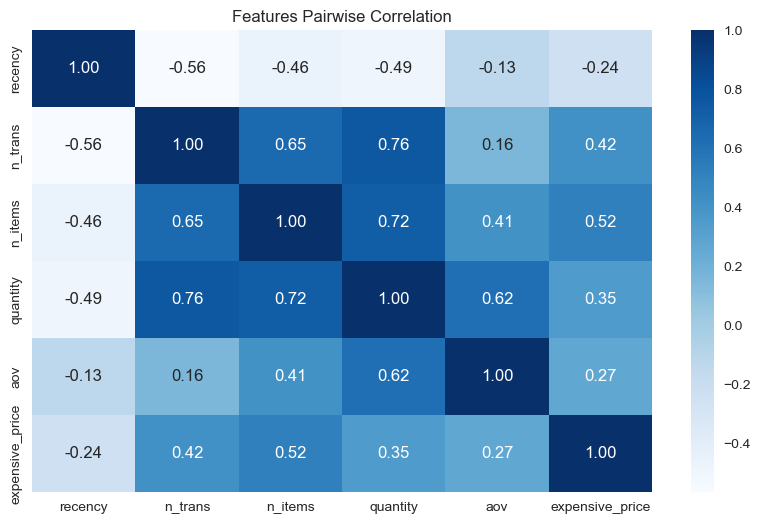

In [733]:
# check correlation
(sns
 .heatmap(data=features_model.corr(method='spearman'), annot=True, cmap='Blues', fmt='.2f')
 .set(title='Features Pairwise Correlation')
);

Elbow Method to determine the number of clusters to be formed:


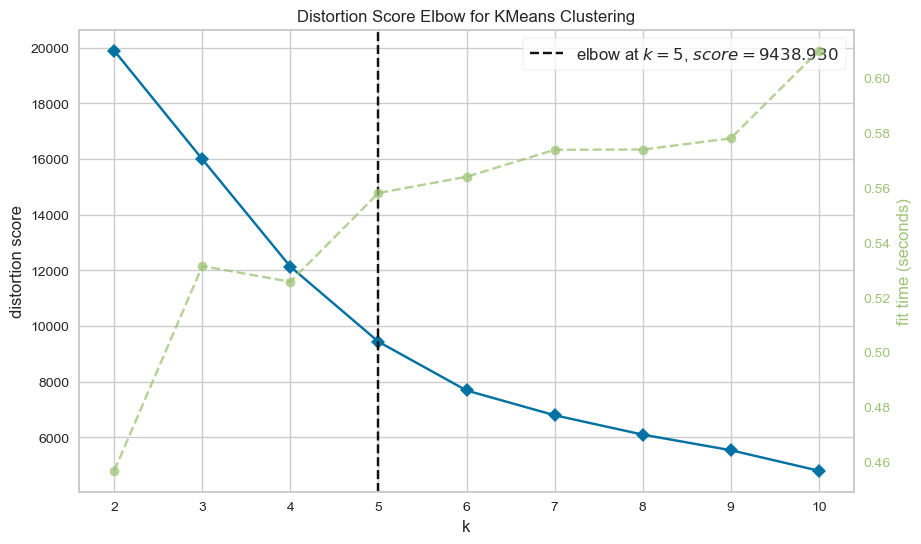

In [734]:
# Quick examination of elbow method to find numbers of clusters to make.
elbow_check_n_clusters(features_model)

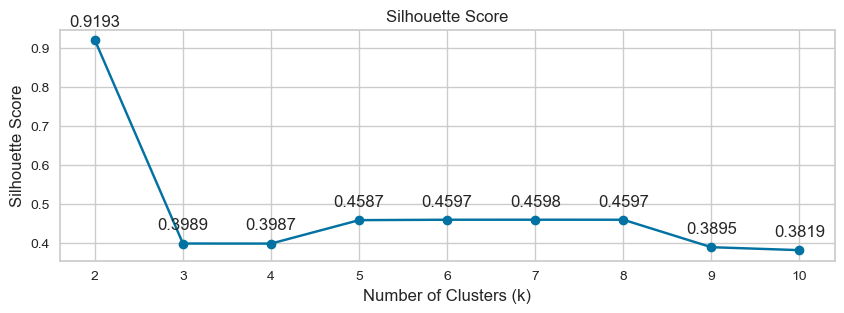

In [735]:
# check silhouette scores in different clusters number
check_silhouette_score(features_model)

**FINDINGS:**<br>
- The suggested number of clusters based on the "elbow" point is `5`, where the distortion score starts to level off (a lower distortion score is better). Five clusters are often considered a good starting point for clustering analysis. However, It will give us extra fit time. 
- The  silhouette score of 5 clusters can be considered good

### `clean_df_full`
This section will perform feature engineering to `clean_df_full` dataset

#### Modify the Features

In [736]:
# apply function to transform dataset to get the desired features
features_full = count_purchased_items_price_based(product_sum_full, purchase_sum_full)[0]
features_data_full = count_purchased_items_price_based(product_sum_full, purchase_sum_full)[1]

In [737]:
## check the result
print(features_full.shape)
features_full.tail()

(5705, 10)


,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity,low_price,moderate_price,expensive_price
5700,1,1,3.35,2,2,3.35,1.000000,0,2,0
5701,1,1,5699.00,634,1747,5699.00,2.755521,79,494,61
5702,0,1,6756.06,730,2010,6756.06,2.753425,111,552,67
5703,0,1,3217.20,56,654,3217.20,11.678571,0,51,8
5704,0,1,3950.72,217,731,3950.72,3.368664,2,177,38


#### Study the Features

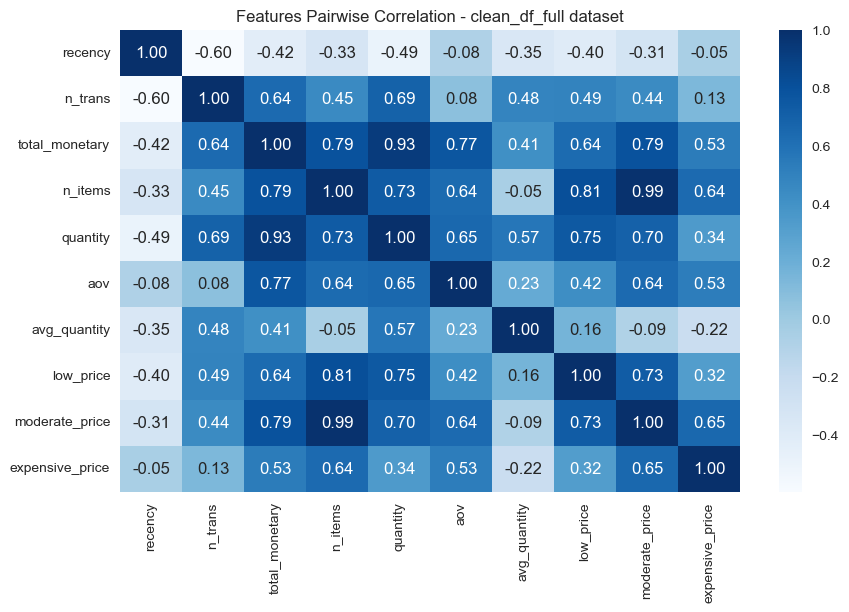

In [738]:
# check the correlation between features
(sns
 .heatmap(data=features_full.corr(method='spearman'), annot=True, cmap='Blues', fmt='.2f')
 .set(title='Features Pairwise Correlation - clean_df_full dataset')
);

**FINDINGS:**<br>
- We observe correlation values above 0.85 between some variables (i.e., `total_monetary and quantity`, `moderate_price and n_items`), which indicates a high degree of a linear relationship between those variables. This high correlation suggests that the variables are highly redundant and may provide similar information. 

**ACTIONS**<br>
- We can consider dropping `total_monetary` and `moderate_price` as one of the highly correlated variables to avoid multicollinearity issues and to simplify the model
- Additionally, we will perform `Principal Component Analysis (PCA)` to select a subset of features that capture the most relevant information for the KMeans Model. We will limit the features into 10

#### Standardized the features 

In [739]:
# standardize the features
sc = StandardScaler()
features_st_full = sc.fit_transform(features_full)

# check the result
features_st_df_full = pd.DataFrame(data=features_st_full, columns=features_full.columns)

# retive features_st_df
features_st_df_full.head()

,recency,n_trans,total_monetary,n_items,quantity,aov,avg_quantity,low_price,moderate_price,expensive_price
0,1.865521,-0.362800,9.576454,-0.675156,16.561243,37.571363,69.967173,-0.530652,-0.680425,-0.434982
1,-1.030098,0.519958,0.319330,0.328423,0.335379,0.017362,-0.018893,0.371627,0.354697,-0.305383
2,-0.375670,0.078579,-0.045596,-0.478376,0.306887,-0.108395,0.063349,0.183652,-0.615730,-0.434982
3,-0.886662,-0.362800,-0.043016,0.023414,-0.077973,0.430255,-0.033151,-0.229893,0.070039,0.213016
4,1.731050,-0.362800,-0.190771,-0.527571,-0.176110,-0.140232,-0.029849,-0.455462,-0.512218,-0.434982


#### PCA : Filter relevant features

In [740]:
# check features in `features_st_df`
pca_filter_features(features_st_df_full)

Explained Variance Ratio: [0.42749448 0.19739286]
Principal Components: [[-0.11274049  0.32305644  0.32479986  0.43182371  0.32626595  0.19410831
   0.08602119  0.40355196  0.42955381  0.30341332]
 [ 0.01600535  0.03242596  0.38785861 -0.2789392   0.40433327  0.4082166
   0.5166594  -0.19106716 -0.26966941 -0.25329752]]
Singular Values: [156.16837141 106.11909747]


(           feature      _1st      _2nd   abs_1st
 3          n_items  0.431824 -0.278939  0.431824
 8   moderate_price  0.429554 -0.269669  0.429554
 7        low_price  0.403552 -0.191067  0.403552
 4         quantity  0.326266  0.404333  0.326266
 2   total_monetary  0.324800  0.387859  0.324800
 1          n_trans  0.323056  0.032426  0.323056
 9  expensive_price  0.303413 -0.253298  0.303413
 5              aov  0.194108  0.408217  0.194108
 0          recency -0.112740  0.016005  0.112740
 6     avg_quantity  0.086021  0.516659  0.086021,
 None,
 None,
 None)

**FINDINGS:**<br>
- The PCA features assessment result is similar to the `clean_df`. 
- We can consider dropping `avg_quantity` features for machine learning models

 #### RFM Scoring Formulation

In [741]:
# choose RFM features
rfm_data_full = features_full[['recency', 'n_trans', 'total_monetary']]
rfm_data_full.columns = ['recency', 'frequency', 'monetary']


# apply the `group_rfm_data` to categorize value into specific range group
# modify the bin edges of the `frequency` columns to avoid duplicates bin edges
rfm_data_full = group_rfm_data (rfm_data_full,
                                q_frequency=[0, 0.51, 0.75, 0.95, 0.99, 1]
                               )
# retrieve the result    
rfm_data_full.tail()

,recency,frequency,monetary,q_recency,q_frequency,q_monetary,r_score,f_score,m_score
5700,1,1,3.35,0,0,0,5,1,1
5701,1,1,5699.00,0,0,4,5,1,5
5702,0,1,6756.06,0,0,4,5,1,5
5703,0,1,3217.20,0,0,3,5,1,4
5704,0,1,3950.72,0,0,3,5,1,4


In [742]:
# RFM Score range
print('The upper limit for each recency score range (1-5) ', np.percentile(rfm_data_full['recency'], [100, 90, 75, 50, 25, 0]))
print('The upper limit for each frequency score range (1-5) ', np.percentile(rfm_data_full['frequency'], [0, 51, 75, 95, 99, 100]))
print('The upper limit for each monetary score range (1-5)', np.percentile(rfm_data_full['monetary'], [0, 25, 50, 75, 95, 100]))

The upper limit for each recency score range (1-5)  [373.  298.6 200.   71.   23.    0. ]
The upper limit for each frequency score range (1-5)  [  1.   2.   4.  11.  26. 206.]
The upper limit for each monetary score range (1-5) [4.2000000e-01 2.3417000e+02 6.1040000e+02 1.5657800e+03 5.3058160e+03
 2.7913802e+05]


#### RFM + KMeans Features

In [743]:
# define rfm features
rfm_features_full = features_st_df_full[['recency', 'n_trans', 'total_monetary']]
rfm_features_full.columns = ['recency', 'frequency', 'monetary']

Elbow Method to determine the number of clusters to be formed:


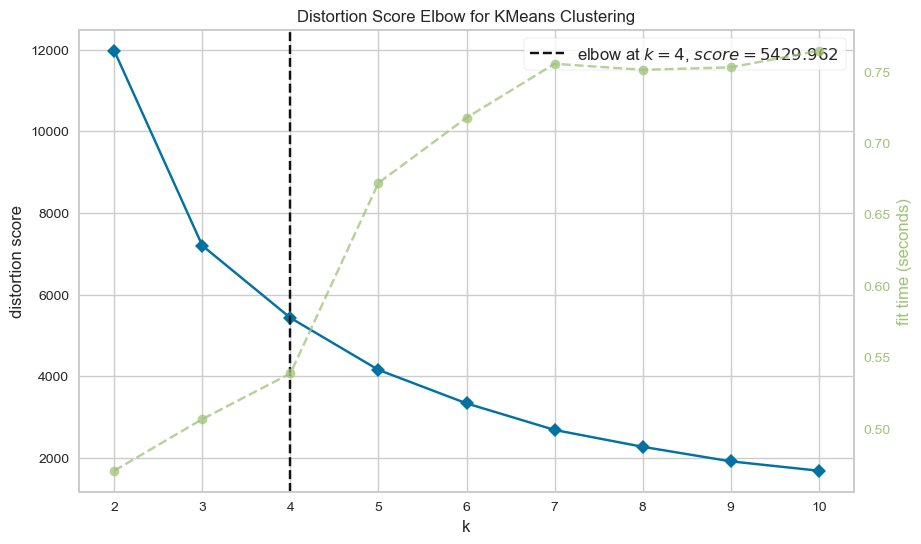

In [744]:
# Quick examination of elbow method to find numbers of clusters to make
elbow_check_n_clusters(rfm_features_full)

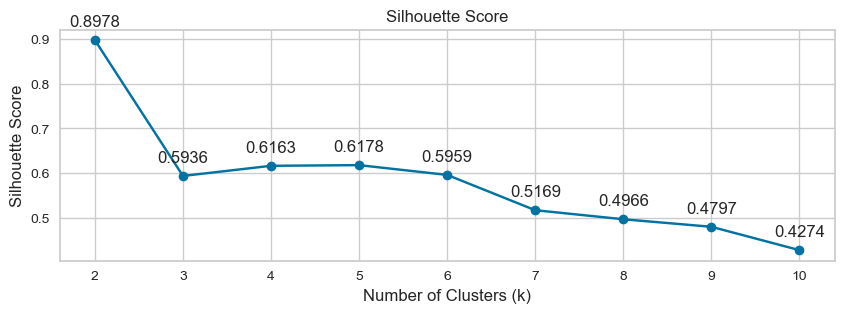

In [745]:
# check silhouette scores in different clusters number
check_silhouette_score(rfm_features)

 **FINDINGS:**<br>
 - The suggested number of clusters based on the "elbow" point is `5`, where the distortion score starts to level off (a lower distortion score is better). It suggested that 5 clusters are often considered a good starting point for clustering analysis
 - The  silhouette score of 5 clusters can be considered good

 #### KMeans Features

According to correlation check and PCA results, we decide to drop features `total_monetary`, `moderate price`, `avg_quantity`. Here's the features after relevancy consideration:

In [746]:
# filter relevant features
dropped_features_full = ['total_monetary', 'moderate_price', 'avg_quantity']
features_model_full = features_st_df_full.drop(columns=dropped_features)

# retrieve the result
features_model_full.head()

,recency,n_trans,n_items,quantity,aov,expensive_price
0,1.865521,-0.362800,-0.675156,16.561243,37.571363,-0.434982
1,-1.030098,0.519958,0.328423,0.335379,0.017362,-0.305383
2,-0.375670,0.078579,-0.478376,0.306887,-0.108395,-0.434982
3,-0.886662,-0.362800,0.023414,-0.077973,0.430255,0.213016
4,1.731050,-0.362800,-0.527571,-0.176110,-0.140232,-0.434982


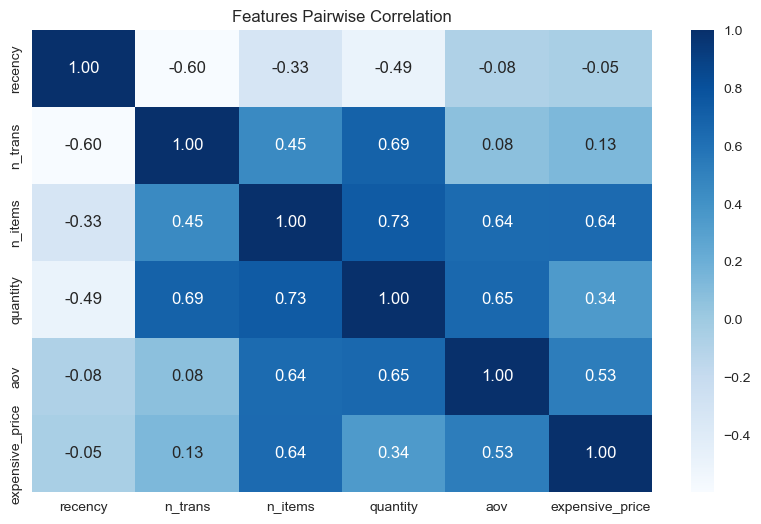

In [747]:
# check correlation
(sns
 .heatmap(data=features_model_full.corr(method='spearman'), annot=True, cmap='Blues', fmt='.2f')
 .set(title='Features Pairwise Correlation')
);

Elbow Method to determine the number of clusters to be formed:


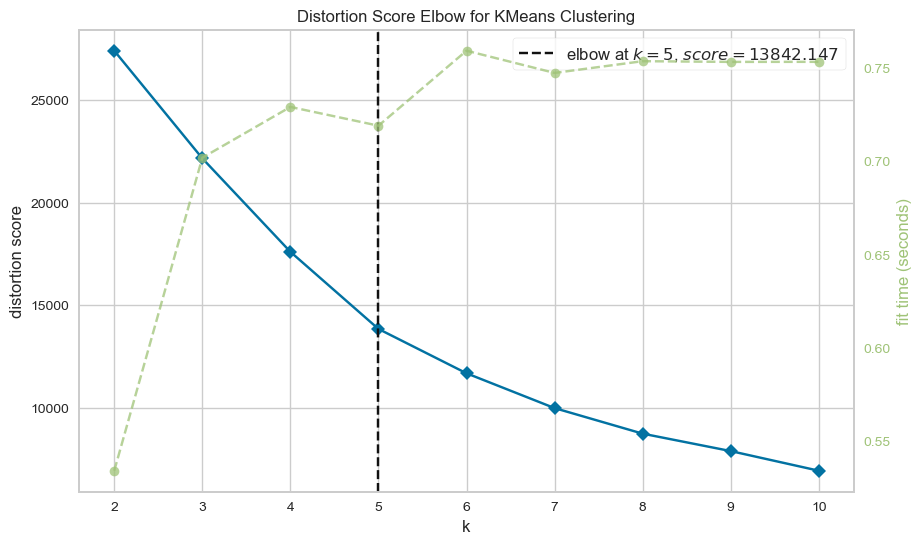

In [748]:
# Quick examination of elbow method to find numbers of clusters to make.
elbow_check_n_clusters(features_model_full)

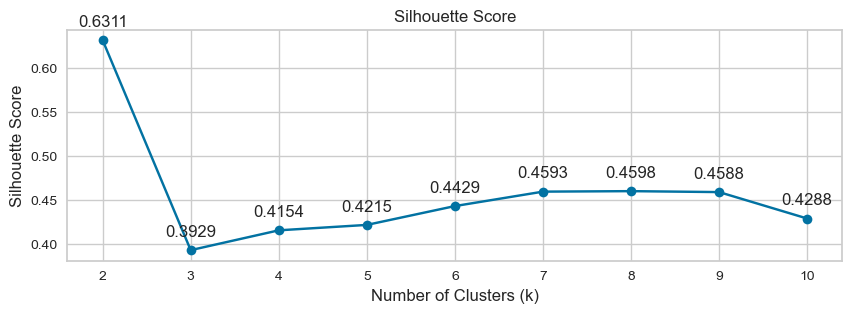

In [749]:
# check silhouette scores in different clusters number
check_silhouette_score(features_model_full)

**FINDINGS:**<br>
- The suggested number of clusters based on the "elbow" point is `5`, where the distortion score starts to level off (a lower distortion score is better). Five clusters are often considered a good starting point for clustering analysis. However, It will give us extra fit time. 
- The  silhouette score of 5 clusters can be considered good

## MODEL APPROACH TO GENERATING CUSTOMER SEGMENTATION

This section will generate customer segmentation using :<br>
1. RFM scoring
2. KMeans model for clustering
3. Combination between both methods (RFM + KMeans)

 ### Function Lists

**Customer Segmentation with KMeans Model**

In [750]:
# define function to fit and predict cluster
# then automaticly add the cluster label to dataframe

def kmeans_clustering (features, k, dataframe, label_name):
    
    km = KMeans(n_clusters=k, random_state=42)    # define the k_means model with k clusters
    label = km.fit_predict(features)              # predict the clusters for observations
    dataframe[label_name] = label                 # store cluster labels in the field of our dataset

**Visualizing Customer Segmentation**

In [751]:
# Define colors for each cluster
colors_5 = ['red', 'green', 'blue', 'yellow', 'purple']
colors_10 = ['red', 'green', 'blue', 'yellow', 'purple', 'orange', 'cyan', 'pink', 'teal', 'gray' ]

# Create function 2D scatter plot area
def scatterplot_clusters_2d (data, x, y, number_clusters, cluster_label, colors):
    
    '''
    Generate a 2D scatter plot with filled areas for each cluster.

    Parameters:
    - data (DataFrame): The input DataFrame containing the data.
    - x (str): The column name for the x-axis.
    - y (str): The column name for the y-axis.
    - k (int): The number of clusters.
    - cluster_label (str): The column name for the cluster labels.
    - colors (list): List of colors for each cluster.

    '''
    # define cluster_number
    k = number_clusters + 1
    
    # set figure initialization
    plt.figure(figsize=(10,3))
    plt.title(f'Customer segmentation based on {x} and {y}')
    
    # Create a scatter plot for each cluster
    for cluster_id, color in zip(range(1, k), colors):
        cluster_data = data[data[cluster_label] == cluster_id]
        plt.scatter(x=cluster_data[x], y=cluster_data[y], color=color, label=f'Cluster {cluster_id}')

    # Fill areas for each cluster
    for cluster_id, color in zip(range(1, k), colors):
        cluster_data = data[data[cluster_label] == cluster_id]
        plt.fill_between(cluster_data[x], cluster_data[y], color=color, alpha=0.2)

    plt.xlabel(x)
    plt.ylabel(y)
    plt.legend()
    plt.show()


In [752]:
# Define colors for each cluster
cluster_5colors = {'Cluster 1': 'red', 'Cluster 2': 'green', 'Cluster 3': 'blue', 'Cluster 4': 'yellow', 'Cluster 5': 'orange'}
cluster_10colors = {'Cluster 1': 'red', 'Cluster 2': 'green', 'Cluster 3': 'blue', 'Cluster 4': 'yellow', 'Cluster 5': 'orange',
                    'Cluster 6': 'purple', 'Cluster 7': 'pink', 'Cluster 8': 'cyan', 'Cluster 9': 'magenta', 'Cluster 10': 'brown'}


# Create the 3D scatter plot function
def scatterplot_rfm_3d (data, cluster_labels, cluster_colors):
    
    '''
    Create a 3D scatter plot of RFM data with cluster labels.

    Parameters:
    - data (pandas DataFrame): The RFM data containing columns for 'frequency', 'monetary', and 'recency'.
    - cluster_labels (str): The column name in the data DataFrame representing the cluster labels.
    - cluster_colors (dict): A dictionary mapping cluster labels to color codes.

    Returns:
    - None (displays the plot)

    Example usage:
    scatterplot_rfm_3d(rfm_data, 'cluster_km5', cluster_colors)
    '''
    
    # Create the 3D scatter plot function
    fig = px.scatter_3d(
                        data,
                        x='frequency',
                        y='monetary',
                        z='recency',
                        color=cluster_labels,
                        color_discrete_map=cluster_colors,
                        symbol=cluster_labels,
                        opacity=0.8,
                        width=800,
                        height=900,
                        title=f'RFM Data Clustering on (cluster_labels) model'
    )

    # Update the layout
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='Frequency'),
            yaxis=dict(title='Monetary'),
            zaxis=dict(title='Recency')
        ),
        legend=dict(
            title='Cluster',
            x=0.85, y=0.95,  # Adjust the position of the legend
            bgcolor='rgba(255, 255, 255, 0.5)',  # Set a transparent background color for the legend
            bordercolor='rgba(0, 0, 0, 0.5)',  # Set the border color for the legend
            orientation='v'  # Set the orientation to vertical
        )
    )

    # Show the figure
    fig.show()


### `clean_df`
This section will perform clustering with three methods, RFM Scoring, KMeans + RFM, and KMeans model. 

#### RFM Scoring 

**Generate Customer Segmentation**

In [753]:
# assign the label
rfm_data['label'] = rfm_data.apply(label_rfm_segments, axis=1)

**Visualize Customer Segmentation**

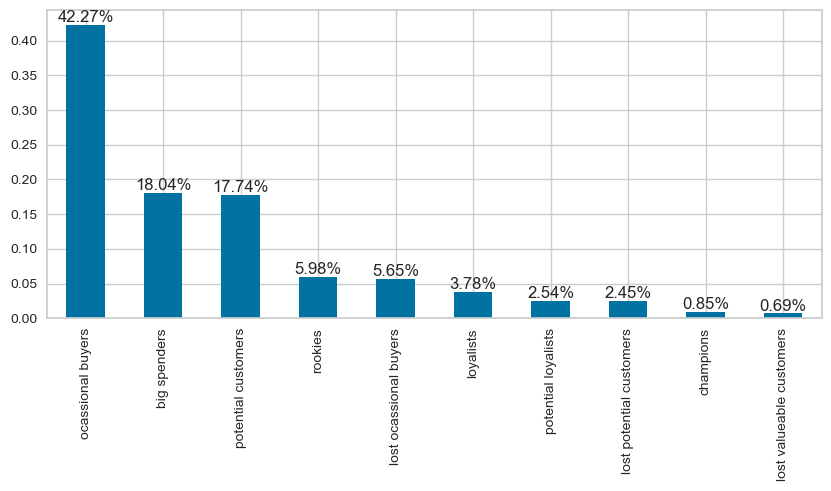

In [754]:
# visualize the segmentation
plt.figure(figsize=(10,4))
rfm_data['label'].value_counts(normalize=True).plot(kind='bar')

# Add annotations to the bars
value_counts = rfm_data['label'].value_counts(normalize=True)
for i, v in enumerate(value_counts):
    plt.text(i, v, f"{v:.2%}", ha='center', va='bottom')
    
plt.show()

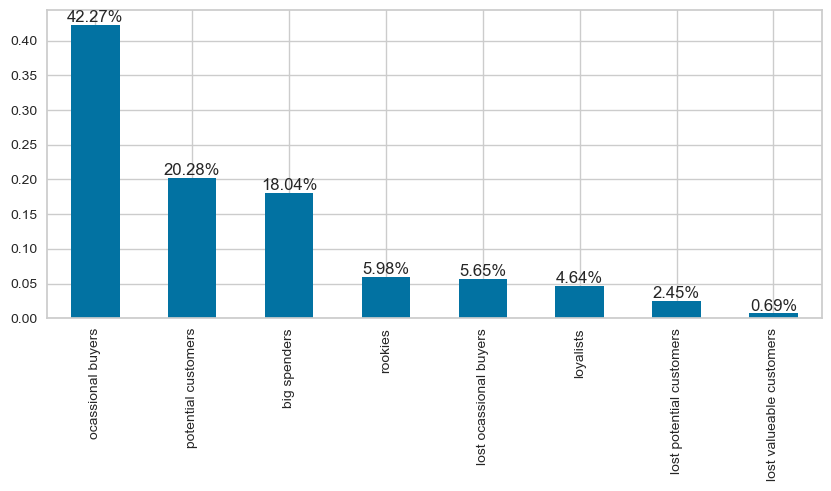

In [755]:
# simplify the segment by merging similar groups
rfm_data['simple_label'] = (rfm_data['label']
                            .replace(['forget it', 'lost loyalists', 'lost big spenders'],'lost customers')
                            .replace('potential loyalists', 'potential customers')
                            .replace('champions', 'loyalists')
                           )

# visualize the simplify segmentation
plt.figure(figsize=(10,4))
rfm_data['simple_label'].value_counts(normalize=True).plot(kind='bar')

# Add annotations to the bars
value_counts = rfm_data['simple_label'].value_counts(normalize=True)
for i, v in enumerate(value_counts):
    plt.text(i, v, f"{v:.2%}", ha='center', va='bottom')
    
plt.show()

In [756]:
# check typical transaction frequency in `big spenders`
rfm_data.query('label == "big spenders"')['frequency'].value_counts()

4     108
5     107
6     104
7     100
8      76
3      61
9      54
11     52
10     51
12     40
13     29
Name: frequency, dtype: int64

In [757]:
# check typical transaction frequency in `big spenders`
rfm_data['frequency'].value_counts(normalize=True).head()

1    0.347254
2    0.191740
3    0.115828
4    0.091140
5    0.054453
Name: frequency, dtype: float64

**Visualize Customer Segmentation**

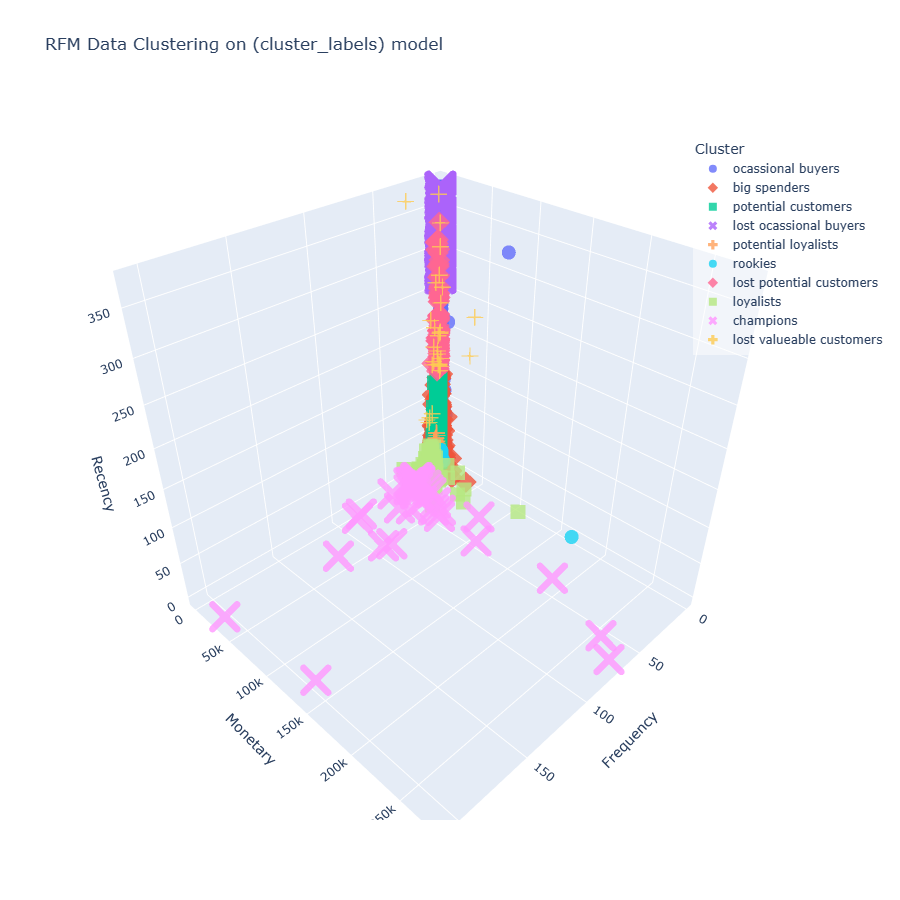

In [758]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=rfm_data,
                    cluster_labels='label',
                    cluster_colors=cluster_10colors)

**INSIGHT:**<br>
- The RFM segmentation reveals that almost half of the customers fall into the `Occasional Buyers` segment, indicating they are `one-time buyers`. This is followed by the `Big Spenders` and `Potential Customers` segments, which have a transaction frequency ranging from 3 to 13 times per year.
- This suggests that the majority of `EVERYTHING PLUS` customers make only 1-3 transactions throughout the year, indicating a relatively low level of customer loyalty (less than 5%).
- To maintain or increase revenue, `EVERYTHING PLUS` may need to focus on acquiring new customers, as the typical customer behavior is characterized by 1-3 purchases. These customers contribute significantly to the overall revenue.
- These insights indicate the need for targeted strategies to engage and retain customers, as well as efforts to attract new customers to sustain and grow revenue for `EVERYTHING PLUS`

#### RFM + KMeans 

**Generate Customer Segmentations**

In [759]:
# retrieve features for RMF + KMeans model
rfm_features.head()

,recency,frequency,monetary
0,2.323928,-0.425192,8.443290
1,-0.900791,0.360754,0.257679
2,-0.171984,-0.032219,-0.065007
3,-0.741052,-0.425192,-0.062726
4,2.174174,-0.425192,-0.193378


In [760]:
# apply `kmeans_clustering` function
# generate custumer segmentation with 5 clusters
kmeans_clustering (rfm_features, 5, rfm_data, 'cluster_km5_rfm')

# standardize the cluster
rfm_data['cluster_km5_rfm'] = rfm_data['cluster_km5_rfm'] + 1

In [761]:
# check clusters' characteristics
(rfm_data
 .groupby('cluster_km5_rfm')['recency', 'frequency', 'monetary']
 .agg(['min', 'max', 'median', 'mean'])
 .sort_values(by=('monetary', 'mean'), ascending=False)
)

recency                         frequency              \
                    min  max median        mean       min  max median   
cluster_km5_rfm                                                         
4                     0   24    4.5    7.000000         2   72   50.0   
2                     0    3    1.0    1.142857        86  206   97.0   
5                     0  372    4.0   14.702564         1   62   19.0   
1                     0  163   32.0   43.290755         1   15    3.0   
3                   143  373  243.0  248.150235         1   12    1.0   

                              monetary                                        
                       mean        min        max      median           mean  
cluster_km5_rfm                                                               
4                 42.333333  116560.08  279138.02  181431.645  190463.870000  
2                127.428571   11189.91  136161.83   40495.990   50117.070000  
5                 22.200000    1296.44   91062.38    8004.920   13470.488974  
1                  3.686377       5.90   21429.39     813.520    1343.305403  
3                  1.542723       3.75    9341.26     308.580     474.198817

In [762]:
# check segments proportion
rfm_data['cluster_km5_rfm'].value_counts(normalize=True)

1    0.706276
3    0.245731
5    0.044993
2    0.001615
4    0.001384
Name: cluster_km5_rfm, dtype: float64

**Visualize Customer Segmentation**

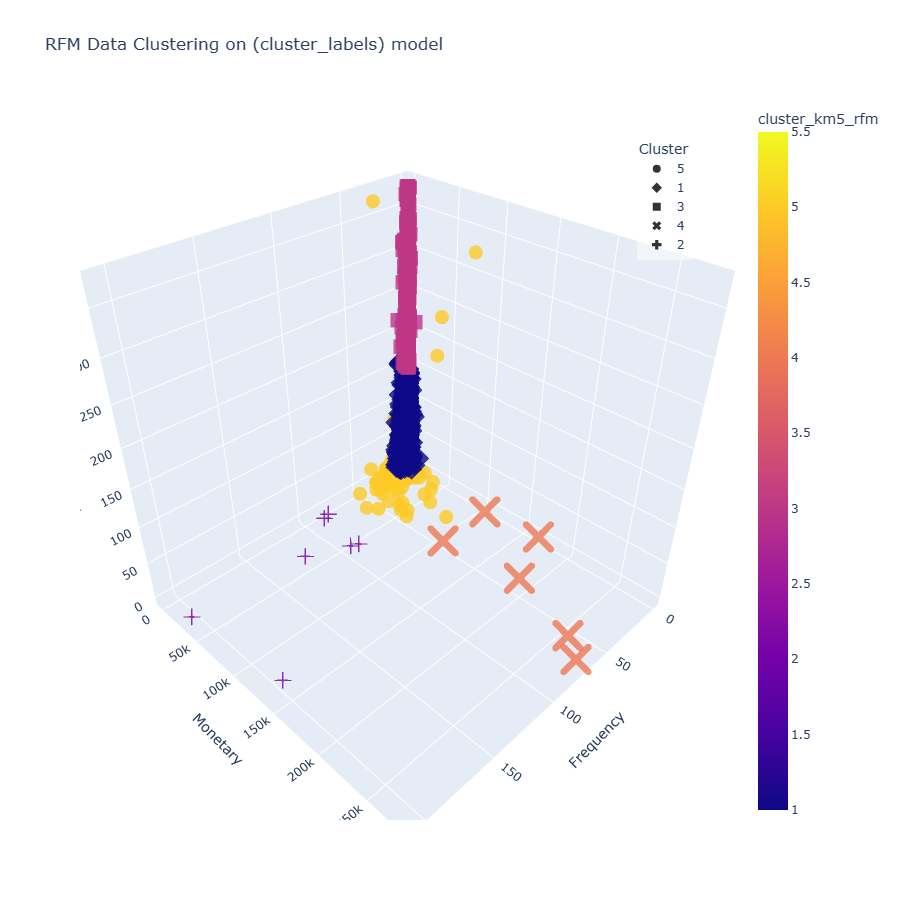

In [763]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=rfm_data,
                    cluster_labels='cluster_km5_rfm',
                    cluster_colors=cluster_5colors)

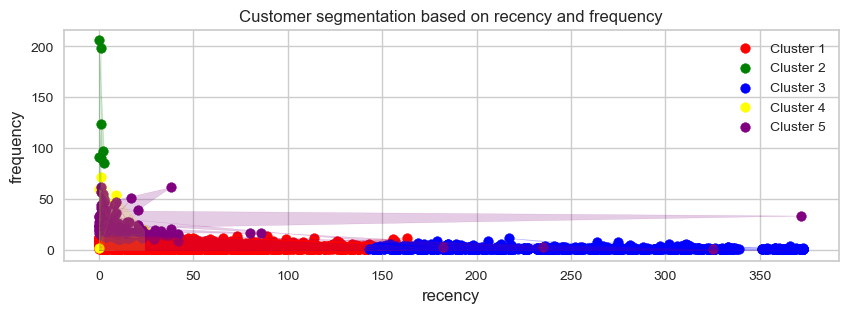

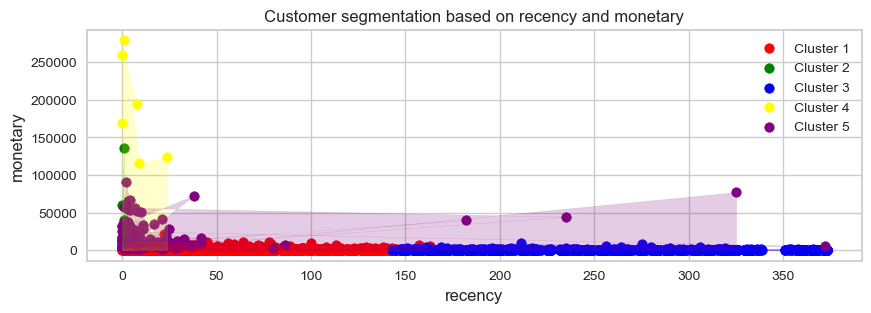

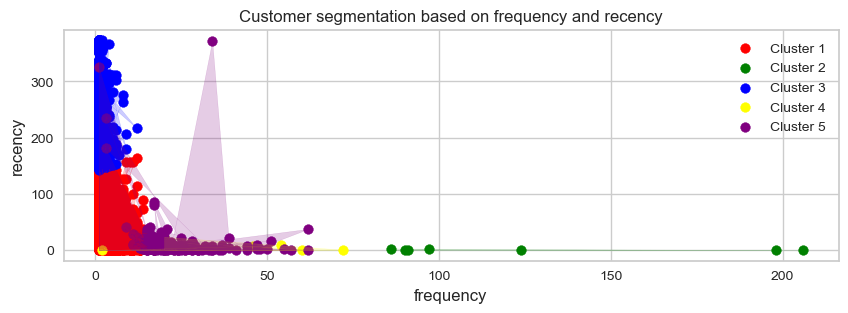

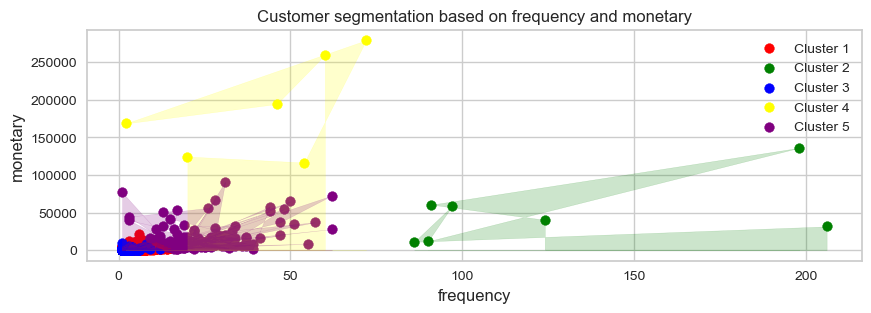

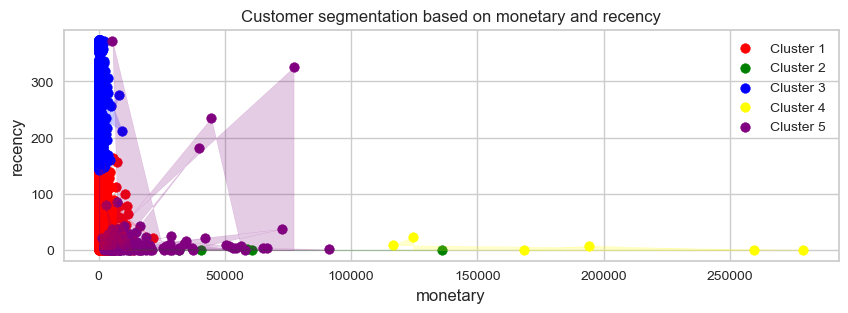

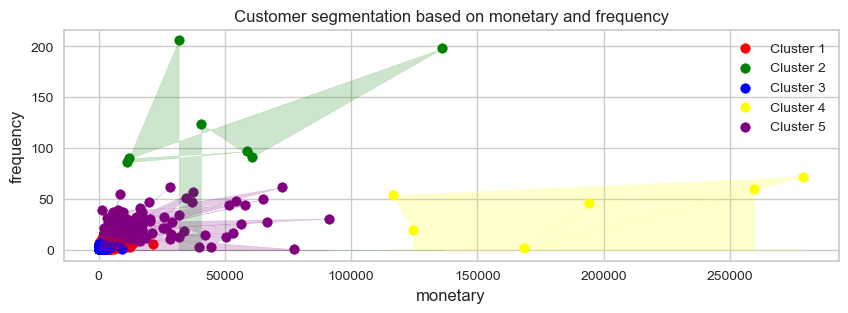

In [764]:
# define features to be visualized
rfm_features_test = ['recency', 'frequency', 'monetary']

# visualize the cluster distributions based on two variables
for i in rfm_features_test:
    for j in rfm_features_test:
        if i != j:
            scatterplot_clusters_2d (data=rfm_data,
                                     x=i,
                                     y=j,
                                     number_clusters=5,
                                     cluster_label='cluster_km5_rfm',
                                     colors=colors_5)

**INSIGHT:**<br>
- The RFM + KMeans segmentation reveals that up to 70% of the customers fall into the `cluster 1`, indicating they commonly made 3 transactions and generated medium to low revenue throughout the year.
- Followed by `cluster 3`, contributing almost 25% of customers. This cluster may be considered cheap customers who have low engagement and low revenue. 
- It suggests that most `EVERYTHING PLUS` customers (around 95%) are cheap customers.
- Less than 5% of customers (`cluster 5, 2, 4`) are considered valuable customers who show good engagement, more frequent transactions, and generate high revenue

#### KMeans

**Generate Customer Segmentations**

In [765]:
# retrieve features
features_model.head()

,recency,n_trans,n_items,quantity,aov,expensive_price
0,2.323928,-0.425192,-0.708416,14.489696,42.632658,-0.437839
1,-0.900791,0.360754,0.487398,0.252303,0.111197,-0.159436
2,-0.171984,-0.032219,-0.473943,0.227303,-0.031195,-0.437839
3,-0.741052,-0.425192,0.123964,-0.110393,0.578705,0.954176
4,2.174174,-0.425192,-0.532561,-0.196503,-0.067243,-0.437839


In [766]:
# apply `kmeans_clustering` function
# generate customer segmentation with 5 clusters
kmeans_clustering (features_model, 5, features_data, 'cluster_km5')

# sync columns name
features_data.rename(columns={'n_trans':'frequency', 'total_monetary':'monetary'}, inplace=True)

# standardize the cluster
features_data['cluster_km5'] = features_data['cluster_km5'] + 1

In [767]:
# describe the clustering result
(features_data
 .groupby('cluster_km5')
 .agg(['min', 'max', 'median', 'mean'])
 .drop(columns='uid')
 .sort_values(by=('monetary', 'mean'), ascending=False)
)


recency                         frequency                         \
                min  max median        mean       min  max median       mean   
cluster_km5                                                                    
5                 0  325  162.5  162.500000         1    2    1.5   1.500000   
3                 0   24    2.0    4.266667        17  206   60.0  80.000000   
4                 0  179   11.0   20.870736         1   86   10.0  12.402154   
1                 0  169   36.0   46.348083         1   20    2.0   3.194322   
2               141  373  245.0  250.000000         1   34    1.0   1.553435   

             monetary                                       n_items        \
                  min        max      median           mean     min   max   
cluster_km5                                                                 
5            77183.60  168472.50  122828.050  122828.050000       1     3   
3            11926.15  279138.02   65039.620  104988.535333     124  1785   
4              646.42   72708.09    3939.320    6123.852747       9   717   
1                5.90   15021.50     695.245    1082.783721       1   191   
2                3.75   44534.30     306.980     543.175649       1   158   

                               quantity                                 \
            median        mean      min     max   median          mean   
cluster_km5                                                              
5              2.0    2.000000    74215   80997  77606.0  77606.000000   
3            699.0  789.466667     6177  196844  58343.0  58131.933333   
4            171.0  188.479354      215   50255   2159.0   3529.292639   
1             37.0   45.835177        2   17280    404.5    685.417035   
2             17.0   23.937977        1   18028    149.0    276.646947   

                      aov                                          \
                      min           max      median          mean   
cluster_km5                                                         
5            77183.600000  84236.250000  80709.9250  80709.925000   
3              132.512778   6228.226500   1300.7924   2128.793114   
4               33.242051   6207.670000    401.6050    556.440209   
1                5.900000   4366.780000    285.5820    347.931430   
2                3.750000  14844.766667    227.7520    337.618082   

             avg_quantity                                           low_price  \
                      min           max        median          mean       min   
cluster_km5                                                                     
5            26999.000000  74215.000000  50607.000000  50607.000000         0   
3                7.569853    564.298387     67.278660    141.674933        14   
4                1.596386   3576.000000     12.366667     40.622399         0   
1                1.000000   8000.000000     12.000000     31.058827         0   
2                1.000000   4300.000000      9.350649     33.379007         0   

                                    moderate_price                           \
             max median        mean            min   max median        mean   
cluster_km5                                                                   
5              1    0.5    0.500000              0     3    1.5    1.500000   
3            595  195.0  252.800000            160  1402  546.0  605.666667   
4            241   41.0   48.157989              3   511  131.0  142.387792   
1             95    8.0   11.904867              0   157   27.0   33.757743   
2             53    3.0    5.016221              0   137   13.0   18.244275   

            expensive_price                         
                        min  max median       mean  
cluster_km5                                         
5                         0    0    0.0   0.000000  
3                         2  141   19.0  30.866667  
4                         0   43    4.0   5.019749  
1       

In [768]:
# check segments proportion
features_data['cluster_km5'].value_counts(normalize=True)

1    0.625750
2    0.241809
4    0.128519
3    0.003461
5    0.000461
Name: cluster_km5, dtype: float64

**Visualize Customer Segmentation**

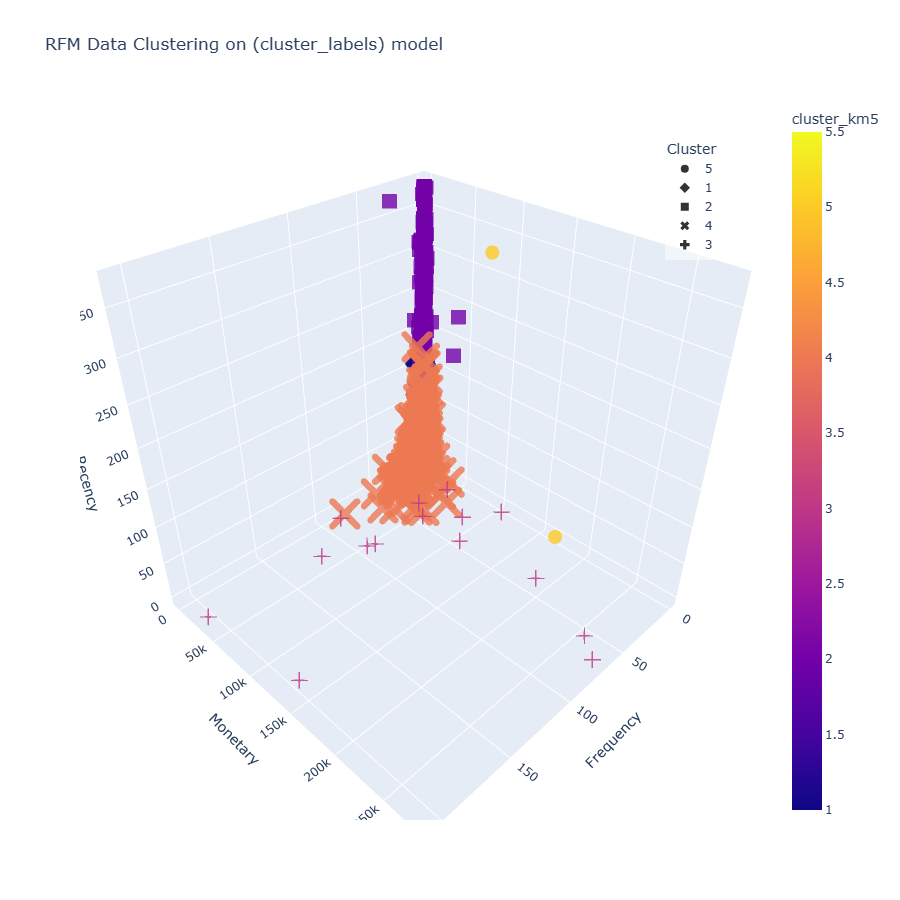

In [769]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=features_data,
                    cluster_labels='cluster_km5',
                    cluster_colors=cluster_5colors)

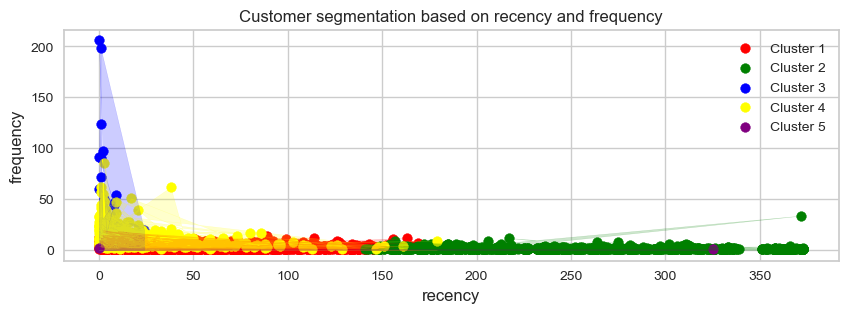

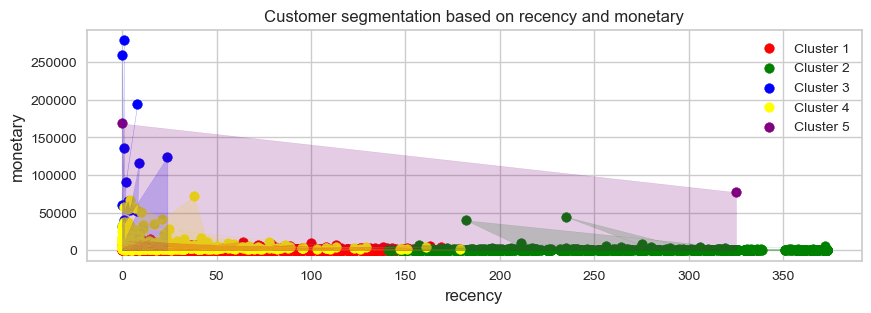

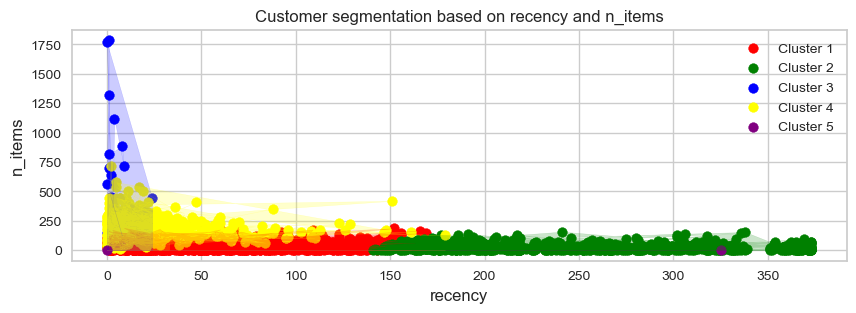

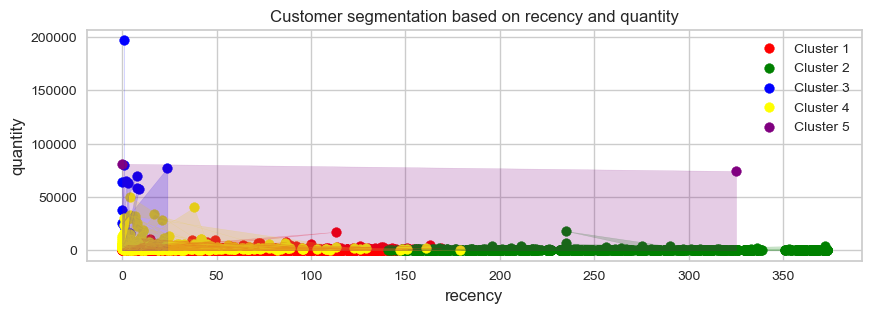

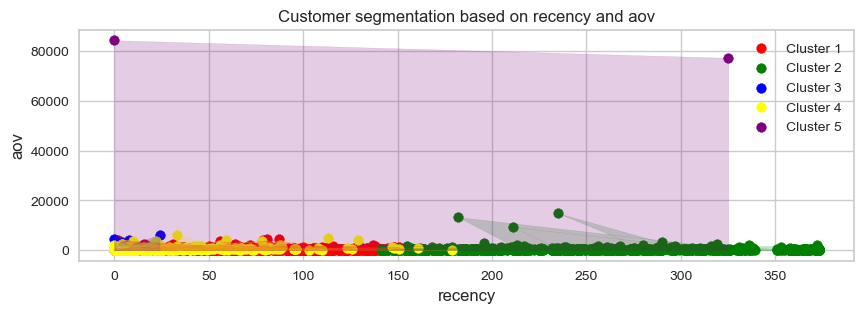

...

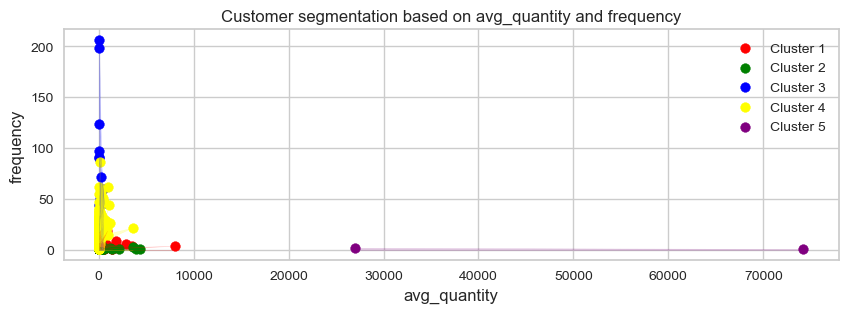

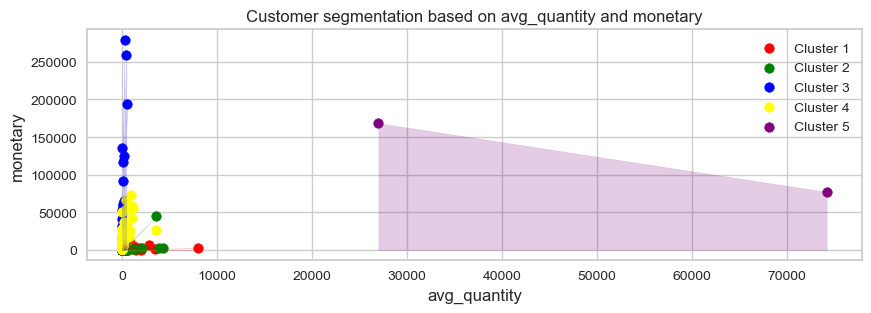

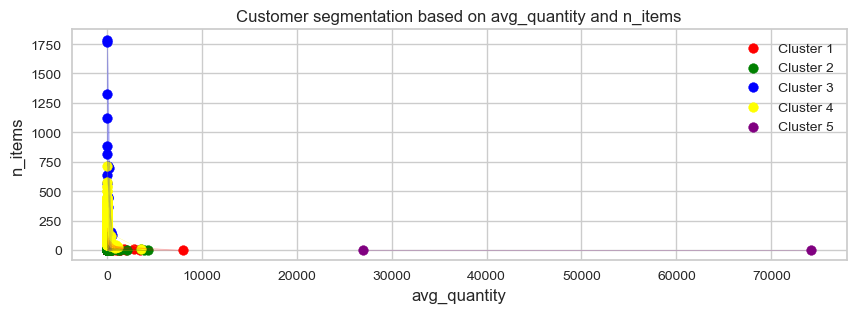

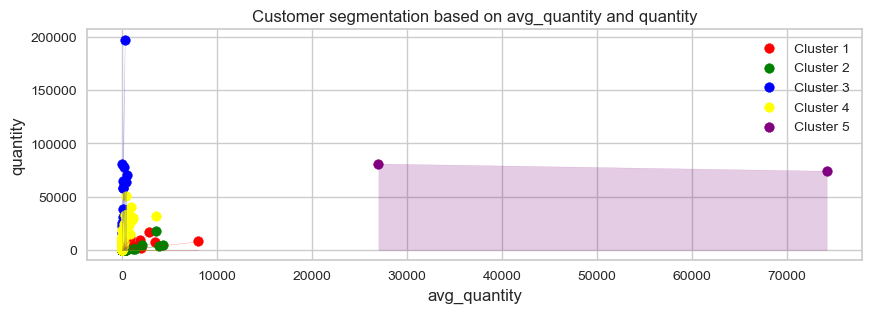

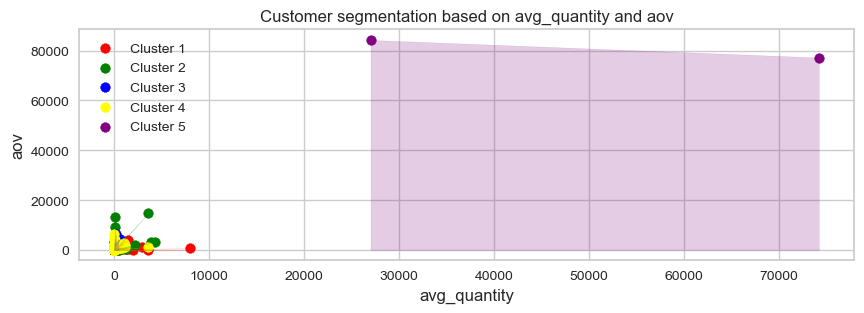

In [770]:
# define features to be visualized
features_test = ['recency', 'frequency', 'monetary', 'n_items', 'quantity', 'aov', 'avg_quantity']

# visualize the cluster distributions based on two variables
for i in features_test:
    for j in features_test:
        if i != j:
            scatterplot_clusters_2d (data=features_data,
                                     x=i,
                                     y=j,
                                     number_clusters=5,
                                     cluster_label='cluster_km5',
                                     colors=colors_5)

**INSIGHT:**<br>
- The KMeans segmentation shows a almost similar distribution of segments across clusters, with `Cluster 1` being the largest, followed by `Cluster 2, 4, 3, and 5`.
- However, it's important to note that since the KMeans model incorporates additional features beyond RFM, the clusters may have different definitions compared to the clusters generated by the RFM+KMeans clustering method.
- The analysis reveals that `Cluster 1` is the dominant segment, comprising around 70% of customers. This segment is characterized by customers who typically make 2 transactions, generating lower average revenue and average recency compared to `Cluster 1` from the RFM+KMeans clustering method.
- While the cluster names and descriptions may vary, the overall patterns identified in the KMeans segmentation align with those observed in the RFM+KMeans segmentation.
- The only different is just the proportion of cheap customers. The `KMeans`method  shows lower cheap customers than the `RFM + KMeans` method.
- The cluster distribution can be clearly observed in the scatter plot diagram between recency and the number of items purchased.
- These insights suggest that the KMeans segmentation provides a similar understanding of customer behavior compared to the RFM+KMeans segmentation, despite some differences in cluster composition and characteristics

### `clean_df_full`
This section will perform clustering with three methods, RFM Scoring, KMeans + RFM, and KMeans model. 

#### RFM Scoring 

**Generate Customer Segmentation**

In [771]:
# assign the label
rfm_data_full['label'] = rfm_data_full.apply(label_rfm_segments, axis=1)

**Visualize Customer Segmentation**

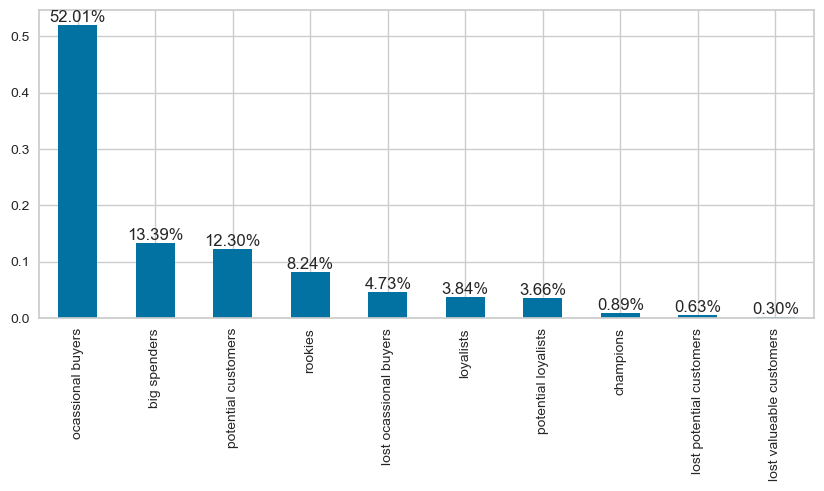

In [772]:
# visualize the segmentation
plt.figure(figsize=(10,4))
rfm_data_full['label'].value_counts(normalize=True).plot(kind='bar')

# Add annotations to the bars
value_counts = rfm_data_full['label'].value_counts(normalize=True)
for i, v in enumerate(value_counts):
    plt.text(i, v, f"{v:.2%}", ha='center', va='bottom')
    
plt.show()

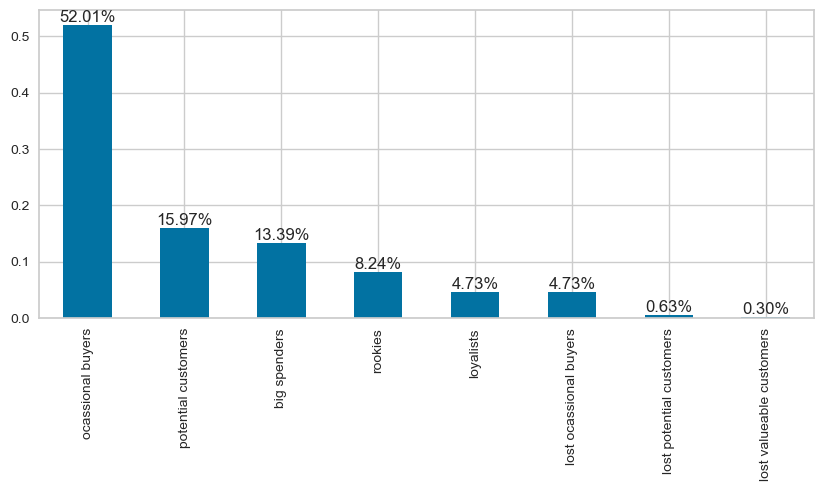

In [773]:
# simplify the segment by merging similar groups
rfm_data_full['simple_label'] = (rfm_data_full['label']
                                .replace(['forget it', 'lost loyalists', 'lost big spenders'],'lost customers')
                                .replace('potential loyalists', 'potential customers')
                                .replace('champions', 'loyalists')
                               )

# visualize the simplify segmentation
plt.figure(figsize=(10,4))
rfm_data_full['simple_label'].value_counts(normalize=True).plot(kind='bar')

# Add annotations to the bars
value_counts = rfm_data_full['simple_label'].value_counts(normalize=True)
for i, v in enumerate(value_counts):
    plt.text(i, v, f"{v:.2%}", ha='center', va='bottom')
    
plt.show()

In [774]:
# check typical transaction frequency in `big spenders`
rfm_data_full.query('label == "big spenders"')['frequency'].value_counts()

4     122
5     115
6     109
7     106
8      76
3      72
9      59
11     54
10     51
Name: frequency, dtype: int64

In [775]:
# check typical transaction frequency in `big spenders`
rfm_data_full['frequency'].value_counts(normalize=True).head()

1    0.504119
2    0.145662
3    0.087993
4    0.069238
5    0.041367
Name: frequency, dtype: float64

**Visualize Customer Segmentation**

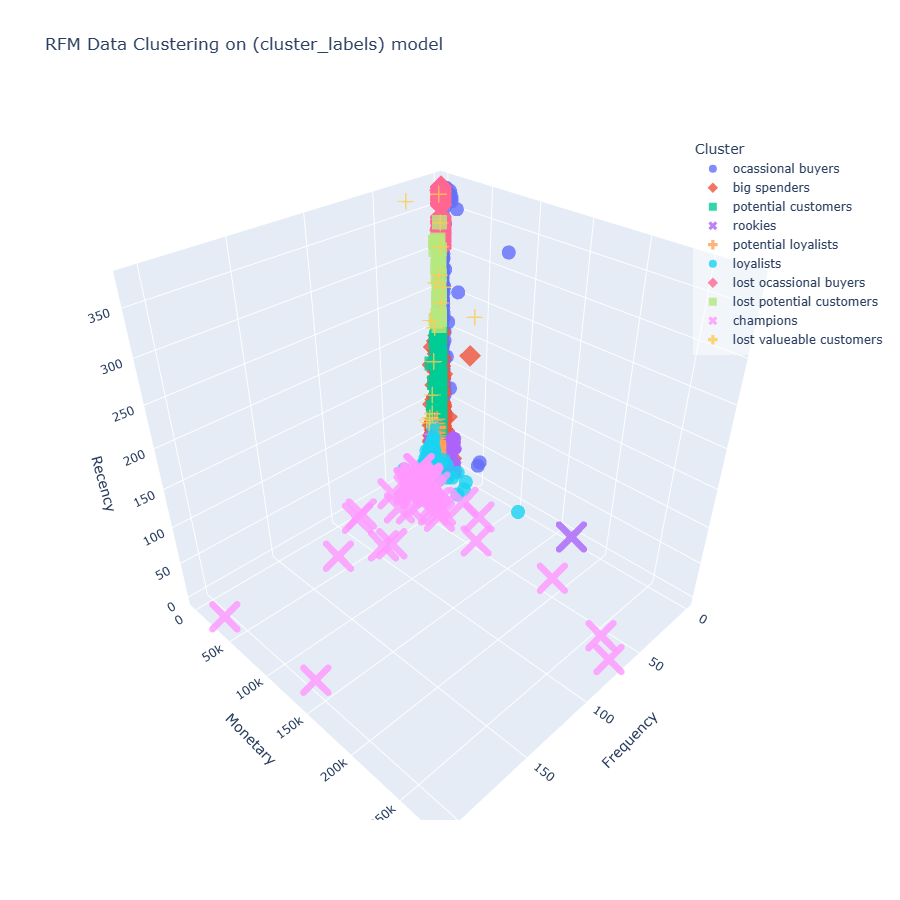

In [776]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=rfm_data_full,
                    cluster_labels='label',
                    cluster_colors=cluster_10colors)

**INSIGHT:**<br>
- The overall patterns identified in the RFM segmentation for the `clean_df_full` dataset align with those observed in the `clean_df` dataset.
- However, the `clean_df_full` dataset shows a higher proportion of `occasional buyers` or `one-time buyers` compared to other segments.
- This insight highlights the dominance of `one-time buyers` in terms of both the number of customers and revenue for the business.
- It suggests that retaining and converting these `one-time buyers` into loyal customers should be a priority in order to increase customer retention and maximize revenue.

#### RFM + KMeans 

**Generate Customer Segmentations**

In [777]:
# retrieve features for RMF + KMeans model
rfm_features_full.head()

,recency,frequency,monetary
0,1.865521,-0.362800,9.576454
1,-1.030098,0.519958,0.319330
2,-0.375670,0.078579,-0.045596
3,-0.886662,-0.362800,-0.043016
4,1.731050,-0.362800,-0.190771


In [778]:
# apply `kmeans_clustering` function
# generate custumer segmentation with 5 clusters
kmeans_clustering (rfm_features_full, 5, rfm_data_full, 'cluster_km5_rfm')

# standardize the cluster
rfm_data_full['cluster_km5_rfm'] = rfm_data_full['cluster_km5_rfm'] + 1

In [779]:
# check clusters' characteristics
(rfm_data_full
 .groupby('cluster_km5_rfm')['recency', 'frequency', 'monetary']
 .agg(['min', 'max', 'median', 'mean'])
 .sort_values(by=('monetary', 'mean'), ascending=False)
)

recency                         frequency              \
                    min  max median        mean       min  max median   
cluster_km5_rfm                                                         
3                     0   24    4.5    7.000000         2   72   50.0   
5                     0   38    1.0    5.750000        62  206   94.0   
4                     0  372    5.0   14.656652         1   62   18.0   
1                     0  163   36.0   47.608659         1   14    2.0   
2                   148  373  252.0  254.898305         1   12    1.0   

                              monetary                                        
                       mean        min        max      median           mean  
cluster_km5_rfm                                                               
3                 42.333333  116560.08  279138.02  181431.645  190463.870000  
5                119.250000   11189.91  136161.83   49629.035   52940.947500  
4                 20.386266    1296.44   91062.38    7202.010   12296.826910  
1                  3.225577       0.79   14838.86     790.810    1299.861017  
2                  1.278891       0.42   21389.60     310.470     643.007612

In [780]:
# check segments proportion
rfm_data_full['cluster_km5_rfm'].value_counts(normalize=True)

1    0.615425
2    0.341280
4    0.040841
5    0.001402
3    0.001052
Name: cluster_km5_rfm, dtype: float64

**Visualize Customer Segmentation**

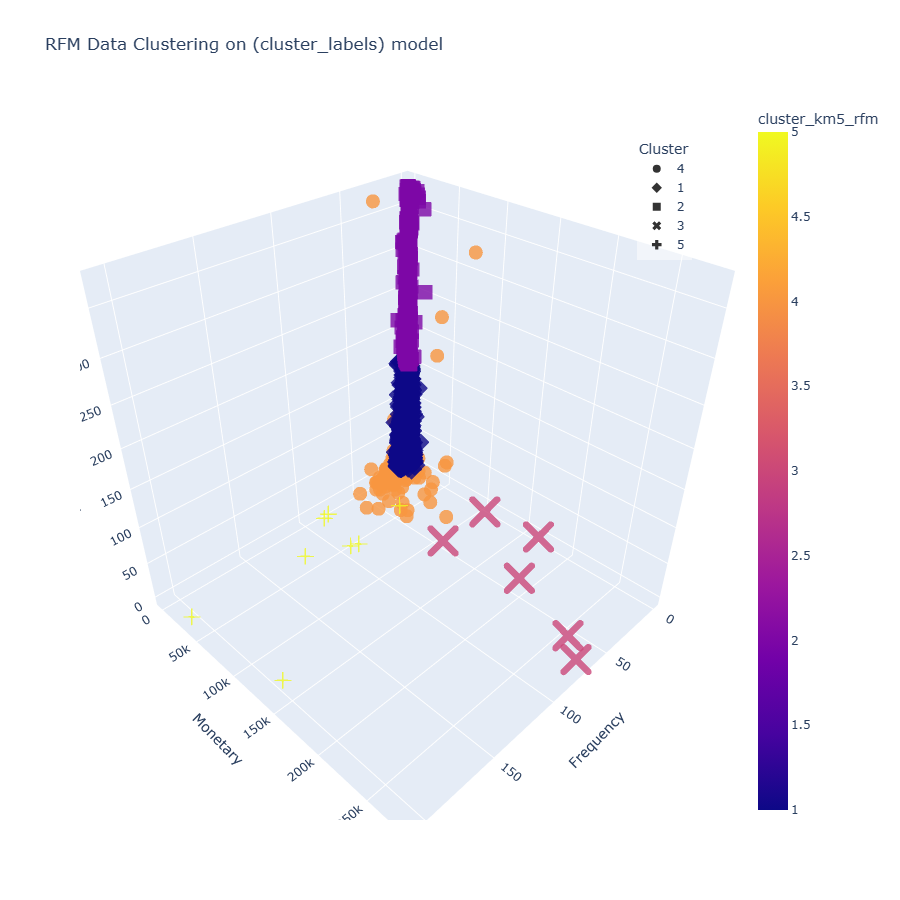

In [781]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=rfm_data_full,
                    cluster_labels='cluster_km5_rfm',
                    cluster_colors=cluster_5colors)

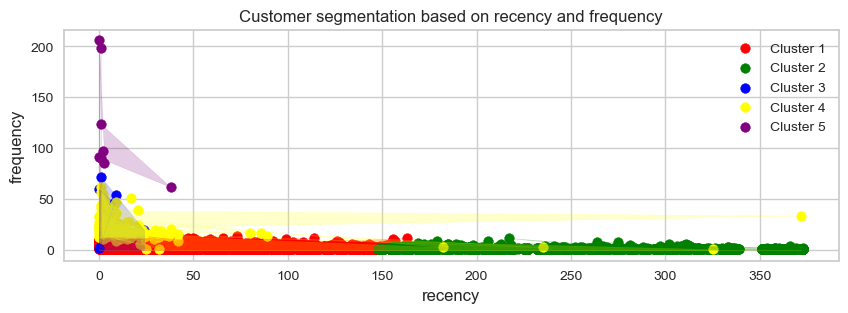

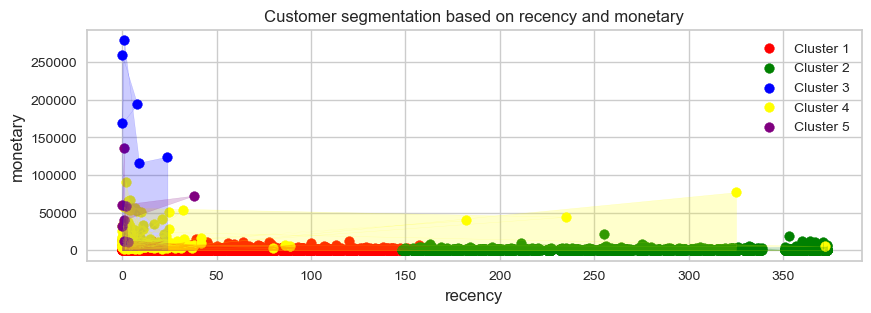

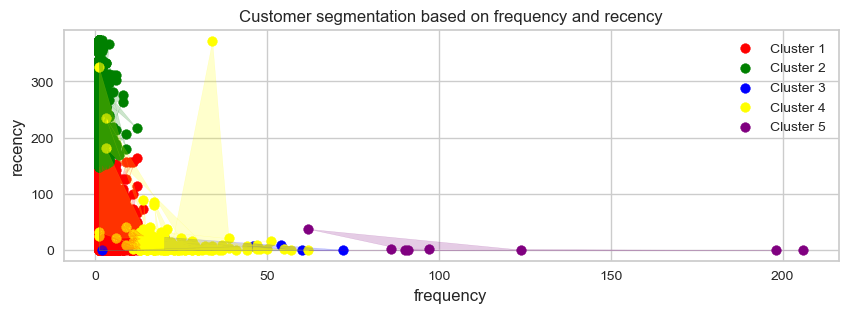

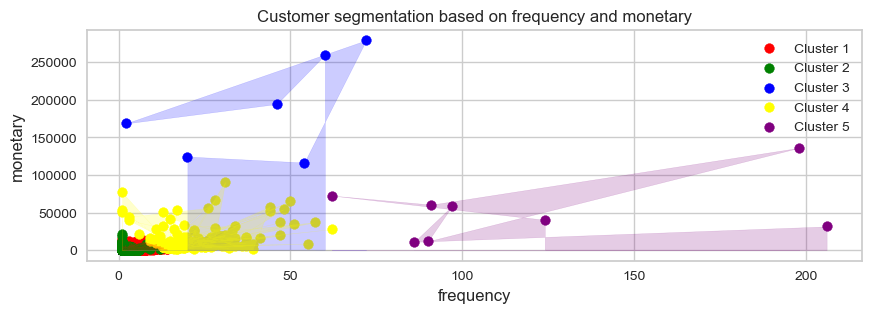

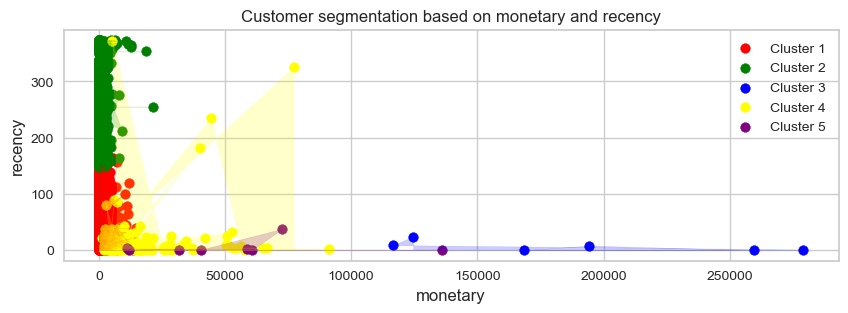

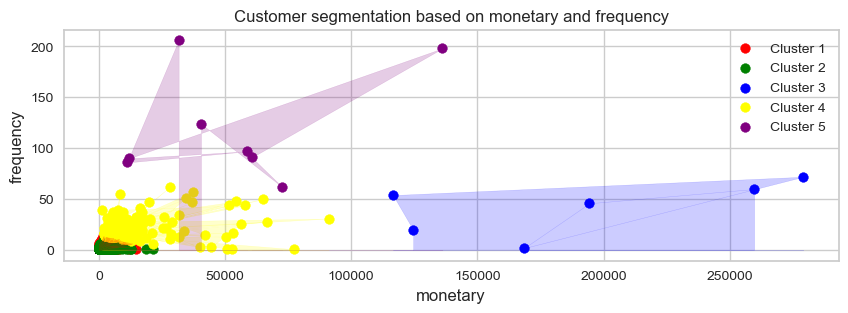

In [782]:
# define features to be visualized
rfm_features_test = ['recency', 'frequency', 'monetary']

# visualize the cluster distributions based on two variables
for i in rfm_features_test:
    for j in rfm_features_test:
        if i != j:
            scatterplot_clusters_2d (data=rfm_data_full,
                                     x=i,
                                     y=j,
                                     number_clusters=5,
                                     cluster_label='cluster_km5_rfm',
                                     colors=colors_5)

**INSIGHT:**<br>
- The RFM + KMeans segmentation reveals that up to 70% of the customers fall into the `cluster 1`, indicating they commonly made 3 transactions and generated medium to low revenue throughout the year.
- Followed by `cluster 3`, contributing almost 25% of customers. This cluster may be considered cheap customers who have low engagement and low revenue. 
- It suggests that most `EVERYTHING PLUS` customers (around 95%) are cheap customers.
- Less than 5% of customers (`cluster 5, 2, 4`) are considered valuable customers who show good engagement, more frequent transactions, and generate high revenue

**INSIGHT:**<br>
- The overall patterns identified in the RFM+KMeans segmentation for the `clean_df_full` dataset align with those observed in the `clean_df` dataset.
- The only difference is just the proportion number (accuracy)

#### KMeans

**Generate Customer Segmentations**

In [783]:
# retrieve features
features_model_full.head()

,recency,n_trans,n_items,quantity,aov,expensive_price
0,1.865521,-0.362800,-0.675156,16.561243,37.571363,-0.434982
1,-1.030098,0.519958,0.328423,0.335379,0.017362,-0.305383
2,-0.375670,0.078579,-0.478376,0.306887,-0.108395,-0.434982
3,-0.886662,-0.362800,0.023414,-0.077973,0.430255,0.213016
4,1.731050,-0.362800,-0.527571,-0.176110,-0.140232,-0.434982


In [784]:
# apply `kmeans_clustering` function
# generate customer segmentation with 5 clusters
kmeans_clustering (features_model_full, 5, features_data_full, 'cluster_km5')

# sync columns name
features_data_full.rename(columns={'n_trans':'frequency', 'total_monetary':'monetary'}, inplace=True)

# standardize the cluster
features_data_full['cluster_km5'] = features_data_full['cluster_km5'] + 1

In [785]:
# describe the clustering result
(features_data_full
 .groupby('cluster_km5')
 .agg(['min', 'max', 'median', 'mean'])
 .drop(columns='uid')
 .sort_values(by=('monetary', 'mean'), ascending=False)
)


recency                         frequency                         \
                min  max median        mean       min  max median       mean   
cluster_km5                                                                    
5                 0  325   28.5   95.500000         1    2    1.0   1.250000   
3                 0   38    2.0    5.818182        20  206   58.5  73.681818   
4                 0  373  140.0  160.405573         1   55    1.0   1.588235   
2                 0  179   31.0   41.794552         1   47    3.0   4.385685   
1               126  373  243.0  246.923885         1   34    1.0   1.311811   

             monetary                                     n_items        \
                  min        max     median          mean     min   max   
cluster_km5                                                               
5            50653.91  168472.50  65062.270  87312.737500       1   101   
3            11189.91  279138.02  59697.415  85665.503182      28  1785   
4              972.91   53258.43   2026.720   3407.470093      86  1118   
2                1.25   56252.72    860.860   1735.118858       1   500   
1                0.42   44534.30    278.380    485.469438       1   288   

                               quantity                                 \
            median        mean      min     max   median          mean   
cluster_km5                                                              
5             51.0   51.000000    13956   80997  44182.0  45829.250000   
3            404.5  522.409091     6177  196844  39127.0  49479.454545   
4            242.0  306.473684      219   19068    623.0   1077.628483   
2             45.0   66.701536        1   32744    491.0   1027.884671   
1             18.0   29.558530        1   18028    102.0    206.937008   

                      aov                                            \
                      min           max        median          mean   
cluster_km5                                                           
5            50653.910000  84236.250000  65062.270000  66253.675000   
3              130.115233   6228.226500   1153.601458   1669.216811   
4              154.656909  21389.600000   1892.940000   2803.470310   
2                1.250000   6778.730000    298.286667    403.881537   
1                0.420000  14844.766667    213.820000    372.514881   

            avg_quantity                                           low_price  \
                     min           max        median          mean       min   
cluster_km5                                                                    
5             140.089109  74215.000000  13569.984848  25373.764701         0   
3               7.569853   1087.500000    157.737940    265.543175         3   
4               1.515695     43.210145      2.457672      3.373241         0   
2               1.000000   8000.000000     11.607843     29.023940         0   
1               1.000000   4300.000000      5.015625     21.952504         0   

                                    moderate_price                           \
             max median        mean            min   max median        mean   
cluster_km5                                                                   
5             10    5.0    5.000000              0    82   42.5   41.750000   
3            595  166.0  181.772727             19  1402  237.0  398.136364   
4            241   40.0   49.160991             74   901  181.0  231.433437   
2            230   10.0   16.817444              0   361   33.0   49.870183   
1             90    1.0    4.354856              0   210   14.0   23.216798   

            expensive_price                         
                        min  max median       mean  
cluster_km5                                         
5                         0    9    4.0   4.250000  
3                         0   78    6.0  15.363636  
4                         4  141   22.0  27.318885  
2               

In [786]:
# check segments proportion
features_data_full['cluster_km5'].value_counts(normalize=True)

2    0.604908
1    0.333918
4    0.056617
3    0.003856
5    0.000701
Name: cluster_km5, dtype: float64

**Visualize Customer Segmentation**

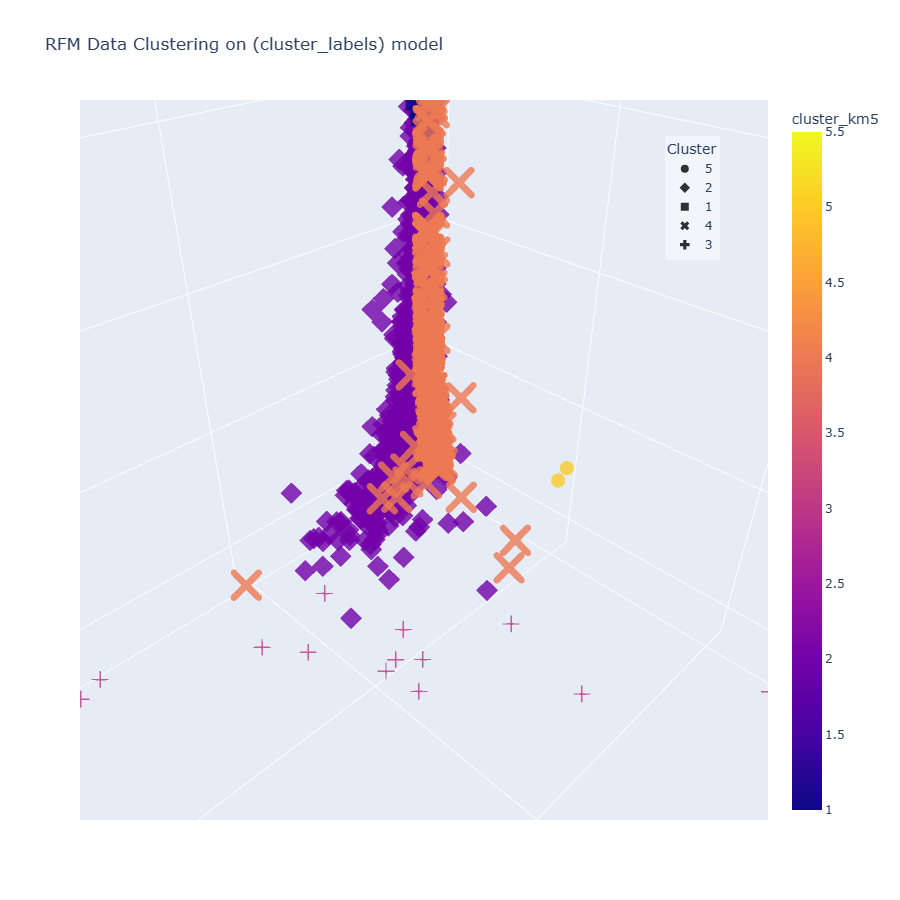

In [787]:
# Create the 3D rfm scatter plot to check clusters' distributions
scatterplot_rfm_3d (data=features_data_full,
                    cluster_labels='cluster_km5',
                    cluster_colors=cluster_5colors)

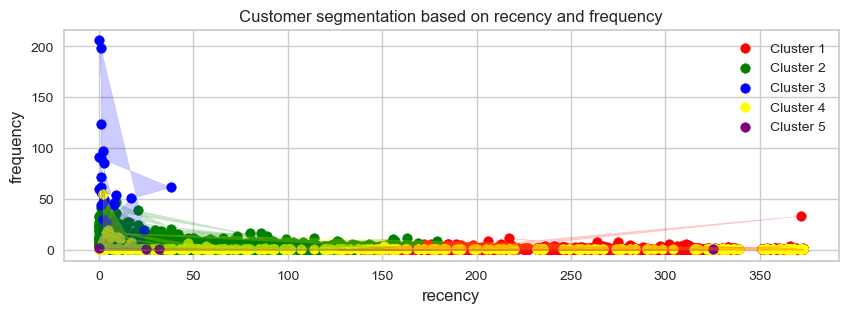

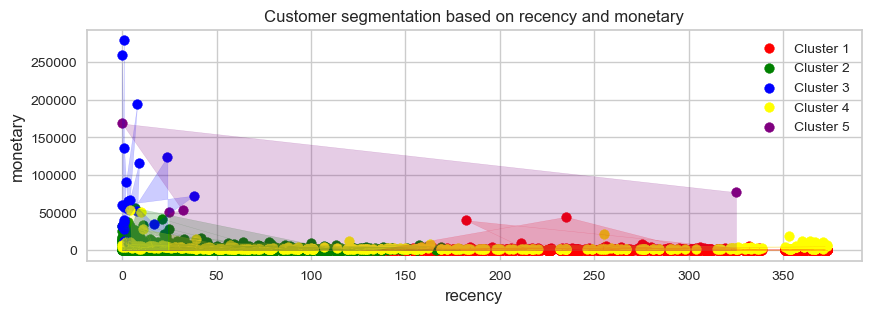

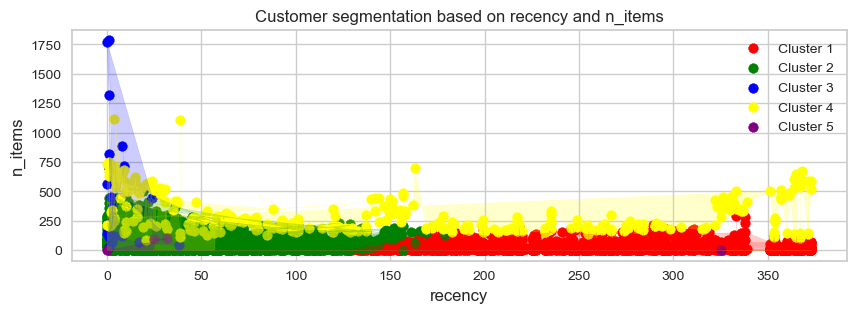

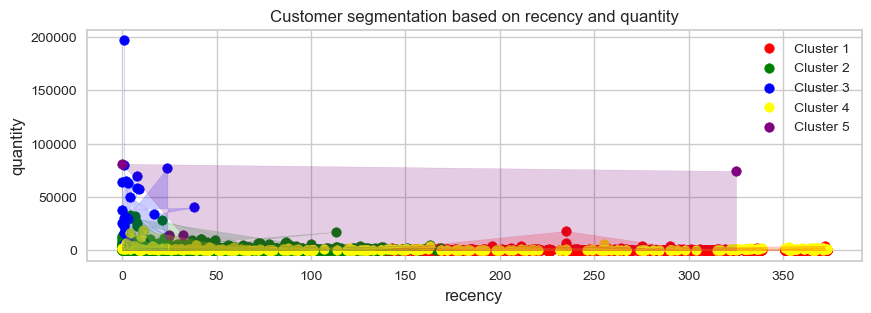

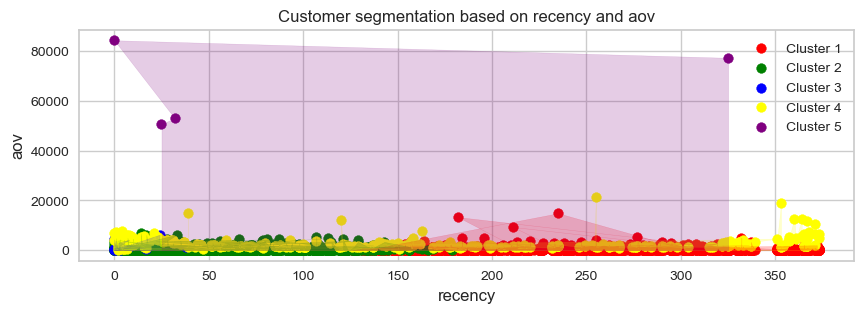

...

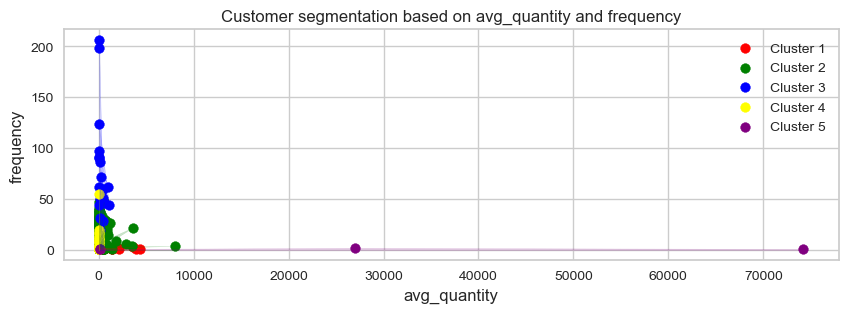

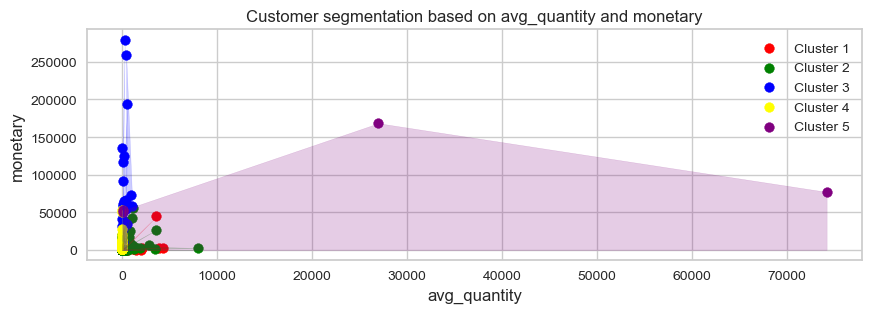

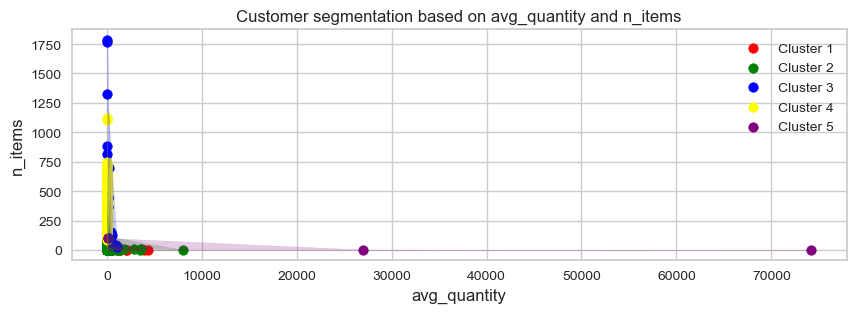

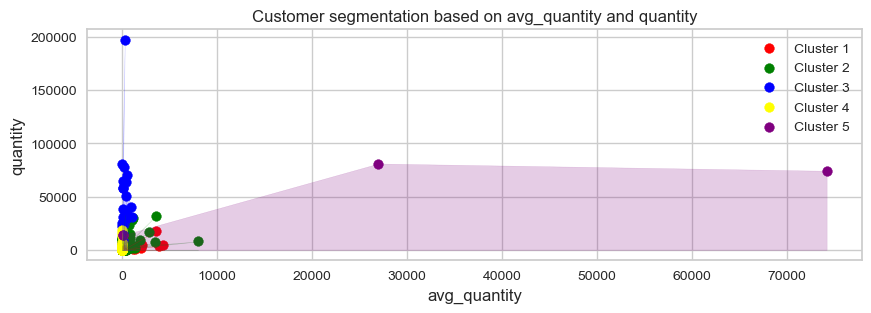

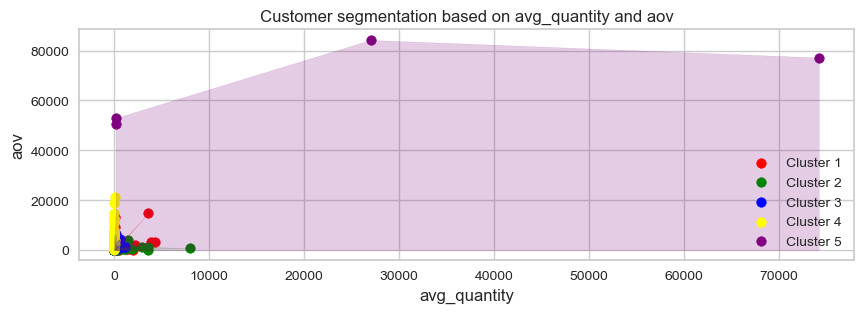

In [788]:
# define features to be visualized
features_test = ['recency', 'frequency', 'monetary', 'n_items', 'quantity', 'aov', 'avg_quantity']

# visualize the cluster distributions based on two variables
for i in features_test:
    for j in features_test:
        if i != j:
            scatterplot_clusters_2d (data=features_data_full,
                                     x=i,
                                     y=j,
                                     number_clusters=5,
                                     cluster_label='cluster_km5',
                                     colors=colors_5)

**INSIGHT:**<br>
- The overall patterns identified in the RFM+KMeans segmentation for the `clean_df_full` dataset align with those observed in the `clean_df` dataset.
- The only difference is just the proportion number (accuracy)
- The cluster distribution can be clearly observed in the scatter plot diagram between recency and the number of items purchased.

## CONCLUSION

The purchased history dataset contains the following:
- Duplicates.
- Inconsistency description of stock code.
- Negative values due to discount/promo/return/cancel orders.

Missing values on `CustomerID` and `Description` of stock code.
The preprocessing stage adjusted the name columns for convenience, removed duplicates, made the description data uniform/consistent, and excluded all negative values in `quantity` and `unit_price`. We generated two versions of the dataset to handle missing values in `uid` (`CutomerID`). One (`clean_df_full`) with imputed missing values in `uid`, where we assumed that one transaction was mostly made from one `uid`. The second dataset (`clean_df`) removed all missing values in `uid`, since the analysis will determine customer behaviour so that each customer (`uid`) becomes our main interest. In addition, we enrich the dataset by establishing new columns (`date`, `monetary`, `first_buy`, `last_buy`, and `recency`)

We conduct exploratory data analysis (EDA) using both version datasets (`clean_df_full` and `clean_df` to identify customer behaviour patterns. This stage consists of seasonal analysis and accumulated customer behaviour throughout one year.
- In seasonal analysis, we found that seasonality does not significantly affect customer behaviours. The purchase history dataset seemed to have excluded purchase records under occasional offers. Only a small increase was observed in total transactions, unique customers, revenue, and the number of purchased item variants during Q4 (November-December), both monthly and daily. We can assume that this dataset can be used to capture normal users' behaviours. 
- In customers' behaviours analysis, we found the distribution of customers' behaviour all variables are positively skewed (`recency`, `transaction frequency`, `revenue (monetary)`, `average revenue per transaction / average order value (AOV)`, `purchased items variants`, `quantity`, and `average quantity)`. All the variables seem to have a positive correlation with each other, unless for the `recency`, which has a negative correlation with all variables. Most customers (>95%) purchase low and medium-price items.

Based on that finding, we formulated twelve hypotheses and presented statistical tests. We conduct relationship tests using Spearman Correlation Test and different tests using McNemar's since all variables are not normal distributions. Using alpha level 0.05. Both datasets (`clean_df` and `clean_df_full`) suggest rejecting all hypotheses null H1-H12. It implies that <br>
1. the customers' behaviours' in the first month correlate significantly with the customers' behaviours in the future months
2. the `recency` correlates significantly with  `total_monetary`, `n_items`, `quantity`, and `n_trans.`
3. there is a different number of items purchased from expensive and mediocre-priced items. The relative difference between both groups is almost similar(> 90%). It suggested that mediocre-price items were purchased more often than expensive-priced products. The customers in `clean_df_full` tend to purchase expensive-priced items more than the customers in `clean_df`

After conducting features engineering, we performed three methods of clustering (RFM, RFM+KMeans, and KMeans). Both versions of datasets generate almost similar clustering results. The difference is in the proportions and cluster descriptions. 

For more accurate analysis and insight, Conducting further research about product categories and their relationship to the customer's behaviour is better. Analyzing how promo/offers/postage can influence customers' purchases is also advisable. More personalized offers may lead to more purchases. 

## RECOMMENDATIONS STRATEGY

Based on customer segmentation (i.e. which tend to divide customers based on `recency` and `n_items` purchased), here are some recommendation strategies for developing personalized campaigns or promotions:

1. **Recency-based promotions:** <br>Target customers who have made a purchase recently but have not made a purchase in a specific time frame. Offer them exclusive discounts or special offers to encourage repeat purchases.

2. **Upselling and cross-selling:** <br>Identify customers who have purchased a certain number of items variant and offer them personalized recommendations for complementary or higher-value products. For example, if a customer has purchased multiple clothing items, suggest matching accessories or items from the same collection.

3. **Loyalty rewards:** <br>Create a loyalty program where customers earn points or rewards based on the number of items variant purchased and the recency of their purchases. Offer exclusive perks, discounts, or freebies to loyal customers to incentivize repeat purchases.

4. **Personalized recommendations:** <br>Leverage customer purchase history to provide personalized product recommendations. Use collaborative filtering or content-based recommendation algorithms to suggest items similar to those previously purchased by the customer.

5. **Limited-time offers:** <br>Create time-limited promotions targeting customers who have not made a purchase in a specific time period or have not explored a certain range of items variant. Offer them limited-time discounts or exclusive access to new products to create a sense of urgency and encourage them to make a purchase.

6. **Targeted email campaigns:** <br>Send personalized emails to customers based on their purchase history, focusing on their recency and the types of items variant they have purchased. Tailor the content, offers, and recommendations in the emails to make them relevant and engaging to each customer segment.

7. **Abandoned cart reminders:** <br>Identify customers who have added items variant to their cart but did not complete the purchase. Send automated reminders with personalized incentives to encourage them to finalize the purchase.

8. **Re-engagement campaigns:** <br>Target customers who have not made a purchase for an extended period. Send them targeted campaigns with exclusive offers or rewards to re-engage them and bring them back to your store.

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Ica, You have really done a great job in all the aspects. It reflects your hard work that you have put in this project. You covered different ways to do the segmentation and also nicely explained the recommendation strategy.


## PRESENTATION

Please kindly check my presentation by clicking [this link.](https://drive.google.com/drive/folders/19Gr6lVfvIWFRS61PnK66Ljvqgec3RGEt?usp=sharing)

Thank you


<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Good job with the presentation as well. This presentation have a good balance of technical and business stuffs and is easier to understand for business stakeholders


## DASHBOARD

Please kindly check my dashboard by clicking [this link.](https://public.tableau.com/views/CustomerSegmentationModel_16871654802170/CustomerSegmentationModels?:language=en-US&:display_count=n&:origin=viz_share_link)

Thank you

<div class="alert alert-warning">
<b>Reviewer's comment v1:</b>
    
Dashboard could have been better. But it does the job the summarise the statistics

### Dashboard data

This section will generate the dashboard data source. 

In [789]:
# aggregate, choosing relevant features, and export data for customer segmentation

cust_segmentation = pd.concat([features_data, rfm_data[['r_score', 'f_score', 'm_score', 'label', 'cluster_km5_rfm']]], axis=1)
cust_segmentation.rename(columns={'label':'rfm', 'cluster_km5_rfm':'rfm_kmeans', 'cluster_km5':'kmeans'}, inplace=True)

In [790]:
# arrange the columns
cust_segmentation = cust_segmentation[['uid', 'recency', 'frequency', 'monetary', 'aov', 'quantity', 'avg_quantity',
                              'n_items', 'low_price', 'moderate_price', 'expensive_price', 'r_score', 'f_score', 'm_score',
                              'rfm', 'rfm_kmeans', 'kmeans']]

In [791]:
# retrieve data
cust_segmentation.tail()

,uid,recency,frequency,monetary,aov,quantity,avg_quantity,n_items,low_price,moderate_price,expensive_price,r_score,f_score,m_score,rfm,rfm_kmeans,kmeans
4329,18280,277,1,180.60,180.600000,45,4.500000,10,0,10,0,1,1,1,lost ocassional buyers,3,2
4330,18281,180,1,80.82,80.820000,54,7.714286,7,3,2,2,2,1,1,ocassional buyers,3,2
4331,18282,7,2,178.05,89.025000,103,8.583333,12,3,6,3,5,1,1,rookies,1,1
4332,18283,3,16,2039.58,127.473750,1355,5.171756,262,81,195,1,5,4,4,loyalists,5,4
4333,18287,42,3,1837.28,612.426667,1586,26.881356,59,22,39,0,4,2,4,big spenders,1,1


In [792]:
# export customer segmentation model
cust_segmentation.to_csv('cust_segmentation.csv', index=False)

In [793]:
cust_segmentation.rfm.value_counts()

ocassional buyers           1832
big spenders                 782
potential customers          769
rookies                      259
lost ocassional buyers       245
loyalists                    164
potential loyalists          110
lost potential customers     106
champions                     37
lost valueable customers      30
Name: rfm, dtype: int64